<a href="https://colab.research.google.com/github/SergeiVKalinin/ACerS_AE_2024/blob/main/23_Co_orchestration_Raman%26BEPS_Sm_BFO_corr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Analysis codes for the article: **Co-orchestration of Multiple Instruments to Uncover Structure-Property Relationships in Combinatorial Libraries**

* Author [Boris Slautin](https://scholar.google.com/citations?hl=ru&view_op=list_works&gmla=AH70aAU_JtxEIQgg_RTLPnUSZHKp1J1iDrJUxTZ7Dzw5p5jEtCEug5zMWLCh4A-pe5ekW_9a_aXHOSIjEp-2UT_kypL9DfD7GcD76qEpeOzSkAibBjmm_7RL&user=Y2AXABsAAAAJ)

* Linear VAE class is developed by [Utkarsh Pratish](https://scholar.google.com/citations?user=BqhnGGAAAAAJ&hl=en)

* Raman data collection and analysis are conducted by [Ilia Ivanov](https://scholar.google.com/citations?user=NDHl4HEAAAAJ&hl=en)

* BEPS PFM experimentations and dataset analysis are performed by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en)

* Sm-BFO combinatorial library mas made by [Rohit Pant](https://scholar.google.co.in/citations?user=7lhXiEIAAAAJ&hl=en), [Xiaohang Zhang](https://scholar.google.com/citations?user=oYV1XaUAAAAJ&hl=en), and [Ichiro Takeuchi](https://scholar.google.com/citations?user=OB9Pab8AAAAJ&hl=en)

* [GPax](https://gpax.readthedocs.io/en/latest/) lib is developed by [Maxim Ziatdinov](https://scholar.google.com/citations?user=YnSdOoUAAAAJ&hl=en)

* Idea and project leadership by [Sergei Kalinin](https://scholar.google.com/citations?hl=en&user=-cuxoSQAAAAJ&view_op=list_works&sortby=pubdate)



Created: February, 2024

Updated: April, 2024




In [1]:
!pip install --upgrade --no-cache-dir gdown==4.6.0
!pip install mycolorpy
!pip install renishawWiRE
!pip install git+https://github.com/ziatdinovmax/gpax@main

  Attempting uninstall: gdown
    Found existing installation: gdown 5.1.0
    Uninstalling gdown-5.1.0:
      Successfully uninstalled gdown-5.1.0
  Preparing metadata (setup.py) ... done
  Created wheel for mycolorpy: filename=mycolorpy-1.5.1-py3-none-any.whl size=3851 sha256=4ff5aa99b5cf3147030ff4f9c3501299ef7dac3fa1c4d77e1dddbb5d94508d83
  Stored in directory: /root/.cache/pip/wheels/d6/1d/04/f8bfb8b04e3daba330b3f377c041b89304271ff98fb6704946
Successfully built mycolorpy
  Cloning https://github.com/ziatdinovmax/gpax (to revision main) to /tmp/pip-req-build-4anfekog
  Running command git clone --filter=blob:none --quiet https://github.com/ziatdinovmax/gpax /tmp/pip-req-build-4anfekog
  Resolved https://github.com/ziatdinovmax/gpax to commit 5209d3c760f54a968c95b718eb5fc2980d0d8fcc
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached numpyro-0.1

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mycolorpy import colorlist as mcp

from renishawWiRE import WDFReader

import h5py

import torch

from IPython.core.display import Video
import imageio

import gpax
import numpyro
gpax.utils.enable_x64()

# we'll need these modules for setting up custom priors
import numpyro.distributions as dist
import jax.numpy as jnp

from scipy.stats import multivariate_normal
from scipy.stats import ks_2samp

import h5py

In [3]:
def normalize(data):
  return [np.min(data),np.ptp(data)], (data - np.min(data))/(np.ptp(data))

In [4]:
#@title Linear VAE model
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.losses import binary_crossentropy
import tensorflow.keras as keras
from keras import layers


class CustomVAE(Model):
    """
    Linear Variational Autoencoder (VAE) class.

    Args:
    - encoder: Encoder model.
    - decoder: Decoder model.
    - size: Size of the input data.
    - **kwargs: Additional keyword arguments.

    Methods:
    - call(inputs): Forward pass of the VAE.
    - train_step(data): Custom training step for the VAE.
    - plot_latent_space(image_size, n=30, figsize=15): Plot the latent space.

    Attributes:
    - encoder: Instance of the encoder model.
    - decoder: Instance of the decoder model.
    - size: Size of the input images.
    """
    def __init__(self, encoder, decoder, size, **kwargs):
        super(CustomVAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.size = size

    def call(self, inputs):
        z_mean, z_log_var, z = self.encoder(inputs)
        reconstructed = self.decoder(z)
        return reconstructed

    def train_step(self, data):
        if isinstance(data, tuple):
            x, y = data
        else:
            x = data
            y = None

        # Check if labels are provided
        if y is None:
            raise ValueError("Digit labels are required for custom training.")


        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(x)
            reconstructed = self.decoder(z)

            # Reconstruction loss
            reconstruction_loss = binary_crossentropy(K.flatten(x), K.flatten(reconstructed))
            reconstruction_loss *= self.size

            # KL divergence
            kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
            kl_loss = -0.5*K.sum(kl_loss, axis=-1)

            # Custom loss
            batch_size = tf.shape(x)[0]
            y_true = tf.cast(y[:batch_size], dtype='float32')
            custom_loss = K.mean(K.square(z[:,0] - y_true), axis=-1)*10

            # Total loss
            total_loss = K.mean(reconstruction_loss + kl_loss + custom_loss)

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {'loss': total_loss, 'reconstruction_loss': reconstruction_loss, 'kl_loss': kl_loss, 'custom_loss': custom_loss}

    def plot_latent_space(self, image_size, n=30, figsize=15):
      # Display a grid of n*n digits (default 30*30)
      grid_x = np.linspace(-4, 4, n)
      grid_y = np.linspace(-4, 4, n)

      fig, ax = plt.subplots(n,n,figsize=(figsize, figsize), constrained_layout=True)
      for i, yi in enumerate(grid_y):
          for j, xi in enumerate(grid_x):
              z_sample = np.array([[xi, yi]])
              x_decoded = self.decoder.predict(z_sample, verbose=0)
              digit = x_decoded[0]
              ax[i,j].plot(digit)
              ax[i,j].set_xticks([])  # Hide x-axis ticks
              ax[i,j].set_yticks([])  # Hide y-axis ticks

      plt.show()


def set_encoder(input_shape, latent_dim=2):
  encoder_inputs = keras.Input(shape=(input_shape,))
  x = layers.Dense(128, activation="relu")(encoder_inputs)
  z_mean = layers.Dense(latent_dim, name="z_mean")(x)
  z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)

  def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

  z = layers.Lambda(sampling)([z_mean, z_log_var])
  encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
  return encoder

def set_decoder(output_shape, latent_dim=2):
  latent_inputs = keras.Input(shape=(latent_dim,))
  x = layers.Dense(128, activation="relu")(latent_inputs)
  decoder_outputs = layers.Dense(output_shape, activation='sigmoid')(x)
  decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
  return decoder

# Raman

In [5]:
#raman data
!gdown https://drive.google.com/file/d/1138KsGU17YaGkn-ZZHw8c41K53UjOLUa/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1138KsGU17YaGkn-ZZHw8c41K53UjOLUa
To: /content/09202023 633nm 20x 5um steps 5s_cosmic.wdf
100% 236M/236M [00:02<00:00, 102MB/s]


In [6]:
wdf_file = "09202023 633nm 20x 5um steps 5s_cosmic.wdf"
reader = WDFReader(wdf_file)

In [7]:
#create 2D array
x_pos = np.unique(reader.xpos)
raw_spectra = reader.spectra[:-5] #remove 5 spectrums
ramanshift = reader.xdata
x_start = reader.map_info['x_start']
raman_array = []

for x in x_pos:
  raman_array.append(raw_spectra[reader.xpos[:-5] == x])

#crop last 15 spectra, measured outside of the lib
raman_array = np.array(raman_array)[:-15]

raman_array_raw = raman_array.mean(1) #average across the equicompositional axis

#normalization on area
raman_array = raman_array/np.trapz(raman_array, axis=2)[:,:,None]

mean_raman, std_raman = raman_array.mean(1), raman_array.std(1)

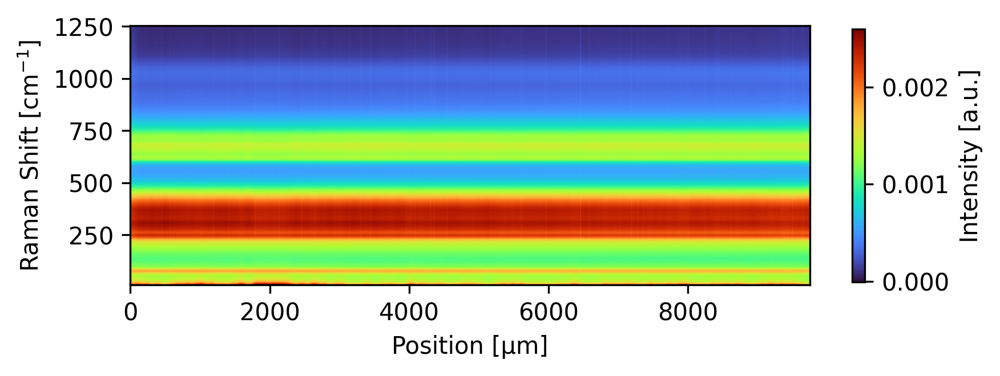

In [8]:
fig, ax = plt.subplots(dpi=300)
im = ax.pcolormesh(x_pos[:-15] - x_start, ramanshift, mean_raman.T,  cmap='turbo')
ax.set_aspect(3)

ax.set_xlabel('Position [µm]')
ax.set_ylabel('Raman Shift [cm$^{-1}]$')
plt.colorbar(im, label='Intensity [a.u.]', shrink=0.4)

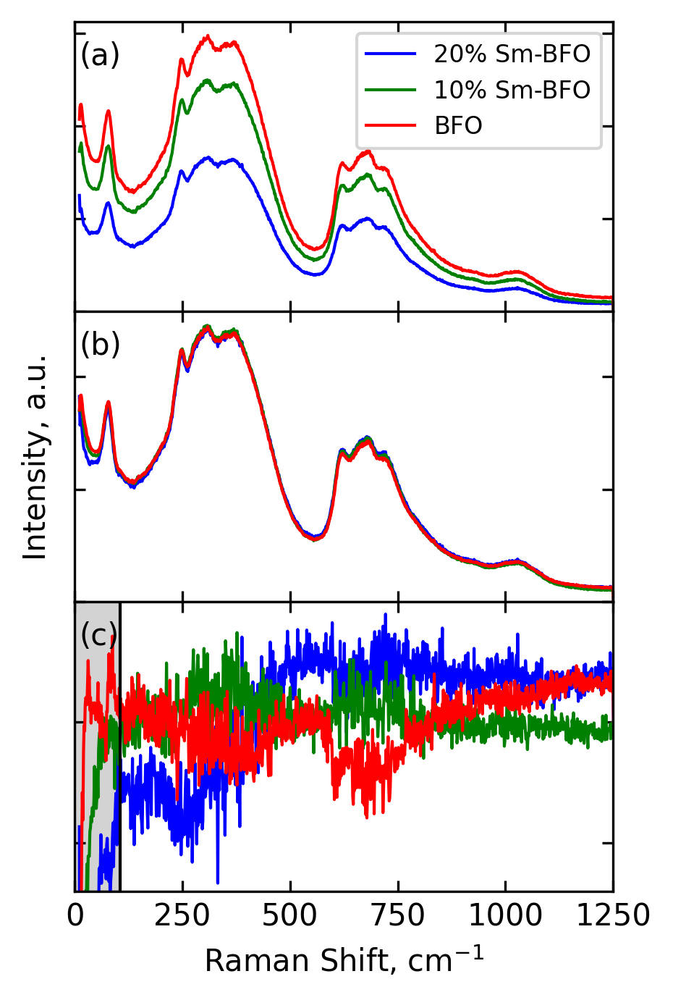

In [9]:
#@title fig s1

footprint = mean_raman - mean_raman.mean(0)
ii = [-1, 1000, 0]
colors=['blue', 'green', 'red']
smbfo = ['20% Sm-BFO', '10% Sm-BFO', 'BFO']
fig, ax = plt.subplots(3,1, figsize=(3.2,5.2), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

for i in range(len(ii)):
  norm_spectrum = raman_array_raw[ii[i]]/np.trapz(raman_array_raw[ii[i]])

  ax[0].plot(ramanshift, raman_array_raw[ii[i]], lw=1, color=colors[i], label=smbfo[i])
  ax[1].plot(ramanshift, norm_spectrum, lw=1, color=colors[i])
  ax[2].plot(ramanshift, footprint[ii[i]]*1e4, lw=1, color=colors[i])

ax[2].set_ylim(-0.7,0.5)
ax[0].legend(fontsize=8)

ylim = ax[2].get_ylim()
ax[2].fill_betweenx(ylim,ramanshift[950], alpha=0.5, color='darkgrey')
ax[2].vlines(ramanshift[950],*ylim, color='black', lw=1)

ylim = ax[0].get_ylim()
ax[0].set_ylim(0,ylim[1])
ax[0].text(10, 0.85*ylim[1],'(a)')

ylim = ax[1].get_ylim()
ax[1].set_ylim(0,ylim[1])
ax[1].text(10, 0.85*ylim[1],'(b)')

ylim = ax[2].get_ylim()
ax[2].text(10, 0.85*(ylim[1] - ylim[0])+ylim[0],'(c)')

ax[2].set_xlabel('Raman Shift, cm$^{-1}$')
ax[1].set_ylabel('Intensity, a.u.')

ax[0].set_ylim(0,)

for _ in ax:
  _.tick_params('both', direction='in', top=True, right=True, bottom=True)
  _.set_xlim(0,1250)
  _.set_yticklabels([])

In [10]:
_, norm_mean_raman = normalize(mean_raman[:,:950]- mean_raman[:,:950].mean(0)) #footprint spectra
norm_mean_raman = np.flip(norm_mean_raman, axis=0) #from 20% Sm-BFO to BFO
in_sh = norm_mean_raman.shape[1]
in_sh

950

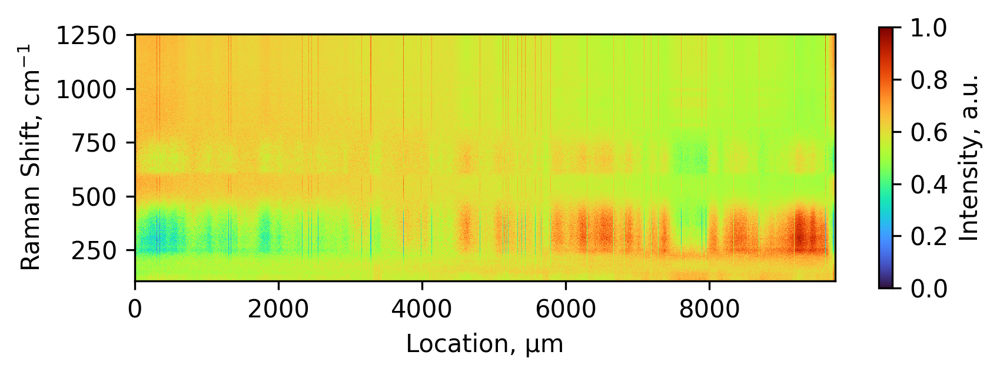

In [11]:
fig, ax = plt.subplots(dpi=300)
im = ax.pcolormesh(x_pos[:-15] - x_start, ramanshift[:950], norm_mean_raman.T,  cmap='turbo')
ax.set_aspect(3)

ax.set_xlabel('Location, µm')
ax.set_ylabel('Raman Shift, cm$^{-1}$')
plt.colorbar(im, label='Intensity, a.u.', shrink=0.4)

# BEPS

In [12]:
#loops
!gdown https://drive.google.com/file/d/15VZEG54h7Q9VGOL5BA2HAHEg_ltB69zk/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=15VZEG54h7Q9VGOL5BA2HAHEg_ltB69zk
To: /content/90nm.zip
100% 220M/220M [00:01<00:00, 148MB/s]


In [13]:
!unzip 90nm.zip

Archive:  90nm.zip
  inflating: 90nm/BEPS_composition0_loop0_0.hf5  
  inflating: 90nm/BEPS_composition0_loop1_0.hf5  
  inflating: 90nm/BEPS_composition0_loop2_0.hf5  
  inflating: 90nm/BEPS_composition1_loop0_0.hf5  
  inflating: 90nm/BEPS_composition1_loop1_0.hf5  
  inflating: 90nm/BEPS_composition1_loop2_0.hf5  
  inflating: 90nm/BEPS_composition10_loop0_0.hf5  
  inflating: 90nm/BEPS_composition10_loop1_0.hf5  
  inflating: 90nm/BEPS_composition10_loop2_0.hf5  
  inflating: 90nm/BEPS_composition11_loop0_0.hf5  
  inflating: 90nm/BEPS_composition11_loop1_0.hf5  
  inflating: 90nm/BEPS_composition11_loop2_0.hf5  
  inflating: 90nm/BEPS_composition12_loop0_0.hf5  
  inflating: 90nm/BEPS_composition12_loop1_0.hf5  
  inflating: 90nm/BEPS_composition12_loop2_0.hf5  
  inflating: 90nm/BEPS_composition13_loop0_0.hf5  
  inflating: 90nm/BEPS_composition13_loop1_0.hf5  
  inflating: 90nm/BEPS_composition13_loop2_0.hf5  
  inflating: 90nm/BEPS_composition14_loop0_0.hf5  
  inflating: 90nm/

In [14]:
# Load all 94*3 loops
all_loops = []


for comp in range (94):
  com_loops = []
  com_coord = []
  for loopnum in range (3):
    hf = h5py.File(r'/content/90nm/BEPS_composition{}_loop{}_0.hf5'.format(comp, loopnum), 'r+')
    beps_qf = hf["BE Quick Fitting/Quick Fitting/Quick Fitting"]
    beps_wv = np.asarray(hf["BEPS/vdc_waveform"])

    com_loops.append(beps_qf[0])
  all_loops.append(com_loops)
all_loops = np.asarray(all_loops)

In [15]:
# correct phase
pha = all_loops[:,:,-1]
mi = np.min(pha)
ma = np.max(pha)

correct_pha = np.where(pha > 1.6, pha + (mi-ma), pha)

correct_pha = correct_pha + np.pi - 1.25
all_loops[:,:,-1] = correct_pha
mean_loops, std_loops = all_loops.mean(1), all_loops.std(1)

In [16]:
# Separate on field and off field loops
loops_on = np.zeros((94, 4, len(beps_wv)))
loops_off = np.zeros((94, 4, len(beps_wv)))

for k in range (len(beps_wv)):
  loops_on[:, :, k] = mean_loops[:, :, 2*k]
  loops_off[:, :, k] = mean_loops[:, :, 1+2*k]

In [17]:
poly_on = loops_on[:,0]*np.cos(loops_on[:,3])
poly_off = loops_off[:,0]*np.cos(loops_off[:,3])

freq_on = loops_on[:,1]
freq_off = loops_off[:,1]

In [18]:
l1,l2 = poly_on.shape
beps_wv_s = beps_wv[:len(beps_wv)//5]

poly_on_s = poly_on.reshape(l1,5,l2//5).mean(1)
poly_off_s = poly_off.reshape(l1,5,l2//5).mean(1)

freq_on_s = freq_on.reshape(l1,5,l2//5).mean(1)
freq_off_s = freq_off.reshape(l1,5,l2//5).mean(1)

Text(0.5, 0.98, 'Blue--> Red corresponds to 20% Sm --> 0% Sm')

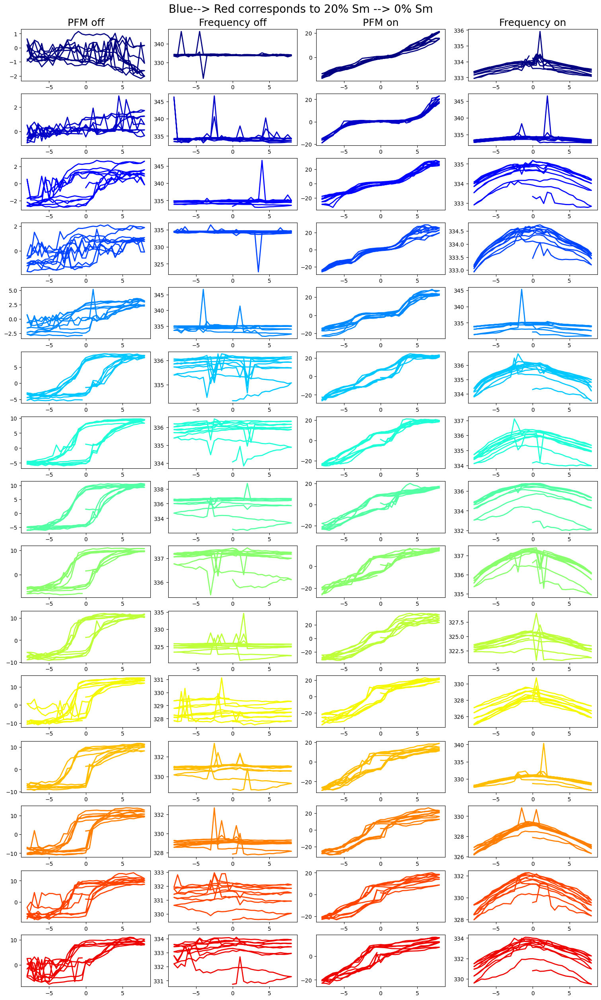

In [19]:
color=mcp.gen_color(cmap="jet",n=94)

fig, ax = plt.subplots(15,4, figsize=(15,25), constrained_layout=True)

ax[0,0].set_title('PFM off', fontsize=18)
ax[0,1].set_title('Frequency off', fontsize=18)
ax[0,2].set_title('PFM on', fontsize=18)
ax[0,3].set_title('Frequency on', fontsize=18)

for i, _ax in enumerate(ax):
  _poly_off = poly_off[l1//15*i]*1E5
  _poly_on = poly_on[l1//15*i]*1E5

  _freq_off = freq_off[l1//15*i]/1E3
  _freq_on = freq_on[l1//15*i]/1E3

  _ax[0].plot(beps_wv, _poly_off, color=color[l1//15*i], lw=2)
  _ax[1].plot(beps_wv, _freq_off, color=color[l1//15*i], lw=2)
  _ax[2].plot(beps_wv, _poly_on, color=color[l1//15*i], lw=2)
  _ax[3].plot(beps_wv, _freq_on, color=color[l1//15*i], lw=2)
fig.suptitle("Blue--> Red corresponds to 20% Sm --> 0% Sm", fontsize=20)

In [20]:
signal = poly_off #choose the signal for VAE

_, norm_poly = normalize(signal)
in_sh = norm_poly.shape[1]


# The orchestrated experiment

In [21]:
#@title Multitask BO and VAE

from ast import Pass
from gpax import MultiTaskGP
from typing import Callable, Dict, Optional
from sklearn.preprocessing import MinMaxScaler

#-----------VAE functions-------------

def VAE(dataset, batch_size=12, latent_dim=2, n_epoch=200, print_statistics=False, test = None, lvae_range = (0,1)):
  x_dataset, y_dataset = dataset
  norm_coef, norm_data = normalize(x_dataset)

  if lvae_range is not None:
    scaler = MinMaxScaler(feature_range=lvae_range)
    y_dataset = scaler.fit_transform(y_dataset[:,np.newaxis]).squeeze()

  in_sh = norm_data.shape[1]
  _encoder = set_encoder(in_sh, latent_dim=latent_dim)
  _decoder = set_decoder(in_sh, latent_dim=latent_dim)
  vae = CustomVAE(_encoder, _decoder, size=in_sh)
  vae.compile(optimizer='rmsprop')

  train_dataset = tf.data.Dataset.from_tensor_slices((norm_data, y_dataset))
  train_dataset = train_dataset.batch(batch_size, drop_remainder=True)

  if print_statistics:
    vae.fit(train_dataset, epochs=n_epoch, verbose=2)
  else:
    vae.fit(train_dataset, epochs=n_epoch, verbose=0)

  if type(test) !=type(None):
    test_norm = (test - norm_coef[0])/norm_coef[1]
    #vae_full = torch.tensor(test_norm, dtype=torch.float)
    full_mean, full_std, _ = vae.encoder.predict(test_norm)
    return vae, norm_coef, (full_mean, full_std)
  else:
    z_mean, z_std, _ = vae.encoder.predict(norm_data)
    return vae, norm_coef, (z_mean, z_std)

def plot_ld(train, test, highlight_latest=True, return_fig=False):
    fig, ax = plt.subplots(1,2,figsize=(10, 4), dpi=100)
    fig.subplots_adjust(wspace=.3)

    ax[0].scatter(test[0][:,-2], test[0][:,-1], color='grey', s=3)
    ax[0].scatter(train[0][:,-2], train[0][:,-1], color='red', s=20, label = 'training')
    if highlight_latest:
      ax[0].scatter(train[0][-1,-2], train[0][-1,-1], color='red', s=60, marker='x', label = 'last_added_point')
    ax[0].set_title('Modality 0')

    ax[1].scatter(test[1][:,-2], test[1][:,-1], color='grey', s=3)
    ax[1].scatter(train[1][:,-2], train[1][:,-1], color='red', s=20, label = 'training')
    if highlight_latest:
      ax[1].scatter(train[1][-1,-2], train[1][-1,-1], color='red', s=60, marker='x', label = 'last_added_point')
    ax[1].set_title('Modality 1')

    ax[1].legend()
    for _ in ax:
      _.grid()
      _.set_xlabel('z1')
      _.set_ylabel('z2')
      _.tick_params('both', direction='in')
    plt.show()

    if return_fig:
      return fig

#-----------MF BO class-------------

class MF_BO(MultiTaskGP):
  '''MultiTaskGP wrapper for co-navigational experiment'''
  def __init__(self,
               data_kernel='Matern',
               num_latents=2,
               lengthscale_prior_dist = None,
               noise_prior_dist = None,
               W_prior_dist = None):

     super().__init__(1, data_kernel=data_kernel,
                         num_latents=num_latents,
                         shared_input_space=False,
                         lengthscale_prior_dist=lengthscale_prior_dist,
                         noise_prior_dist = noise_prior_dist,
                         W_prior_dist=W_prior_dist)

     self.keys = gpax.utils.get_keys(1)

  def iteration(self, X_train, y_train, X_test):
    X_test1 = X_test[X_test[:,1]==0]
    X_test2 = X_test[X_test[:,1]==1]

    self.X_test = (X_test1, X_test2)
    self.X_train, self.y_train = X_train, y_train

    self.fit(self.keys[0], X_train, y_train)

    y_mean1, y_sampled1 = self.predict(self.keys[1], X_test1, noiseless=True)
    y_mean2, y_sampled2 = self.predict(self.keys[1], X_test2, noiseless=True)
    self.y_mean = (y_mean1, y_mean2)
    self.y_sampled = (y_sampled1, y_sampled2)

  def visualize_res(self, vae_latents=[], latent_ind = [-2,-2], **kwargs):

    if not isinstance(self.X_test, tuple):
      pass

    colors = ['red', 'blue']

    fig = plt.figure(figsize=(6, 4))
    for i,y_mean in enumerate(self.y_mean):
      plt.plot(y_mean, c=colors[i], label='Prediction Mod. {}'.format(i))
      plt.fill_between(self.X_test[i][:,0],
                       y_mean - self.y_sampled[i].squeeze().std(0),
                       y_mean + self.y_sampled[i].squeeze().std(0),
                       alpha=0.3, color=colors[i])

      plt.scatter(self.X_train[self.X_train[:,1]==i, 0],
                  self.y_train[self.X_train[:,1]==i],
                  c=colors[i],
                  label='Experiment Mod. {}'.format(i),
                  alpha=0.6)
      if len(vae_latents) == 2:
        plt.plot(self.X_test[i][:,0],
                 vae_latents[i][:,latent_ind[i]], '--',
                 color=colors[i],
                 label='Ground Truth Mod. {}'.format(i),
                 alpha=0.5)

    plt.legend(loc='lower center', fontsize=8, ncol=2)
    plt.grid(True)
    plt.title("Multi-modality experiment");
    plt.show()
    return fig

  def EI_mf_simple(self, cost_ratio=1, maximize = True, visualize=False):

    f1_acq = gpax.acquisition.EI(self.keys[1], self, self.X_test[0], maximize=maximize, noiseless=True)
    f1_acq = np.array(f1_acq)
    f1_acq[np.isnan(f1_acq)==True] = np.random.uniform(low=0.0, high=1.0, size=f1_acq[np.isnan(f1_acq)==True].shape)*1e-3


    f2_acq = gpax.acquisition.EI(self.keys[1], self, self.X_test[1], maximize=maximize, noiseless=True)
    f2_acq = np.array(f2_acq)
    f2_acq[np.isnan(f2_acq)==True] = np.random.uniform(low=0.0, high=1.0, size=f2_acq[np.isnan(f2_acq)==True].shape)*1e-3

    mf_acq =np.hstack((f1_acq/cost_ratio, f2_acq))
    mf_acq = np.array(mf_acq)

    maxacq_idx = mf_acq.argmax()
    maxacq_val = mf_acq.max()
    self.nextpt = X_test[maxacq_idx]

    if visualize:
      fig = self._vis_acq(f1_acq, f2_acq, cost_ratio, self.nextpt, maxacq_val)
    else:
      fig = None

    return maxacq_idx, maxacq_val, fig

  def UE_mf_simple(self, cost_ratio=1, maximize = True, visualize=False):

    f1_acq = gpax.acquisition.UE(self.keys[1], self, self.X_test[0],
                                 recent_points = self.X_train[self.y_train==0],
                                 penalty = 'delta',
                                 noiseless=True)
    f1_acq = np.array(f1_acq)
    f1_acq[np.isnan(f1_acq)==True] = np.random.uniform(low=0.0, high=1.0, size=f1_acq[np.isnan(f1_acq)==True].shape)*1e-3


    f2_acq = gpax.acquisition.UE(self.keys[1], self, self.X_test[1],
                                 recent_points = self.X_train[self.y_train==0],
                                 penalty = 'delta',
                                 noiseless=True)
    f2_acq = np.array(f2_acq)
    f2_acq[np.isnan(f2_acq)==True] = np.random.uniform(low=0.0, high=1.0, size=f2_acq[np.isnan(f2_acq)==True].shape)*1e-3

    mf_acq =np.hstack((f1_acq/cost_ratio, f2_acq))
    mf_acq = np.array(mf_acq)

    maxacq_idx = mf_acq.argmax()
    maxacq_val = mf_acq.max()
    self.nextpt = X_test[maxacq_idx]

    if visualize:
      fig = self._vis_acq(f1_acq, f2_acq, cost_ratio, self.nextpt, maxacq_val)
    else:
      fig = None

    return maxacq_idx, maxacq_val, fig

  @staticmethod
  def _vis_acq(f1_acq, f2_acq, cost_ratio=1, nextpt=None, maxacq_val=None):
    fig = plt.figure(figsize=(6, 4))
    plt.plot(f1_acq/cost_ratio, c='r', label="Acquisition function (Mod. 0)")
    plt.plot(f2_acq, c='b', label="Acquisition function (Mod. 1)")

    if (nextpt is not None) and (maxacq_val is not None):
      plt.scatter(x=nextpt[0], y=maxacq_val, color='k', marker = 'X', s=100, label="Next point, Mod. "+ str(nextpt[1]))

    plt.legend(loc='lower center', fontsize=8)
    plt.title("Acquisition func")
    plt.grid()
    plt.show()
    return fig

  def get_statistics(self,):
    dict_res = {}

    dict_res['X_train']       = np.array(self.X_train).astype(int)
    dict_res['y_train']       = np.array(self.y_train).astype(float)

    dict_res['X_test']        = np.array(self.X_test).astype(int)

    dict_res['noise']         = self.get_samples(1)['noise'].squeeze().mean(0).astype(float)
    dict_res['k_length']      = self.get_samples(1)['k_length'].squeeze().mean(0).astype(float)
    dict_res['W']             = self.get_samples(1)['W'].squeeze().mean(0).astype(float)

    dict_res['y_res_mean']    = np.array(self.y_mean).astype(float)
    dict_res['y_res_uncertainty'] = np.array(tuple(x.squeeze().std(0) for x in self.y_sampled)).astype(float)
    dict_res['next_point'] = np.array(self.nextpt).astype(int)

    return dict_res

In [22]:
#@title auxiliary functions
def convert_to_supported_dtype(arr):
    # Check if array has an object dtype
    if arr.dtype == np.dtype('O'):
        # Attempt conversion to a compatible type (if possible)
        try:
            return arr.astype(np.float64)  # Change to a compatible type (e.g., float)
        except ValueError:
            raise ValueError(f"Cannot convert array '{arr}' to a supported dtype.")
    return arr

def save_dict_to_hdf5(file_path, data_dict):
    def save_data(group, data):
        for key, value in data.items():
            if isinstance(value, dict):
                subgroup = group.create_group(key)
                save_data(subgroup, value)
            elif isinstance(value, np.ndarray):
                # Check and convert object dtype arrays if needed
                value = convert_to_supported_dtype(value)
                group.create_dataset(key, data=value)
            else:
                group.create_dataset(key, data=value)

    with h5py.File(file_path, 'w') as f:
        save_data(f, data_dict)

def load_hdf5_to_dict(file_path):
    def load_data(group):
        data = {}
        for key, item in group.items():
            if isinstance(item, h5py.Group):
                data[key] = load_data(item)
            else:
                data[key] = np.array(item)
        return data

    with h5py.File(file_path, 'r') as f:
        data_dict = load_data(f)

    return data_dict

def make_video(path, fig_list, fps=1):
  llist = []
  for f in fig_list:
    f.canvas.draw()
    rgb_array = np.frombuffer(f.canvas.tostring_rgb(), dtype=np.uint8)
    rgb_array = rgb_array.reshape(f.canvas.get_width_height()[::-1] + (3,))
    llist.append(rgb_array)

    imageio.mimwrite(path, llist , fps = fps)

In [23]:
#to equalize dimensions of modalities arrays
fid1 = norm_mean_raman
_, fid2 = normalize(poly_off)
_, fid3 =  normalize(freq_on)

k = np.array([], dtype=int)
if len(fid1) < len(fid2):
  for i in range(len(fid1)-1):
    k = np.append(k, i*round(len(fid2)/len(fid1)))
  k = np.append(k,-1)
  fid2 = fid2[k.astype(int)]
elif len(fid1) > len(fid2):
  for i in range(len(fid2)-1):
    k = np.append(k, i*round(len(fid1)/len(fid2)))
  k = np.append(k,-1)
  fid1 = fid1[k.astype(int)]


In [24]:
_range = [0,1] #range to scale the linear castom loss

mod1 = (fid1, np.linspace(_range[0], _range[1], len(fid1))) #raman
mod2 = (fid2, np.linspace(_range[0], _range[1], len(fid2))) #BEPS polarization
mod3 = (fid3, np.linspace(_range[0], _range[1], len(fid3))) #BEPS frequency

In [25]:
fid1.shape, fid2.shape, fid3.shape

((94, 950), (94, 320), (94, 320))

####ground truth vae

In [26]:
vae1, _, (z_mod1, z_std1) = VAE(mod1, latent_dim=2, n_epoch=500, lvae_range = (0,1))#, print_statistics=True)
vae2, _, (z_mod2, z_std2) = VAE(mod2, latent_dim=2, n_epoch=500, lvae_range = (0,1))#, print_statistics=True)
vae3, _, (z_mod3, z_std3) = VAE(mod3, latent_dim=2, n_epoch=500, lvae_range = (0,1))#, print_statistics=True)

3/3 [==============================] - 0s 7ms/step


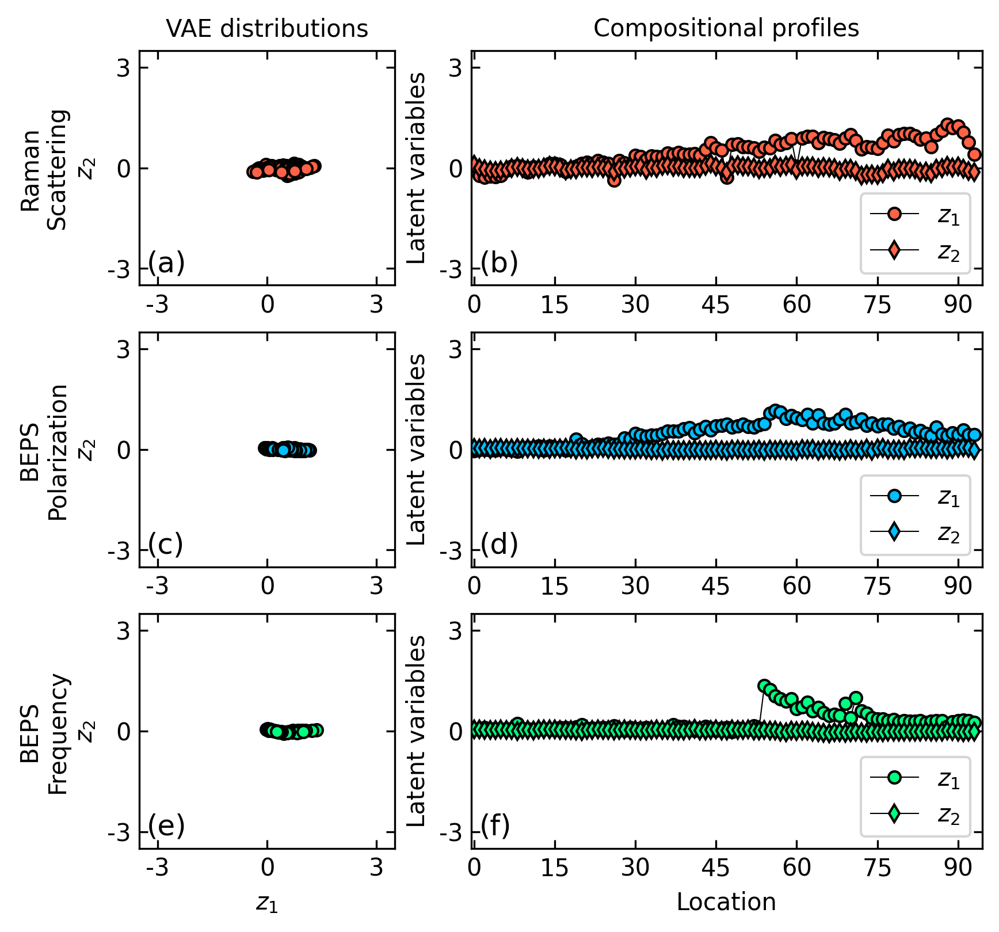

In [27]:
#@title figure: GT profiles
import matplotlib.gridspec as gridspec

z_mod = [z_mod1, z_mod2, z_mod3]
colors = ['tomato', 'deepskyblue', 'springgreen']
modalities = ['Raman\nScattering', 'BEPS\nPolarization', 'BEPS\nFrequency']

fig = plt.figure(figsize=(6.3, 6), dpi = 300)
fig.subplots_adjust(wspace=0.2)
gs = gridspec.GridSpec(3, 2, width_ratios=[1,2], height_ratios=[1, 1, 1])

axes = []

for i in range(3):
  ax = fig.add_subplot(gs[i, 0])#, aspect=1.4/7)
  ax.plot(z_mod[i][:,-2], z_mod[i][:,-1], 'o', color='black',
          markersize=5, markerfacecolor=colors[i], lw=0.5)

  ax.set_xlim(-3.5,3.5)
  ax.set_ylim(-3.5,3.5)
  ax.set_xticks([-3, 0, 3])
  ax.set_yticks([-3,0,3])
  ax.set_xticklabels([-3, 0, 3])
  ax.set_yticklabels([-3,0,3])

  ax.set_ylabel('{}\n$z_2$'.format(modalities[i],))

  axes.append(ax)

for i in range(3):
  ax = fig.add_subplot(gs[i, 1])
  ax.plot(z_mod[i][:,-2], 'o-', color='black',
          markersize=5, markerfacecolor=colors[i], lw=0.5, label='$z_1$')
  ax.plot(z_mod[i][:,-1], 'd-', color='black',
          markersize=5, markerfacecolor=colors[i], lw=0.5, label='$z_2$')

  ax.set_xlim(-.5,94.5)
  ax.set_xticks(np.linspace(0,90,7))
  ax.set_ylim(-3.5,3.5)
  ax.set_yticks([-3,0,3])
  ax.set_yticklabels([-3,0,3])

  ax.set_ylabel('Latent variables')
  ax.legend(loc = 'lower right')


  axes.append(ax)

for _ in axes:
  _.tick_params('both', right='true', top='true', direction='in')




axes[0].set_title('VAE distributions', fontsize=10)
axes[2].set_xlabel('$z_1$', fontsize=10)
axes[3].set_title('Compositional profiles', fontsize=10)
axes[5].set_xlabel('Location', fontsize=10)

axes[0].text(-3.3,-3.1,'(a)', fontsize=12);
axes[1].text(-3.3,-3.1,'(c)', fontsize=12);
axes[2].text(-3.3,-3.1,'(e)', fontsize=12);
axes[3].text(   1,-3.1,'(b)', fontsize=12);
axes[4].text(   1,-3.1,'(d)', fontsize=12);
axes[5].text(   1,-3.1,'(f)', fontsize=12);


1/1 [==============================] - 0s 24ms/step


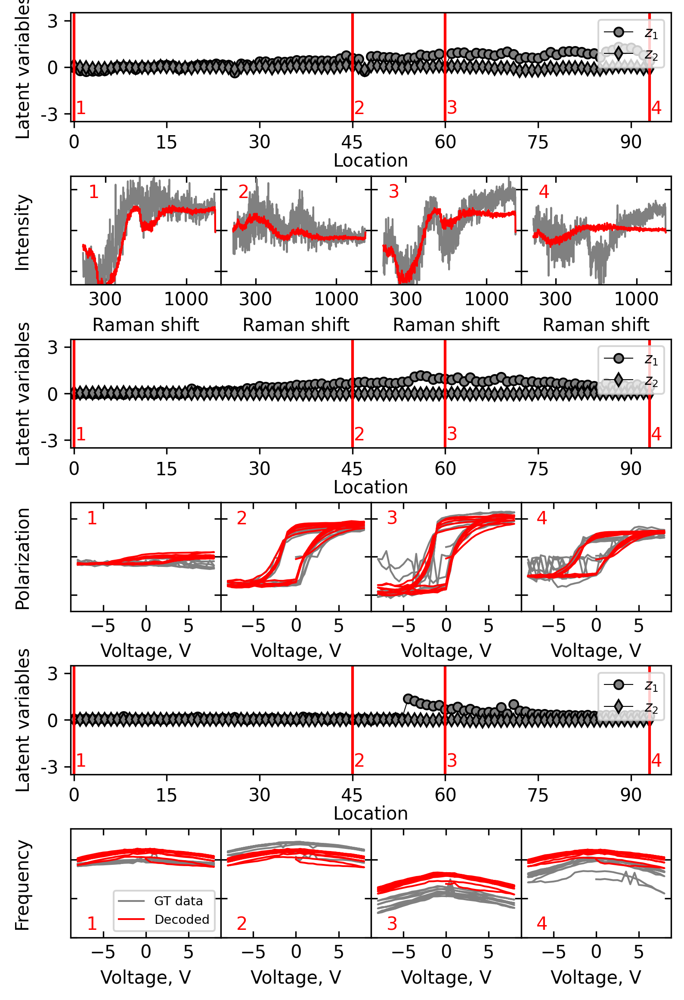

In [28]:
#@title fig s2

locs = [0, 45, 60, 93]


fidd = [fid1, fid2, fid3]
all_vae = [vae1, vae2, vae3]
x_axis = [ramanshift[:950], beps_wv, beps_wv]

fig = plt.figure(figsize=(6, 9.3), dpi = 300)
gs = gridspec.GridSpec(6, 4,hspace=0.5, wspace=0,
                       width_ratios=[ 1,1,1,1],
                       height_ratios=[1,1,1,1,1,1])

for i in range(3):
  ax = fig.add_subplot(gs[i*2, :])
  ax.plot(z_mod[i][:,-2], 'o-', color='black',
          markersize=5, markerfacecolor='grey', lw=0.5, label='$z_1$')
  ax.plot(z_mod[i][:,-1], 'd-', color='black',
          markersize=5, markerfacecolor='grey', lw=0.5, label='$z_2$')

  ax.set_xlim(-.5,96.5)
  ax.set_xticks(np.linspace(0,90,7))
  ax.set_ylim(-3.5,3.5)
  ax.set_yticks([-3,0,3])
  ax.set_yticklabels([-3,0,3])

  ax.set_ylabel('Latent variables')
  ax.set_xlabel('Location', labelpad=0)
  ax.legend(loc = 'upper right', fontsize=8)

  ylim = ax.get_ylim()
  ax.vlines(locs, *ylim, color='red')

  for ind in range(len(locs)):
    ax.text(locs[ind]+0.2, -3, str(ind+1), color='red')

for i in range(3):
  _, n_fid = normalize(fidd[i])
  for j in range(4):
    res = all_vae[i].decoder.predict(z_mod[i][locs[j]][np.newaxis,:])


    ax = fig.add_subplot(gs[i*2+1, j])

    ax.plot(x_axis[i], n_fid[locs[j]], lw=1, color='grey', label='GT data')
    ax.plot(x_axis[i], res.squeeze(), lw=1, color='red', label='Decoded')

    if i==0:
      ax.set_ylim(0.3,0.7)
      ax.set_yticks([0.35,0.5,0.65])
      ax.set_xlim(0,1300)
      ax.set_xticks([300,1000])
      ax.set_xticklabels([300,1000])
      ax.text(150, 0.62, str(j+1), color='red')

      if j==0:
        ax.set_ylabel('Intensity\n ', labelpad=7)
      ax.set_xlabel('Raman shift')

    if i==1:
      ax.set_ylim(0,1)
      ax.set_yticks([0.15,0.5,0.85])
      ax.set_xlabel('Voltage, V')
      ax.text(-7, 0.8, str(j+1), color='red')

      if j==0:
        ax.set_ylabel('Polarization\n ', labelpad=7)

    if i==2:
      ax.set_ylim(0,0.7)
      ax.set_xlabel('Voltage, V')
      ax.text(-7, 0.05, str(j+1), color='red')

      if j==0:
        ax.set_ylabel('Frequency\n ', labelpad=7)

      if j==0:
        ax.legend(fontsize=7, loc='lower right')


    ax.set_yticklabels([])
    ax.tick_params('both', direction='in', right=True, top=True)

In [29]:
fid = [fid1, fid3]

#latent variables for gp
lv_gp = [-1, -1]

#lengthscale_prior_dist
ls = dist.Uniform(0, 20)#numpyro.distributions.LogNormal(2, 1)

#noise prior
mnp = dist.HalfNormal(
    jnp.array([0.5, 0.5])) # (task 1, task 2)

#W matrix
Wpd = dist.Normal(
    jnp.ones(shape=(2, 2, 2)),
    3*jnp.ones(shape=(2, 2, 2)))  # loc (num_latents, num_tasks, rank))


#number of initial measurements for both fidelities
N_seeds_fid1 = 3
N_seeds_fid2 = 3
cost_ratio = 1 #fid1/fid2

#VAE
latent_dim = 2

#GP inputs
num_latents = 2
lengthscale_prior_dist = ls
noise_dist_prior = mnp
W_prior_dist = Wpd

#Multimodality measurements (raman, loops)
fid = [fid1, fid2]

#iteration number
N_iteration = 30

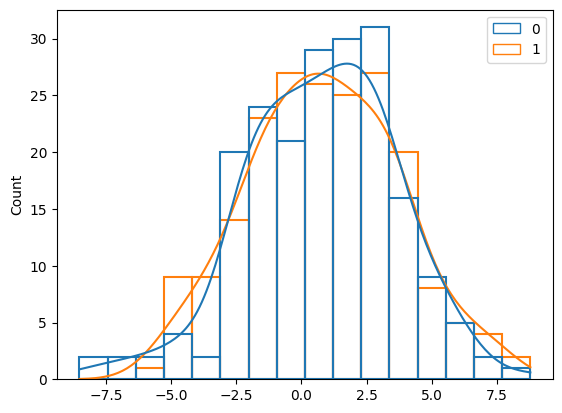

In [30]:
ww = dist.Normal(
    jnp.array([1, 1]),jnp.array([3, 3]))

gpax.utils.dviz(ww, samples=200)

In [31]:
tf.config.experimental_run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.



-- VAE Mod.0 (seed) --
3/3 [==============================] - 0s 10ms/step

-- VAE Mod.1 (seed) --
3/3 [==============================] - 0s 12ms/step


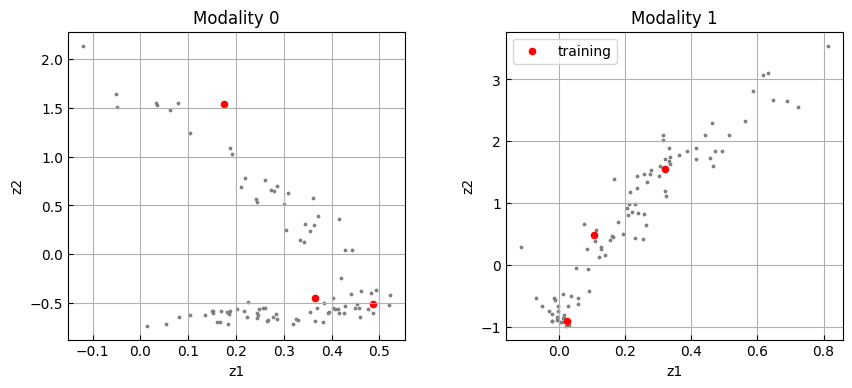


------ Iteration 1 --------

-- MF GP (iter 1) --


sample: 100%|██████████| 4000/4000 [00:05<00:00, 688.63it/s, 7 steps of size 3.99e-01. acc. prob=0.88] 



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.56      2.12      0.47     -2.73      4.22   1748.89      1.00
     W[0,0,1]      0.45      2.12      0.44     -2.95      4.06   2049.14      1.00
     W[0,1,0]      0.40      2.11      0.39     -3.56      3.54   2279.76      1.00
     W[0,1,1]      0.43      2.26      0.41     -3.52      3.86   1932.99      1.00
     W[1,0,0]      0.45      2.15      0.39     -2.96      4.03   2302.78      1.00
     W[1,0,1]      0.44      2.12      0.40     -2.85      3.93   1994.85      1.00
     W[1,1,0]      0.44      2.21      0.35     -3.17      3.94   2048.35      1.00
     W[1,1,1]      0.46      2.17      0.39     -3.32      3.75   2142.13      1.00
k_length[0,0]     10.03      5.81     10.19      0.88     18.69   2166.49      1.00
k_length[1,0]     10.17      5.75     10.63      1.97     19.91   2006.93      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

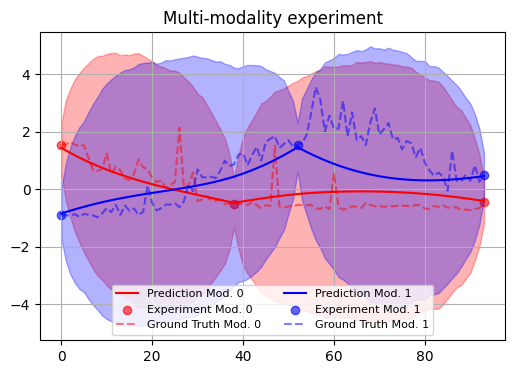

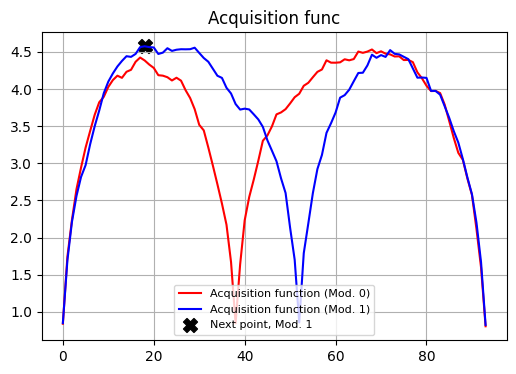


Next loc: 18; Next fidelity: 1

------ Iteration 2 --------

-- VAE Mod.1 (iter 2) --

18 0.1935483870967742
3/3 [==============================] - 0s 10ms/step


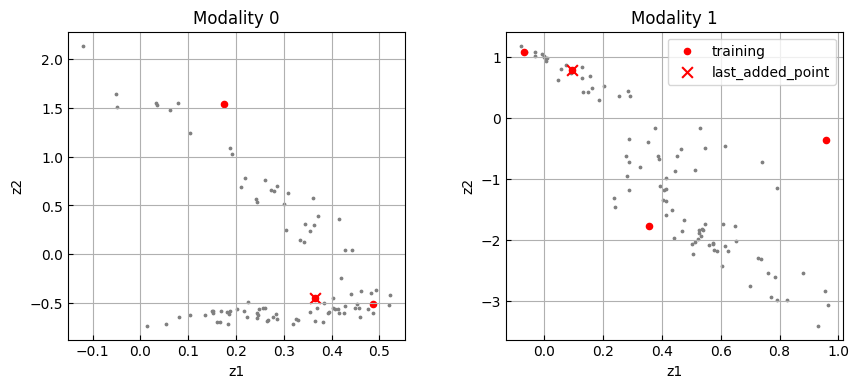


-- MF GP (iter 2) --


sample: 100%|██████████| 4000/4000 [00:07<00:00, 570.69it/s, 7 steps of size 4.39e-01. acc. prob=0.83] 



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.59      2.17      0.49     -2.81      4.29   2040.79      1.00
     W[0,0,1]      0.46      2.09      0.44     -3.51      3.52   1682.00      1.00
     W[0,1,0]      0.40      1.87      0.33     -2.57      3.40   1941.36      1.00
     W[0,1,1]      0.38      1.96      0.33     -2.78      3.64   1795.19      1.00
     W[1,0,0]      0.53      2.14      0.45     -3.05      3.90   1907.26      1.00
     W[1,0,1]      0.51      2.12      0.49     -3.07      3.69   1575.10      1.00
     W[1,1,0]      0.47      1.99      0.43     -2.64      3.91   2092.30      1.00
     W[1,1,1]      0.39      1.89      0.36     -2.79      3.25   1845.24      1.00
k_length[0,0]     10.17      5.86     10.28      1.18     18.96   1800.48      1.00
k_length[1,0]     10.62      5.71     10.92      2.43     19.92   2545.60      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

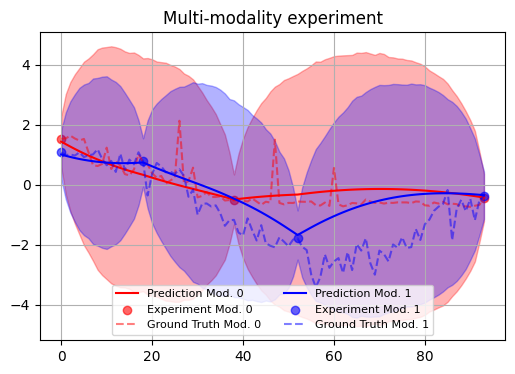

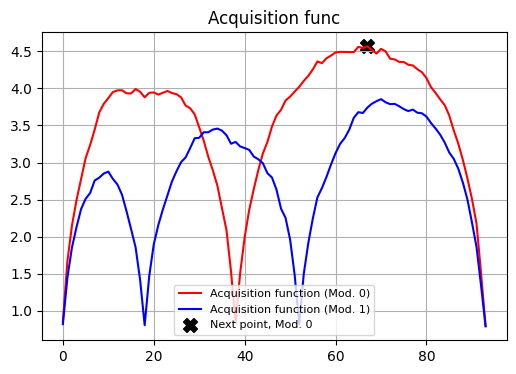


Next loc: 67; Next fidelity: 0

------ Iteration 3 --------

-- VAE Mod.0 (iter 3) --

67 0.7204301075268817
3/3 [==============================] - 0s 16ms/step


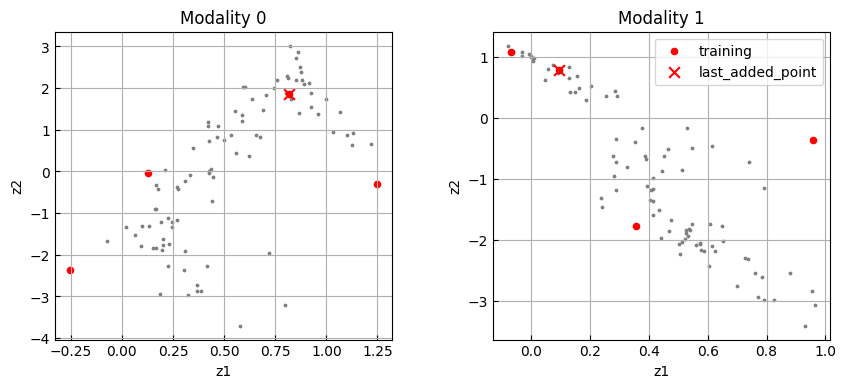


-- MF GP (iter 3) --


sample: 100%|██████████| 4000/4000 [00:06<00:00, 590.46it/s, 15 steps of size 2.83e-01. acc. prob=0.95] 



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.43      2.04      0.40     -2.75      4.01   3422.65      1.00
     W[0,0,1]      0.44      1.93      0.44     -2.78      3.34   3411.19      1.00
     W[0,1,0]      0.34      1.92      0.25     -2.61      3.61   4710.03      1.00
     W[0,1,1]      0.41      2.04      0.32     -3.07      3.67   3826.36      1.00
     W[1,0,0]      0.38      2.09      0.30     -2.86      3.97   3812.01      1.00
     W[1,0,1]      0.46      1.97      0.41     -2.67      3.79   3273.94      1.00
     W[1,1,0]      0.35      1.89      0.26     -2.79      3.34   4404.97      1.00
     W[1,1,1]      0.35      1.81      0.27     -2.56      3.34   4281.64      1.00
k_length[0,0]     10.47      5.76     10.53      1.89     19.56   3731.57      1.00
k_length[1,0]     10.42      5.73     10.66      2.37     19.99   3523.71      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

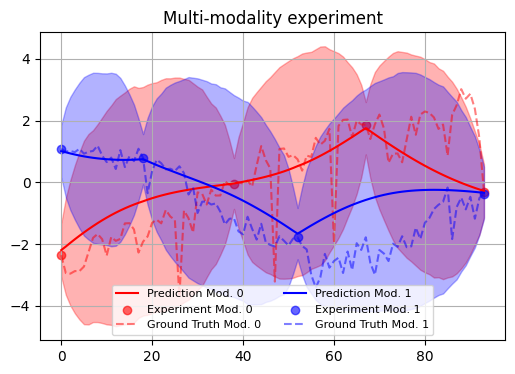

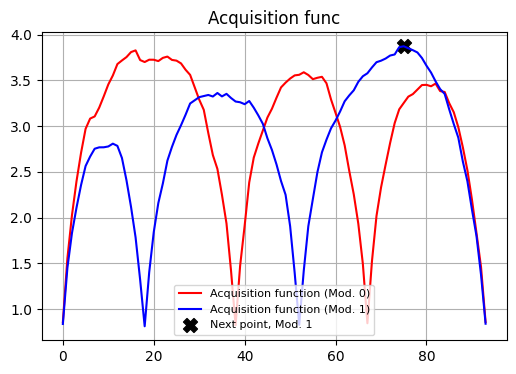


Next loc: 75; Next fidelity: 1

------ Iteration 4 --------

-- VAE Mod.1 (iter 4) --

75 0.8064516129032258
3/3 [==============================] - 0s 12ms/step


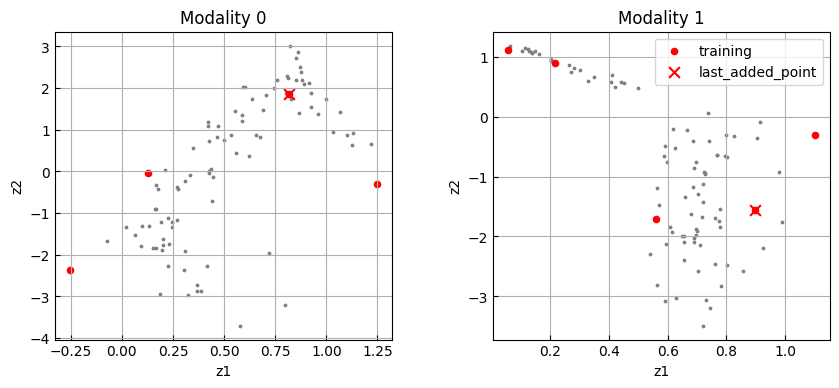


-- MF GP (iter 4) --


sample: 100%|██████████| 4000/4000 [00:07<00:00, 535.27it/s, 7 steps of size 3.67e-01. acc. prob=0.88]  



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.40      1.96      0.38     -2.70      3.59   2314.11      1.00
     W[0,0,1]      0.41      1.97      0.32     -2.53      3.89   1889.86      1.00
     W[0,1,0]      0.19      1.62      0.12     -2.95      2.50   1810.90      1.00
     W[0,1,1]      0.30      1.70      0.27     -2.43      3.11   2164.84      1.00
     W[1,0,0]      0.37      2.03      0.34     -3.08      3.50   2356.00      1.00
     W[1,0,1]      0.41      1.96      0.35     -2.74      3.54   1941.08      1.00
     W[1,1,0]      0.26      1.71      0.19     -2.43      3.00   1979.87      1.00
     W[1,1,1]      0.27      1.66      0.24     -2.65      2.71   1735.68      1.00
k_length[0,0]     10.85      5.85     11.27      2.22     19.99   2405.31      1.00
k_length[1,0]     11.05      5.85     11.83      2.35     19.92   1872.47      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

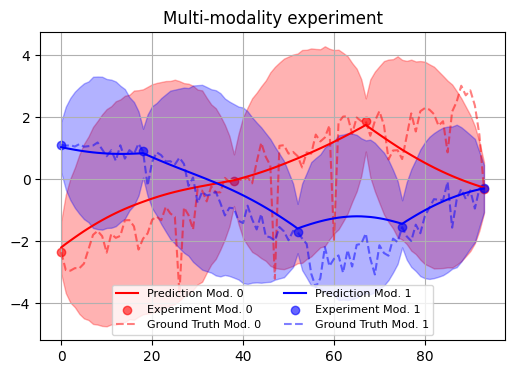

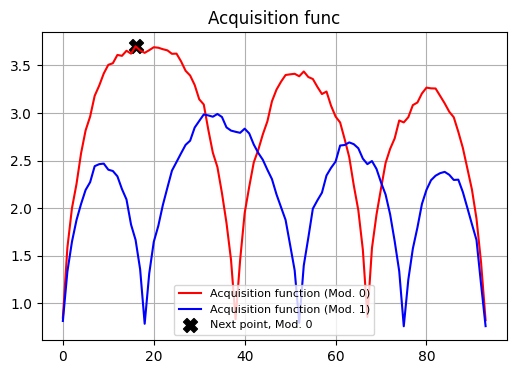


Next loc: 16; Next fidelity: 0

------ Iteration 5 --------

-- VAE Mod.0 (iter 5) --

16 0.17204301075268819
3/3 [==============================] - 0s 16ms/step


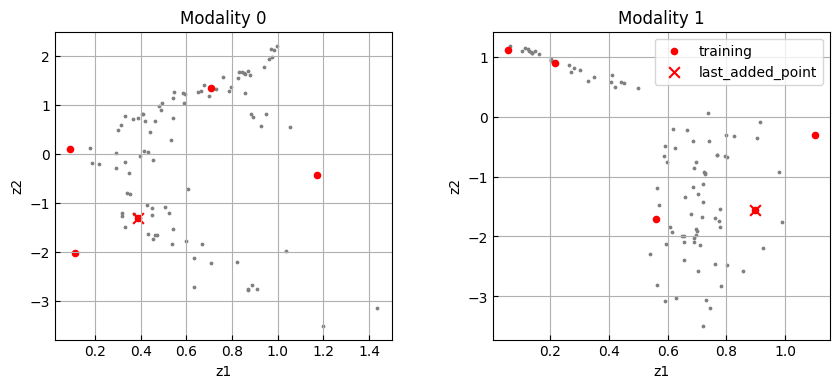


-- MF GP (iter 5) --


sample: 100%|██████████| 4000/4000 [00:07<00:00, 561.89it/s, 7 steps of size 3.51e-01. acc. prob=0.89]  



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.34      1.68      0.28     -2.20      3.14   1827.79      1.00
     W[0,0,1]      0.24      1.67      0.23     -2.54      2.92   2313.00      1.00
     W[0,1,0]      0.21      1.68      0.17     -2.48      3.02   2961.08      1.00
     W[0,1,1]      0.27      1.71      0.22     -2.36      3.32   2112.37      1.00
     W[1,0,0]      0.29      1.69      0.25     -2.53      2.93   2472.93      1.00
     W[1,0,1]      0.24      1.65      0.20     -2.70      2.65   2503.40      1.00
     W[1,1,0]      0.22      1.70      0.15     -2.38      3.03   1783.07      1.00
     W[1,1,1]      0.25      1.65      0.21     -2.38      3.11   2665.74      1.00
k_length[0,0]     11.42      5.85     12.25      2.76     20.00   2182.49      1.00
k_length[1,0]     11.61      5.76     12.66      2.95     20.00   2305.61      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

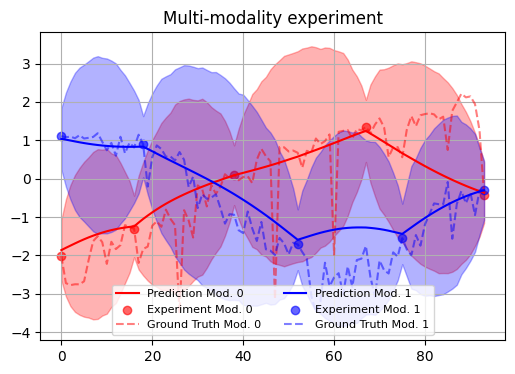

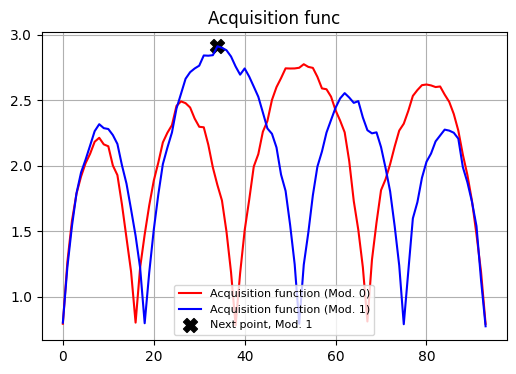


Next loc: 34; Next fidelity: 1

------ Iteration 6 --------

-- VAE Mod.1 (iter 6) --

34 0.3655913978494624
3/3 [==============================] - 0s 12ms/step


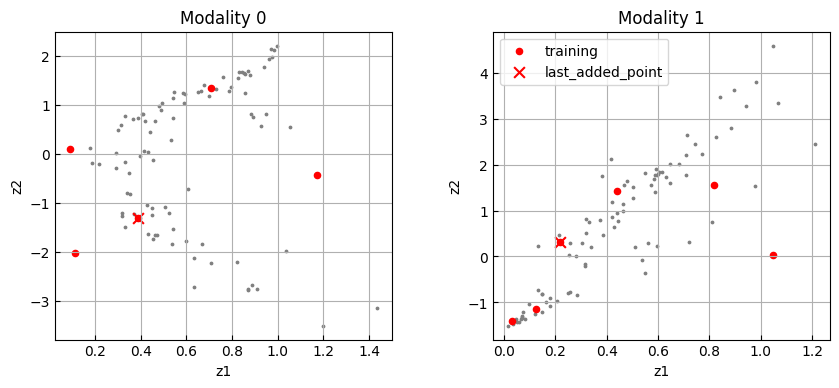


-- MF GP (iter 6) --


sample: 100%|██████████| 4000/4000 [00:07<00:00, 504.98it/s, 7 steps of size 3.44e-01. acc. prob=0.89]  



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.35      1.57      0.29     -2.09      2.99   2052.93      1.00
     W[0,0,1]      0.34      1.64      0.30     -2.42      2.96   2821.55      1.00
     W[0,1,0]      0.25      1.44      0.20     -2.05      2.56   2434.99      1.00
     W[0,1,1]      0.24      1.45      0.20     -2.18      2.58   2205.16      1.00
     W[1,0,0]      0.31      1.71      0.27     -2.47      2.98   2150.82      1.00
     W[1,0,1]      0.34      1.63      0.32     -2.13      3.16   2537.50      1.00
     W[1,1,0]      0.24      1.49      0.22     -2.24      2.60   2868.90      1.00
     W[1,1,1]      0.29      1.46      0.26     -2.18      2.63   2693.90      1.00
k_length[0,0]     12.18      5.82     13.50      3.32     20.00   1917.07      1.00
k_length[1,0]     12.41      5.64     13.62      3.55     19.99   2567.96      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

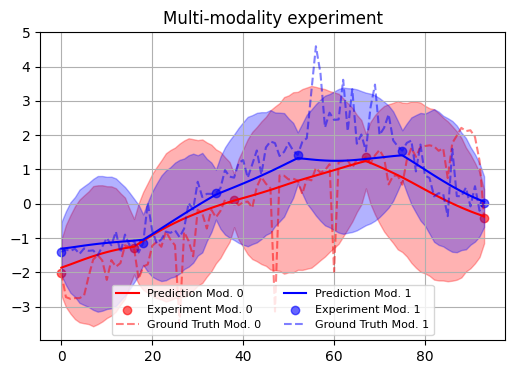

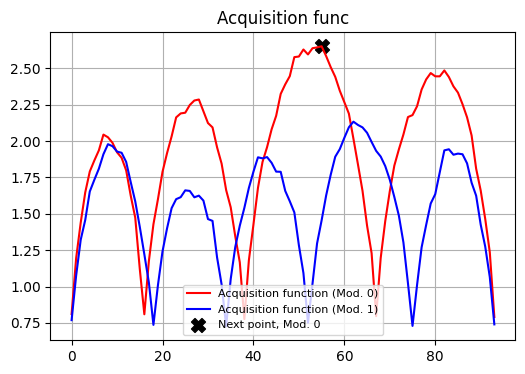


Next loc: 55; Next fidelity: 0

------ Iteration 7 --------

-- VAE Mod.0 (iter 7) --

55 0.5913978494623656
3/3 [==============================] - 0s 15ms/step


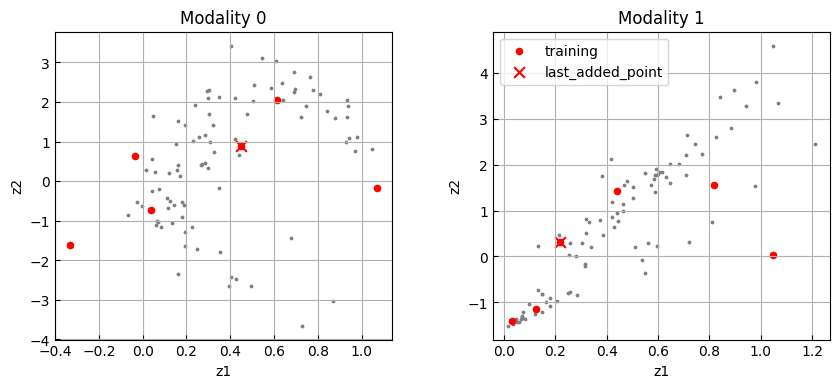


-- MF GP (iter 7) --


sample: 100%|██████████| 4000/4000 [00:07<00:00, 525.05it/s, 7 steps of size 3.99e-01. acc. prob=0.87] 



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.30      1.48      0.26     -2.09      2.69   2378.41      1.00
     W[0,0,1]      0.31      1.52      0.25     -2.19      2.83   1997.25      1.00
     W[0,1,0]      0.21      1.50      0.20     -2.24      2.62   2335.76      1.00
     W[0,1,1]      0.29      1.50      0.26     -1.94      2.87   1652.28      1.00
     W[1,0,0]      0.27      1.54      0.21     -2.07      2.81   2081.19      1.00
     W[1,0,1]      0.29      1.57      0.25     -2.45      2.70   1866.67      1.00
     W[1,1,0]      0.25      1.54      0.22     -2.12      2.73   1383.30      1.00
     W[1,1,1]      0.27      1.44      0.28     -2.21      2.46   1686.84      1.00
k_length[0,0]     12.96      5.65     14.57      3.72     20.00   1736.47      1.00
k_length[1,0]     13.23      5.46     14.75      4.15     20.00   1910.58      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

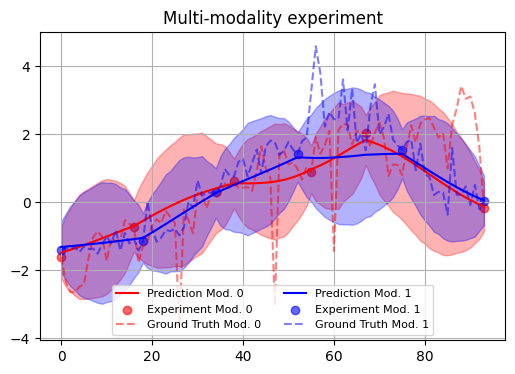

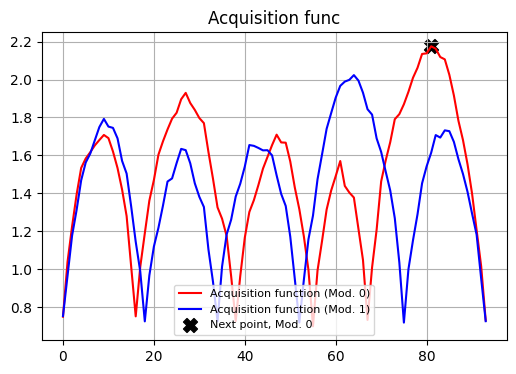


Next loc: 81; Next fidelity: 0

------ Iteration 8 --------

-- VAE Mod.0 (iter 8) --

81 0.8709677419354839
3/3 [==============================] - 0s 14ms/step


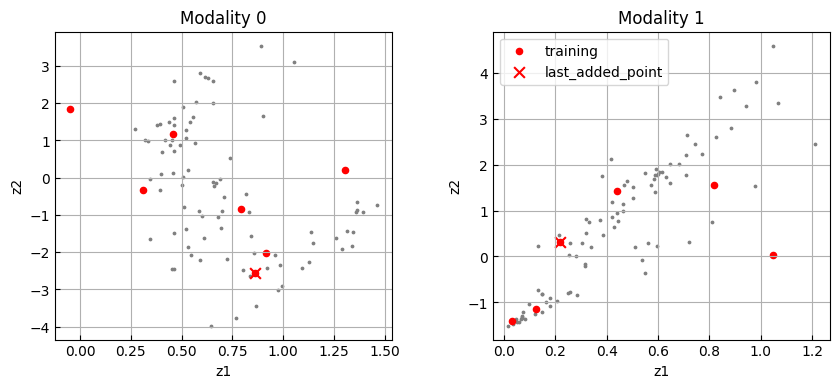


-- MF GP (iter 8) --


sample: 100%|██████████| 4000/4000 [00:08<00:00, 469.87it/s, 15 steps of size 3.06e-01. acc. prob=0.93]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.20      1.56      0.14     -2.43      2.64   2681.02      1.00
     W[0,0,1]      0.23      1.54      0.21     -2.10      2.92   2624.00      1.00
     W[0,1,0]      0.19      1.51      0.12     -2.50      2.42   3310.68      1.00
     W[0,1,1]      0.21      1.51      0.18     -2.37      2.56   2424.93      1.00
     W[1,0,0]      0.21      1.63      0.20     -2.35      2.96   2873.48      1.00
     W[1,0,1]      0.21      1.58      0.19     -2.43      2.67   3133.65      1.00
     W[1,1,0]      0.15      1.51      0.09     -2.44      2.50   2916.27      1.00
     W[1,1,1]      0.19      1.50      0.10     -2.16      2.60   3386.23      1.00
k_length[0,0]     13.95      4.97     15.25      6.14     20.00   2126.46      1.00
k_length[1,0]     13.82      5.15     15.35      5.58     19.99   2204.85      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

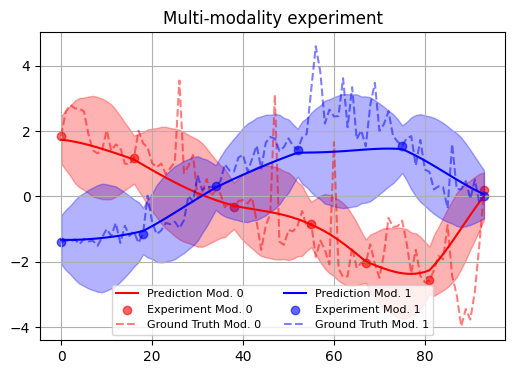

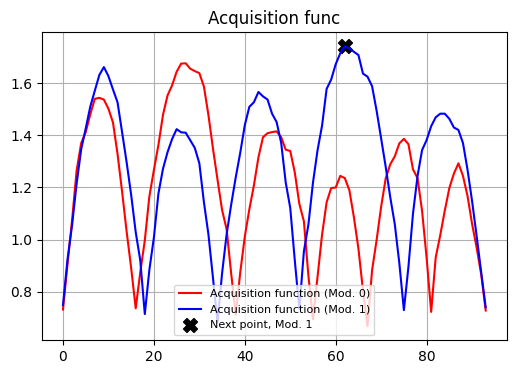


Next loc: 62; Next fidelity: 1

------ Iteration 9 --------

-- VAE Mod.1 (iter 9) --

62 0.6666666666666666
3/3 [==============================] - 0s 12ms/step


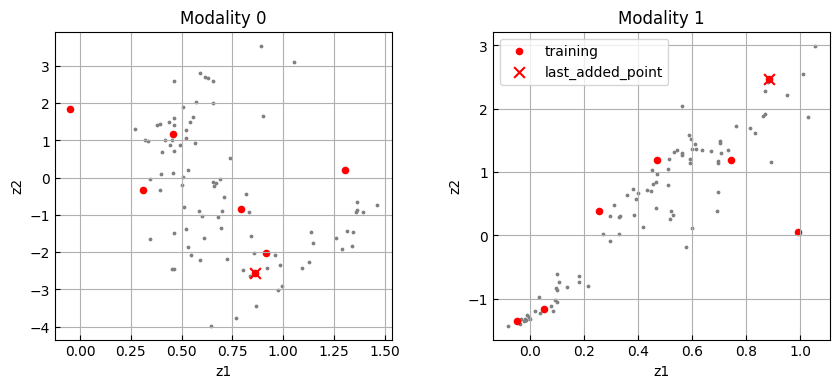


-- MF GP (iter 9) --


sample: 100%|██████████| 4000/4000 [00:08<00:00, 461.47it/s, 15 steps of size 3.02e-01. acc. prob=0.93]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.24      1.60      0.19     -2.63      2.58   2540.12      1.00
     W[0,0,1]      0.25      1.59      0.21     -2.33      2.71   3071.82      1.00
     W[0,1,0]      0.19      1.44      0.10     -2.16      2.46   3492.94      1.00
     W[0,1,1]      0.22      1.48      0.17     -2.03      2.79   2868.30      1.00
     W[1,0,0]      0.16      1.63      0.16     -2.54      2.69   3289.21      1.00
     W[1,0,1]      0.23      1.58      0.24     -2.51      2.76   2956.26      1.00
     W[1,1,0]      0.20      1.46      0.14     -2.06      2.67   3078.53      1.00
     W[1,1,1]      0.18      1.42      0.12     -2.12      2.42   3247.03      1.00
k_length[0,0]     14.15      4.90     15.48      6.45     20.00   2130.39      1.00
k_length[1,0]     14.18      4.82     15.43      6.64     20.00   2140.00      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

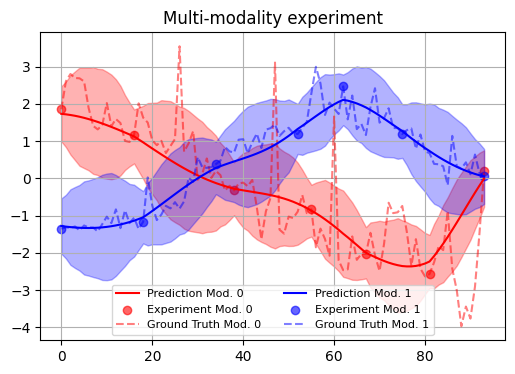

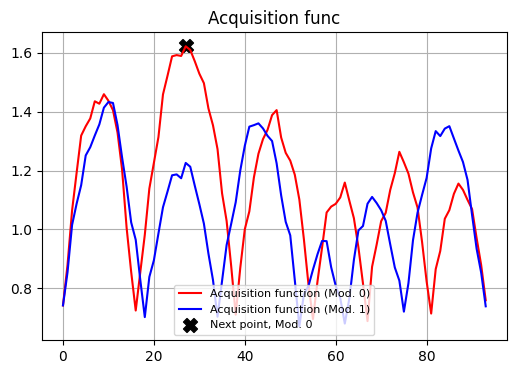


Next loc: 27; Next fidelity: 0

------ Iteration 10 --------

-- VAE Mod.0 (iter 10) --

27 0.2903225806451613
3/3 [==============================] - 0s 12ms/step


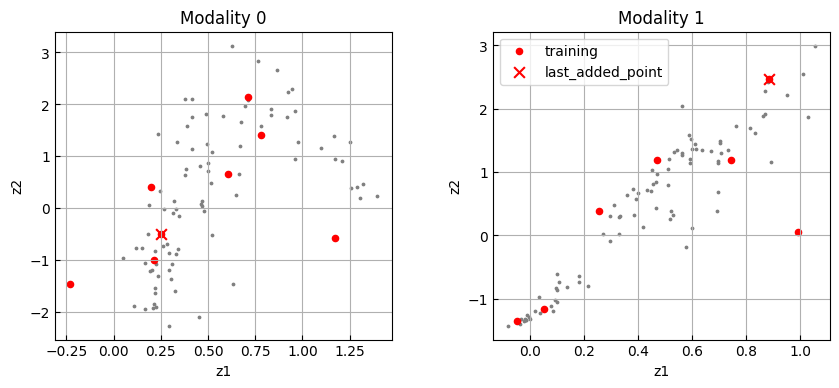


-- MF GP (iter 10) --


sample: 100%|██████████| 4000/4000 [00:08<00:00, 477.50it/s, 15 steps of size 2.65e-01. acc. prob=0.95]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.27      1.45      0.20     -2.03      2.61   2704.24      1.00
     W[0,0,1]      0.29      1.43      0.25     -2.08      2.57   2557.51      1.00
     W[0,1,0]      0.28      1.51      0.24     -2.09      2.77   3180.47      1.00
     W[0,1,1]      0.30      1.53      0.23     -2.27      2.56   2707.36      1.00
     W[1,0,0]      0.24      1.46      0.25     -1.94      2.74   2374.93      1.00
     W[1,0,1]      0.27      1.48      0.26     -1.82      3.00   2471.02      1.00
     W[1,1,0]      0.27      1.52      0.25     -2.09      2.73   2950.29      1.00
     W[1,1,1]      0.28      1.44      0.22     -2.03      2.62   3244.23      1.00
k_length[0,0]     14.86      4.40     16.02      8.40     20.00   1921.29      1.00
k_length[1,0]     14.88      4.40     16.02      8.35     19.99   1922.69      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

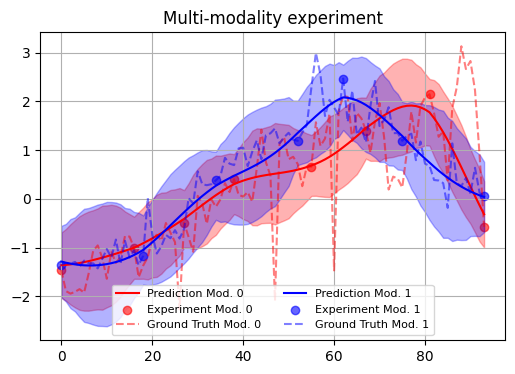

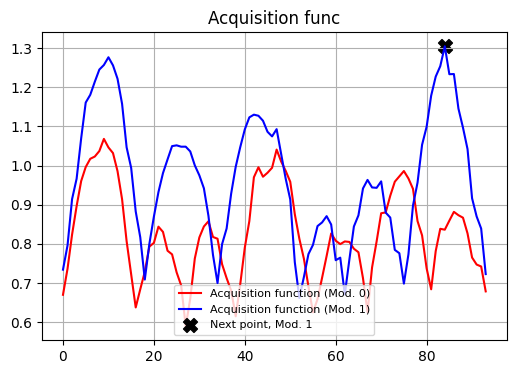


Next loc: 84; Next fidelity: 1

------ Iteration 11 --------

-- VAE Mod.1 (iter 11) --

84 0.9032258064516129
3/3 [==============================] - 0s 12ms/step


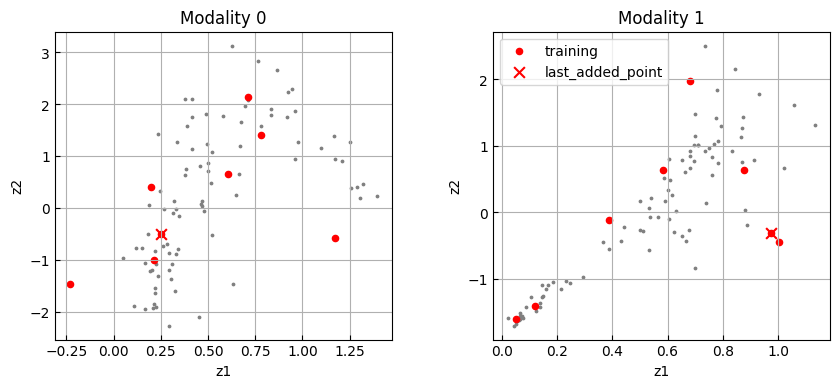


-- MF GP (iter 11) --


sample: 100%|██████████| 4000/4000 [00:08<00:00, 454.88it/s, 7 steps of size 3.70e-01. acc. prob=0.89] 



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.29      1.42      0.24     -2.00      2.48   1749.54      1.00
     W[0,0,1]      0.27      1.45      0.25     -2.22      2.52   1938.03      1.00
     W[0,1,0]      0.17      1.34      0.18     -2.14      2.10   2002.00      1.00
     W[0,1,1]      0.23      1.41      0.22     -1.90      2.66   2006.23      1.00
     W[1,0,0]      0.21      1.47      0.16     -2.18      2.53   2289.87      1.00
     W[1,0,1]      0.20      1.40      0.16     -2.22      2.30   1992.44      1.00
     W[1,1,0]      0.22      1.41      0.19     -1.97      2.55   2017.89      1.00
     W[1,1,1]      0.26      1.40      0.23     -2.05      2.45   2416.99      1.00
k_length[0,0]     15.08      4.30     16.16      9.30     20.00   1151.48      1.00
k_length[1,0]     15.36      4.14     16.50      9.61     20.00   1086.48      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

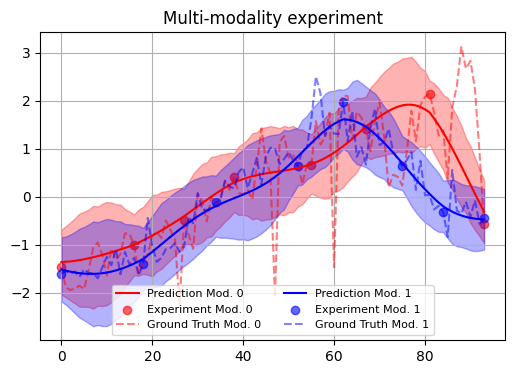

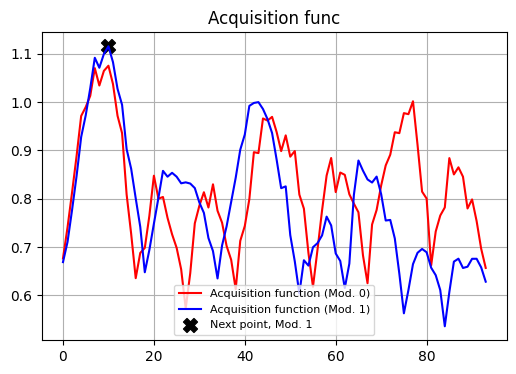


Next loc: 10; Next fidelity: 1

------ Iteration 12 --------

-- VAE Mod.1 (iter 12) --

10 0.10752688172043011
3/3 [==============================] - 0s 12ms/step


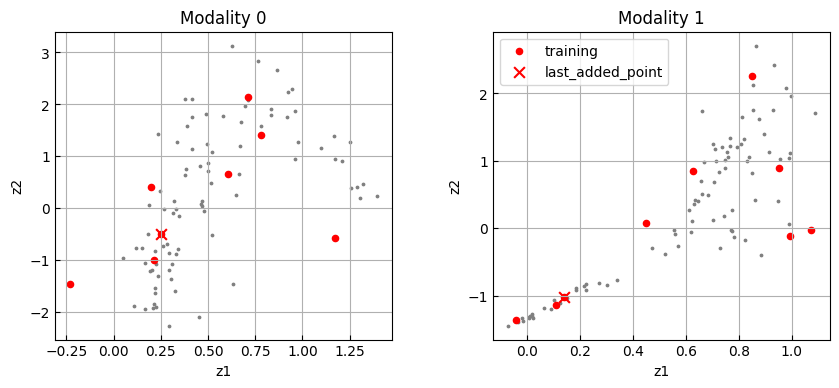


-- MF GP (iter 12) --


sample: 100%|██████████| 4000/4000 [00:09<00:00, 422.56it/s, 15 steps of size 3.07e-01. acc. prob=0.93]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.31      1.43      0.25     -1.98      2.53   2994.39      1.00
     W[0,0,1]      0.26      1.43      0.22     -2.24      2.48   2857.86      1.00
     W[0,1,0]      0.16      1.34      0.11     -2.02      2.32   2606.64      1.00
     W[0,1,1]      0.24      1.38      0.18     -2.13      2.36   3475.89      1.00
     W[1,0,0]      0.27      1.48      0.23     -2.16      2.60   2945.96      1.00
     W[1,0,1]      0.26      1.48      0.24     -2.29      2.54   2817.68      1.00
     W[1,1,0]      0.21      1.38      0.19     -2.09      2.31   2821.93      1.00
     W[1,1,1]      0.20      1.30      0.15     -1.90      2.28   3157.17      1.00
k_length[0,0]     15.75      3.48     16.50     11.13     20.00   1496.84      1.00
k_length[1,0]     15.67      3.64     16.57     10.86     19.99   1635.06      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

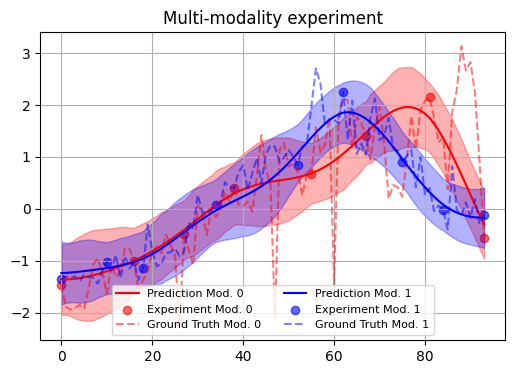

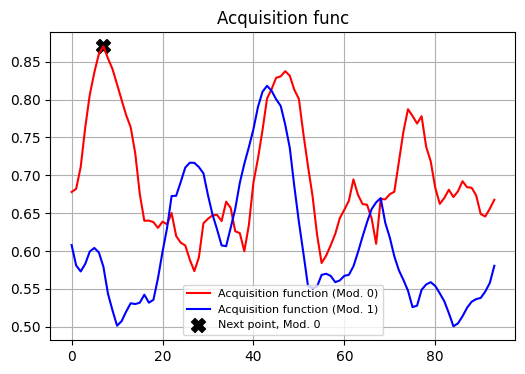


Next loc: 7; Next fidelity: 0

------ Iteration 13 --------

-- VAE Mod.0 (iter 13) --

7 0.07526881720430108
3/3 [==============================] - 0s 12ms/step


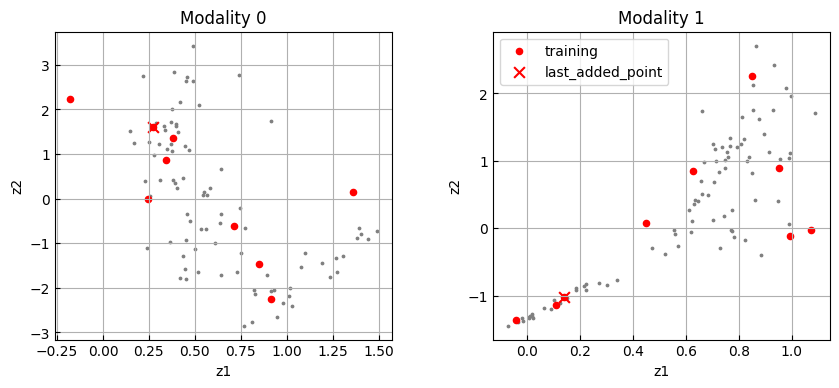


-- MF GP (iter 13) --


sample: 100%|██████████| 4000/4000 [00:08<00:00, 473.56it/s, 7 steps of size 3.63e-01. acc. prob=0.89]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.23      1.45      0.20     -2.14      2.60   2326.07      1.00
     W[0,0,1]      0.22      1.40      0.19     -1.85      2.72   2134.88      1.00
     W[0,1,0]      0.14      1.33      0.12     -1.96      2.28   1886.44      1.00
     W[0,1,1]      0.17      1.35      0.13     -2.01      2.44   2410.67      1.00
     W[1,0,0]      0.17      1.46      0.16     -2.08      2.71   2002.62      1.00
     W[1,0,1]      0.18      1.49      0.18     -2.09      2.65   2064.56      1.00
     W[1,1,0]      0.14      1.40      0.12     -2.14      2.39   1827.64      1.00
     W[1,1,1]      0.20      1.31      0.18     -1.96      2.34   2292.85      1.00
k_length[0,0]     16.24      3.27     17.01     12.20     20.00   1277.87      1.00
k_length[1,0]     16.35      3.13     17.12     12.16     20.00   1446.05      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

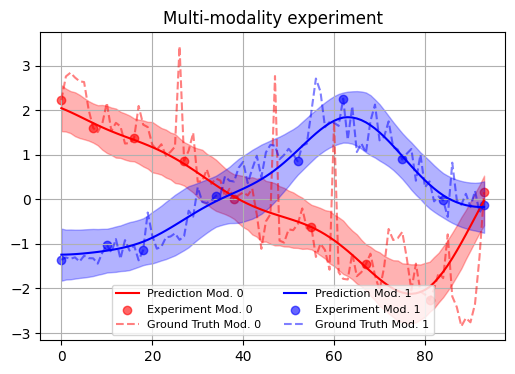

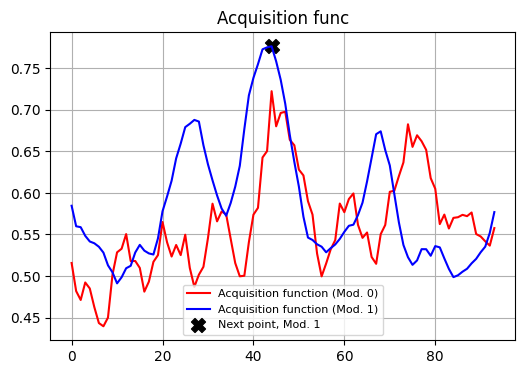


Next loc: 44; Next fidelity: 1

------ Iteration 14 --------

-- VAE Mod.1 (iter 14) --

44 0.4731182795698925
3/3 [==============================] - 0s 14ms/step


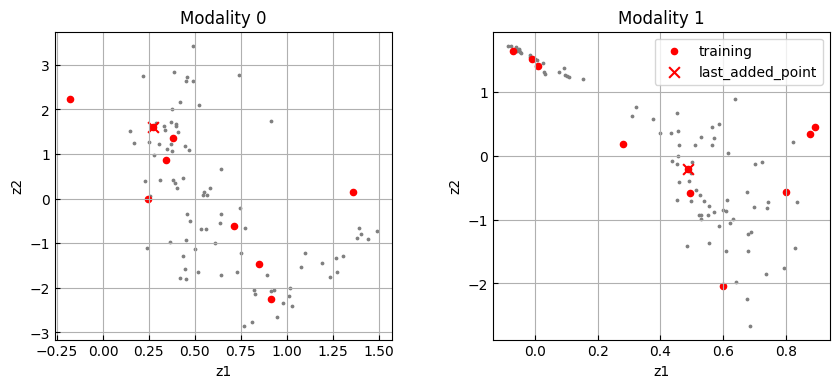


-- MF GP (iter 14) --


sample: 100%|██████████| 4000/4000 [00:09<00:00, 413.96it/s, 15 steps of size 3.32e-01. acc. prob=0.91]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.25      1.43      0.24     -2.01      2.57   2446.22      1.00
     W[0,0,1]      0.23      1.39      0.18     -1.86      2.70   2047.38      1.00
     W[0,1,0]      0.19      1.31      0.15     -2.06      2.21   2362.29      1.00
     W[0,1,1]      0.23      1.33      0.18     -1.89      2.45   2217.81      1.00
     W[1,0,0]      0.24      1.48      0.24     -2.17      2.52   2665.33      1.00
     W[1,0,1]      0.26      1.44      0.24     -2.00      2.47   2779.16      1.00
     W[1,1,0]      0.18      1.35      0.17     -1.91      2.36   2786.22      1.00
     W[1,1,1]      0.19      1.30      0.18     -2.03      2.19   2851.68      1.00
k_length[0,0]     16.35      3.06     17.03     12.41     20.00   1198.99      1.00
k_length[1,0]     16.48      2.96     17.16     12.42     19.99   1835.53      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

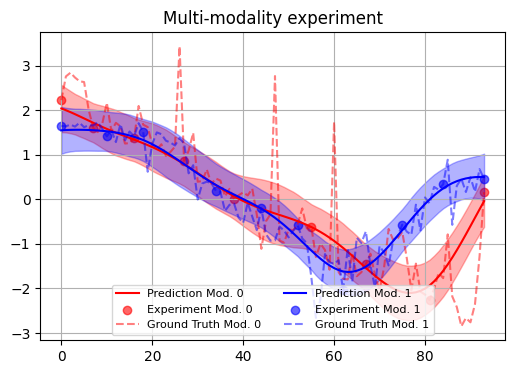

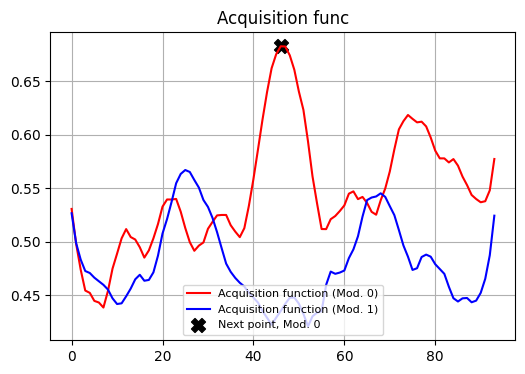


Next loc: 46; Next fidelity: 0

------ Iteration 15 --------

-- VAE Mod.0 (iter 15) --

46 0.4946236559139785
3/3 [==============================] - 0s 12ms/step


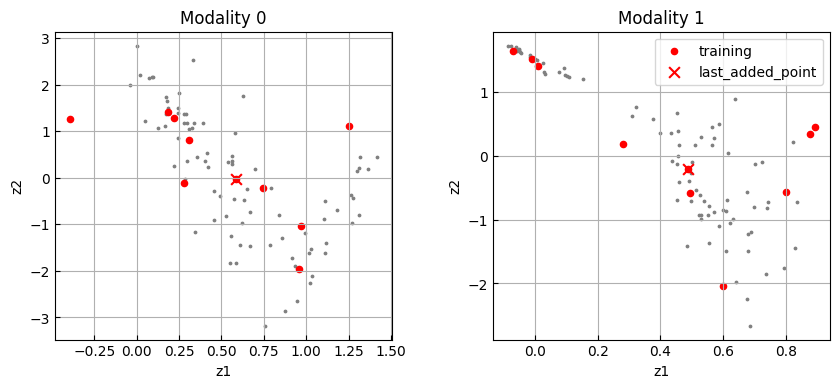


-- MF GP (iter 15) --


sample: 100%|██████████| 4000/4000 [00:10<00:00, 380.57it/s, 15 steps of size 3.23e-01. acc. prob=0.92]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.27      1.48      0.20     -1.99      2.82   2489.81      1.00
     W[0,0,1]      0.29      1.45      0.28     -2.27      2.48   2097.57      1.00
     W[0,1,0]      0.17      1.30      0.14     -2.04      2.23   2822.37      1.00
     W[0,1,1]      0.22      1.35      0.16     -1.90      2.42   2672.78      1.00
     W[1,0,0]      0.25      1.53      0.26     -2.26      2.68   3007.13      1.00
     W[1,0,1]      0.26      1.53      0.25     -2.26      2.75   2955.09      1.00
     W[1,1,0]      0.19      1.35      0.13     -1.93      2.35   2975.70      1.00
     W[1,1,1]      0.22      1.32      0.15     -1.85      2.43   2803.26      1.00
k_length[0,0]     16.39      2.83     16.95     12.43     20.00   1618.03      1.00
k_length[1,0]     16.43      2.77     17.02     12.54     19.98   1689.86      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

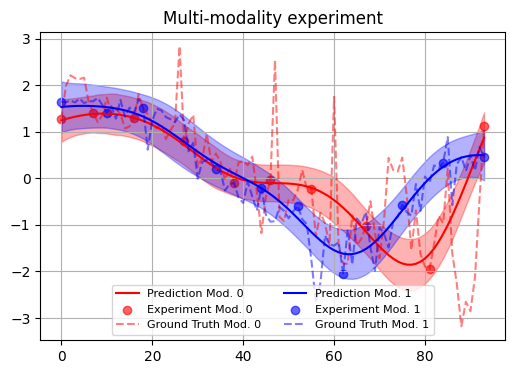

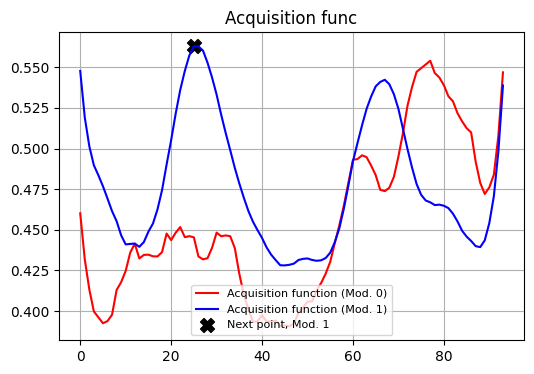


Next loc: 25; Next fidelity: 1

------ Iteration 16 --------

-- VAE Mod.1 (iter 16) --

25 0.26881720430107525
3/3 [==============================] - 0s 12ms/step


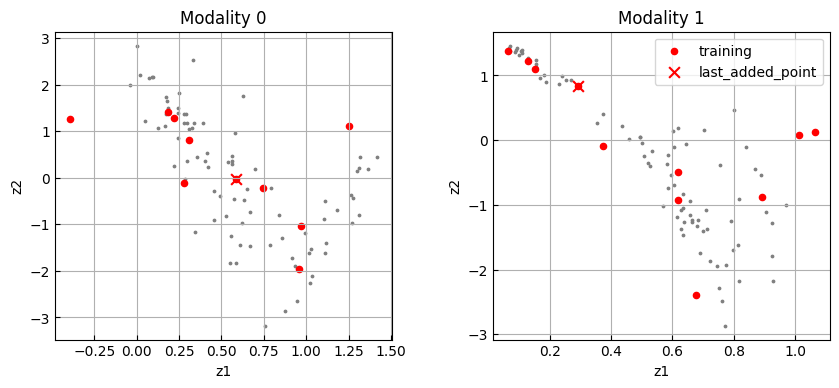


-- MF GP (iter 16) --


sample: 100%|██████████| 4000/4000 [00:10<00:00, 388.26it/s, 15 steps of size 3.13e-01. acc. prob=0.90]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.29      1.52      0.24     -2.10      2.71   1986.62      1.00
     W[0,0,1]      0.25      1.48      0.29     -2.28      2.54   1973.30      1.00
     W[0,1,0]      0.19      1.33      0.17     -1.97      2.25   2512.99      1.00
     W[0,1,1]      0.18      1.35      0.16     -2.00      2.35   3536.28      1.00
     W[1,0,0]      0.21      1.56      0.17     -2.54      2.57   3257.81      1.00
     W[1,0,1]      0.20      1.54      0.19     -2.27      2.85   2595.48      1.00
     W[1,1,0]      0.17      1.35      0.14     -2.12      2.30   3150.53      1.00
     W[1,1,1]      0.15      1.32      0.12     -1.86      2.42   3429.29      1.00
k_length[0,0]     16.36      2.69     16.85     12.59     20.00   1665.70      1.00
k_length[1,0]     16.36      2.71     16.95     12.54     19.99   1231.14      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

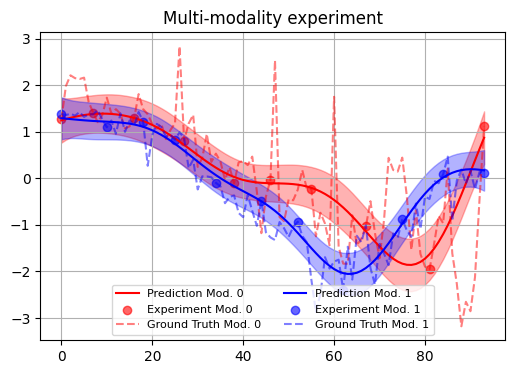

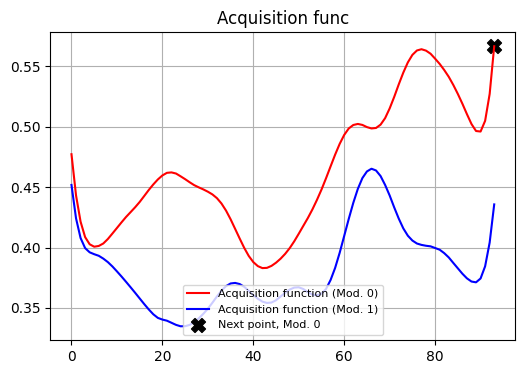


Next loc: 93; Next fidelity: 0

------ Iteration 17 --------

-- VAE Mod.0 (iter 17) --

93 1.0
3/3 [==============================] - 0s 12ms/step


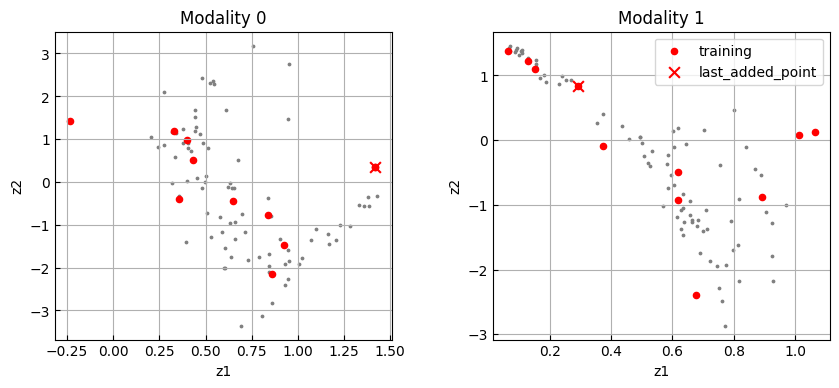


-- MF GP (iter 17) --


sample: 100%|██████████| 4000/4000 [00:11<00:00, 356.55it/s, 15 steps of size 2.55e-01. acc. prob=0.93]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.23      1.39      0.18     -2.13      2.30   2291.01      1.00
     W[0,0,1]      0.26      1.38      0.23     -2.03      2.51   2873.70      1.00
     W[0,1,0]      0.23      1.34      0.18     -1.96      2.42   3530.06      1.00
     W[0,1,1]      0.23      1.35      0.20     -1.88      2.53   2726.84      1.00
     W[1,0,0]      0.22      1.43      0.21     -2.13      2.46   2819.59      1.00
     W[1,0,1]      0.24      1.41      0.20     -2.19      2.39   2524.83      1.00
     W[1,1,0]      0.17      1.40      0.18     -2.03      2.47   2531.61      1.00
     W[1,1,1]      0.20      1.36      0.16     -1.91      2.55   2983.97      1.00
k_length[0,0]     16.60      2.53     17.12     12.92     20.00   1666.62      1.00
k_length[1,0]     16.45      2.68     16.98     12.64     20.00   1438.24      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

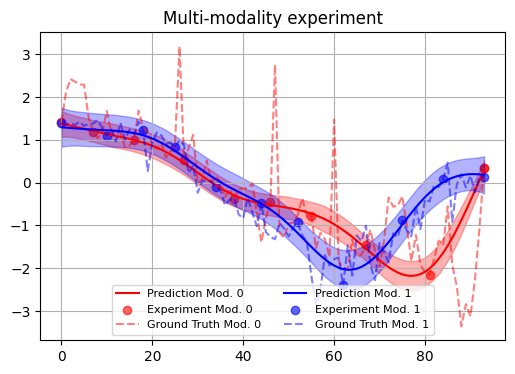

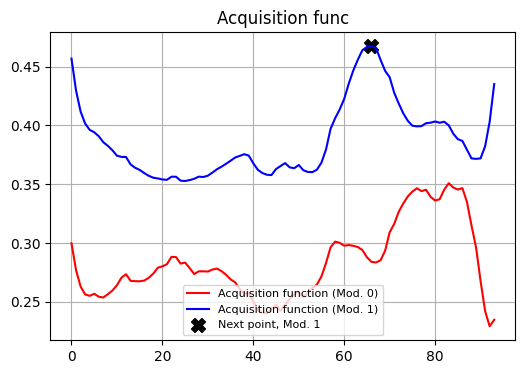


Next loc: 66; Next fidelity: 1

------ Iteration 18 --------

-- VAE Mod.1 (iter 18) --

66 0.7096774193548387
3/3 [==============================] - 0s 12ms/step


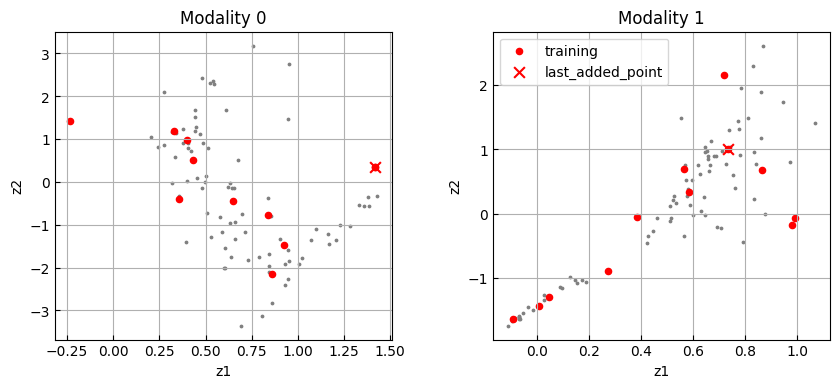


-- MF GP (iter 18) --


sample: 100%|██████████| 4000/4000 [00:11<00:00, 337.01it/s, 7 steps of size 3.25e-01. acc. prob=0.91] 



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.21      1.39      0.20     -2.08      2.41   2334.90      1.00
     W[0,0,1]      0.23      1.41      0.20     -2.08      2.55   2738.10      1.00
     W[0,1,0]      0.16      1.25      0.13     -1.76      2.34   3282.26      1.00
     W[0,1,1]      0.15      1.28      0.09     -1.85      2.30   3223.87      1.00
     W[1,0,0]      0.22      1.44      0.25     -1.93      2.68   2750.03      1.00
     W[1,0,1]      0.23      1.45      0.17     -2.04      2.68   2588.21      1.00
     W[1,1,0]      0.15      1.28      0.16     -2.08      2.09   2666.60      1.00
     W[1,1,1]      0.14      1.22      0.13     -1.78      2.13   2571.49      1.00
k_length[0,0]     16.95      2.49     17.55     13.49     20.00   1397.52      1.00
k_length[1,0]     16.97      2.46     17.57     13.45     20.00   1739.53      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

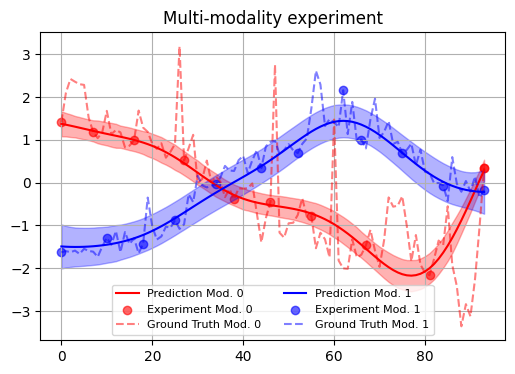

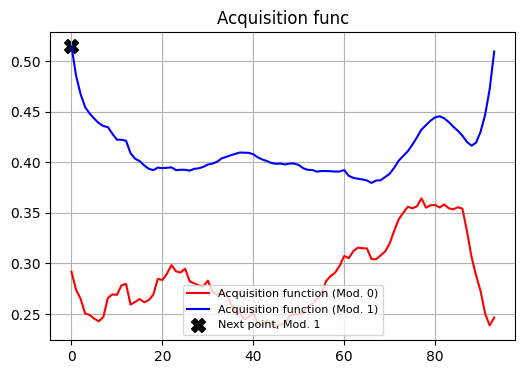


Next loc: 0; Next fidelity: 1

------ Iteration 19 --------

-- VAE Mod.1 (iter 19) --

0 0.0
3/3 [==============================] - 0s 12ms/step


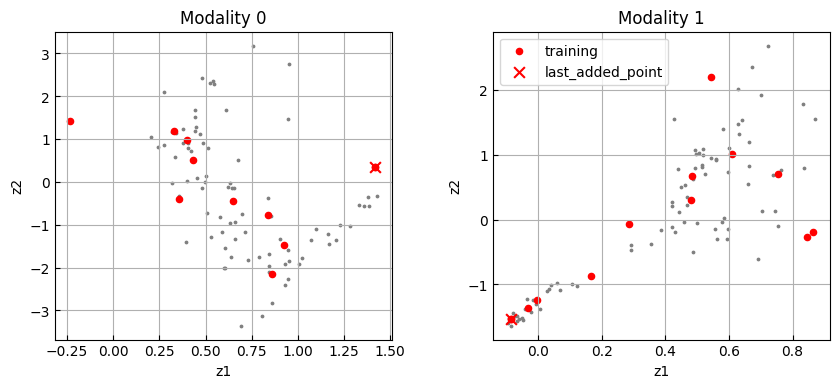


-- MF GP (iter 19) --


sample: 100%|██████████| 4000/4000 [00:17<00:00, 231.09it/s, 7 steps of size 3.37e-01. acc. prob=0.90]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.26      1.39      0.23     -2.09      2.30   2582.50      1.00
     W[0,0,1]      0.25      1.38      0.24     -1.94      2.51   2460.10      1.00
     W[0,1,0]      0.14      1.19      0.10     -1.69      2.16   1983.61      1.00
     W[0,1,1]      0.16      1.23      0.13     -1.90      2.08   2596.94      1.00
     W[1,0,0]      0.20      1.49      0.17     -2.11      2.76   2519.31      1.00
     W[1,0,1]      0.24      1.48      0.23     -2.01      2.70   2662.80      1.00
     W[1,1,0]      0.16      1.24      0.13     -1.90      2.01   2231.73      1.00
     W[1,1,1]      0.11      1.17      0.10     -1.66      2.16   3164.16      1.00
k_length[0,0]     17.02      2.49     17.55     13.75     20.00   1079.46      1.00
k_length[1,0]     17.06      2.39     17.65     13.65     19.99   1618.20      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

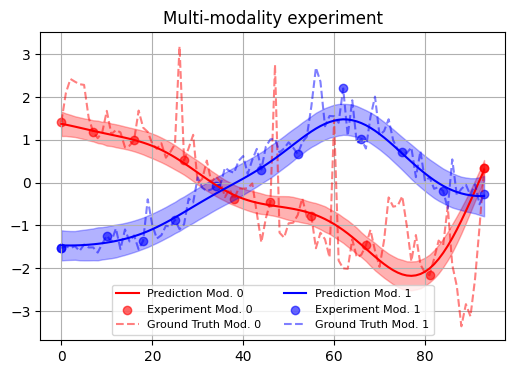

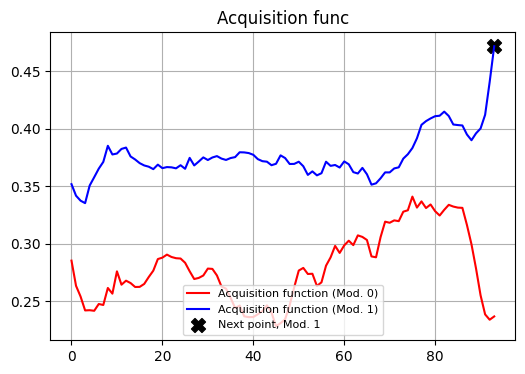


Next loc: 93; Next fidelity: 1

------ Iteration 20 --------

-- VAE Mod.1 (iter 20) --

93 1.0
3/3 [==============================] - 0s 12ms/step


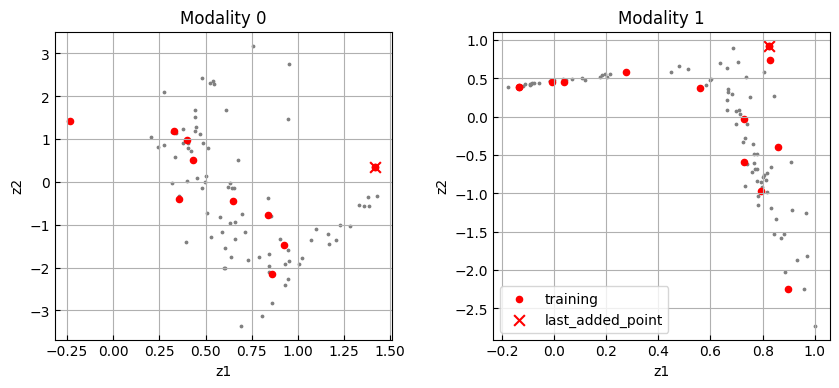


-- MF GP (iter 20) --


sample: 100%|██████████| 4000/4000 [00:12<00:00, 323.57it/s, 7 steps of size 3.99e-01. acc. prob=0.86]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.24      1.45      0.23     -2.02      2.73   1690.27      1.00
     W[0,0,1]      0.21      1.47      0.20     -2.15      2.73   2050.18      1.00
     W[0,1,0]      0.11      1.17      0.11     -1.80      1.98   2146.26      1.00
     W[0,1,1]      0.14      1.19      0.12     -1.74      2.11   2078.68      1.00
     W[1,0,0]      0.20      1.49      0.19     -2.19      2.59   1787.58      1.00
     W[1,0,1]      0.23      1.47      0.22     -2.06      2.68   1442.36      1.00
     W[1,1,0]      0.12      1.21      0.09     -1.56      2.25   1818.30      1.00
     W[1,1,1]      0.12      1.19      0.11     -1.82      2.14   1513.41      1.00
k_length[0,0]     17.02      2.53     17.64     13.49     20.00   1384.42      1.00
k_length[1,0]     17.01      2.65     17.63     13.76     19.99    536.57      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

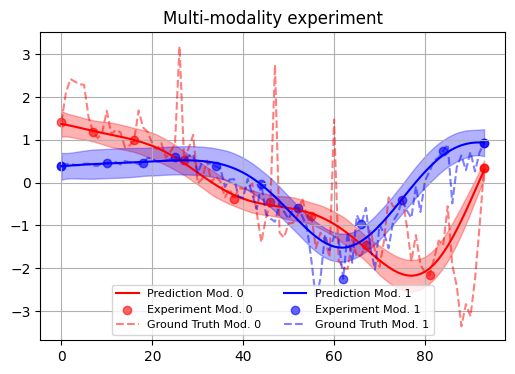

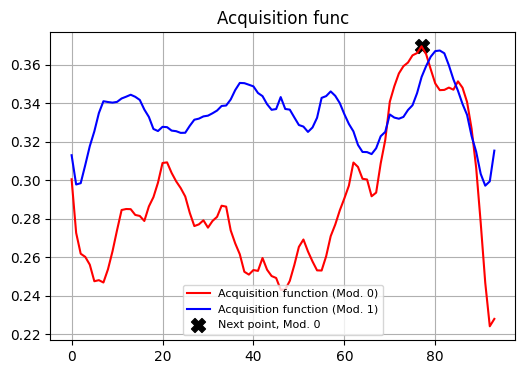


Next loc: 77; Next fidelity: 0

------ Iteration 21 --------

-- VAE Mod.0 (iter 21) --

77 0.8279569892473119
3/3 [==============================] - 0s 14ms/step


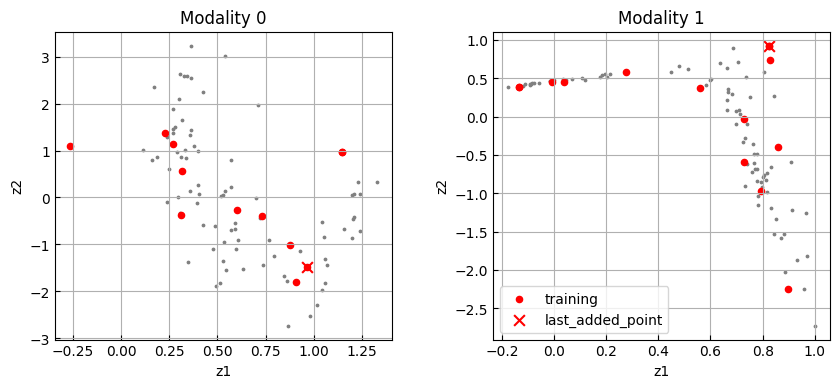


-- MF GP (iter 21) --


sample: 100%|██████████| 4000/4000 [00:14<00:00, 282.42it/s, 15 steps of size 2.57e-01. acc. prob=0.95]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.24      1.49      0.20     -2.21      2.57   2379.46      1.00
     W[0,0,1]      0.28      1.48      0.25     -2.05      2.75   2801.27      1.00
     W[0,1,0]      0.16      1.21      0.11     -1.80      2.11   3160.01      1.00
     W[0,1,1]      0.15      1.21      0.09     -1.64      2.14   2635.81      1.00
     W[1,0,0]      0.23      1.54      0.25     -2.18      2.74   2998.65      1.00
     W[1,0,1]      0.24      1.56      0.22     -2.22      2.94   2123.26      1.00
     W[1,1,0]      0.13      1.20      0.12     -1.79      2.10   2700.95      1.00
     W[1,1,1]      0.15      1.17      0.13     -1.82      2.09   3118.23      1.00
k_length[0,0]     16.97      2.64     17.65     13.64     20.00    754.83      1.00
k_length[1,0]     16.93      2.52     17.52     13.66     19.99   1162.45      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

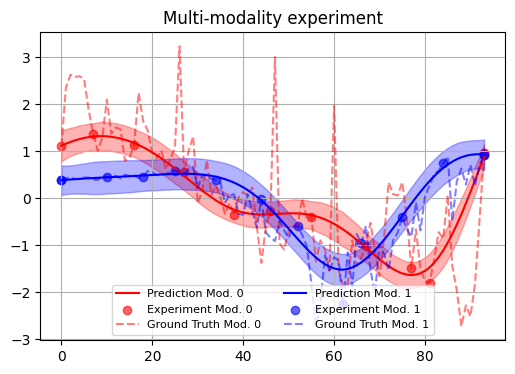

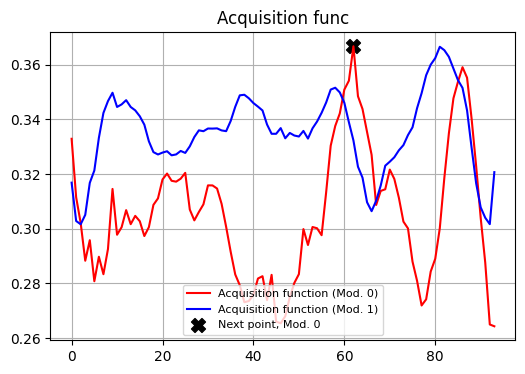


Next loc: 62; Next fidelity: 0

------ Iteration 22 --------

-- VAE Mod.0 (iter 22) --

62 0.6666666666666666
3/3 [==============================] - 0s 14ms/step


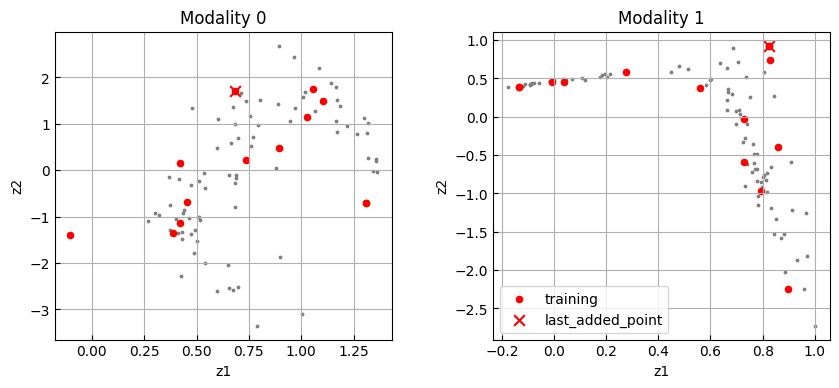


-- MF GP (iter 22) --


sample: 100%|██████████| 4000/4000 [00:14<00:00, 282.32it/s, 15 steps of size 3.07e-01. acc. prob=0.92]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.19      1.37      0.18     -2.01      2.41   2763.86      1.00
     W[0,0,1]      0.18      1.31      0.17     -1.88      2.29   2629.92      1.00
     W[0,1,0]      0.15      1.20      0.12     -1.79      2.08   2456.07      1.00
     W[0,1,1]      0.19      1.23      0.15     -1.89      2.02   3361.94      1.00
     W[1,0,0]      0.18      1.39      0.15     -2.13      2.32   2432.09      1.00
     W[1,0,1]      0.18      1.35      0.17     -1.96      2.49   2611.65      1.00
     W[1,1,0]      0.15      1.26      0.14     -2.01      2.08   2707.66      1.00
     W[1,1,1]      0.17      1.22      0.15     -2.05      2.01   3410.53      1.00
k_length[0,0]     16.99      2.62     17.62     13.62     20.00   1588.46      1.00
k_length[1,0]     16.97      2.61     17.72     13.54     20.00   1312.73      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

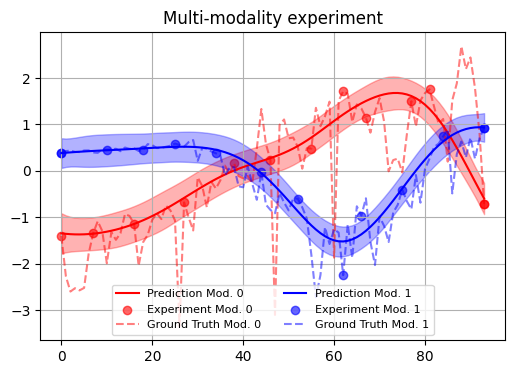

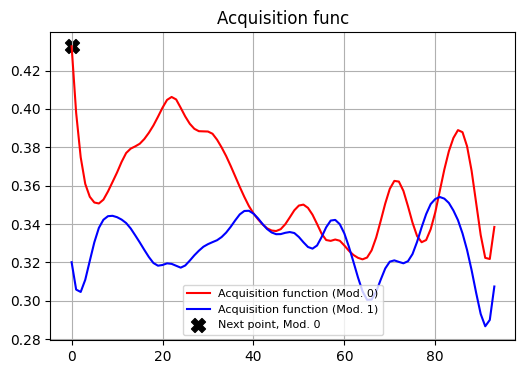


Next loc: 0; Next fidelity: 0

------ Iteration 23 --------

-- VAE Mod.0 (iter 23) --

0 0.0
3/3 [==============================] - 0s 16ms/step


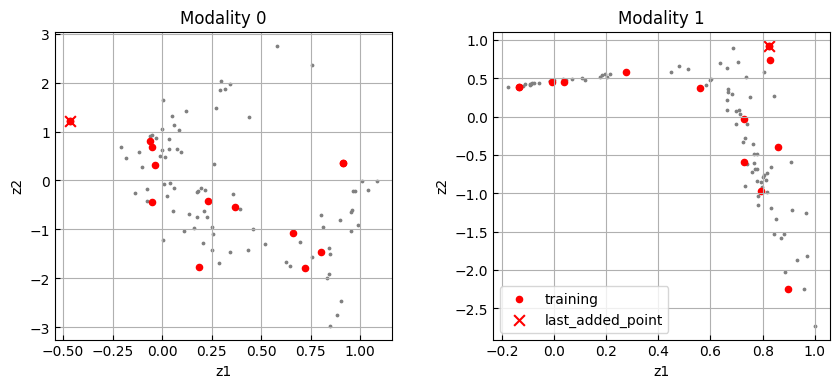


-- MF GP (iter 23) --


sample: 100%|██████████| 4000/4000 [00:21<00:00, 189.31it/s, 15 steps of size 1.69e-01. acc. prob=0.86]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.24      1.22      0.17     -1.70      2.31   1371.87      1.00
     W[0,0,1]      0.20      1.18      0.13     -1.74      2.08   1756.36      1.00
     W[0,1,0]      0.20      1.11      0.16     -1.59      1.96   1574.32      1.00
     W[0,1,1]      0.21      1.21      0.17     -1.74      2.05   1202.12      1.00
     W[1,0,0]      0.17      1.27      0.12     -1.79      2.18   1495.50      1.00
     W[1,0,1]      0.19      1.22      0.17     -1.61      2.24   1721.72      1.00
     W[1,1,0]      0.16      1.19      0.16     -1.71      2.20    996.43      1.00
     W[1,1,1]      0.16      1.12      0.14     -1.77      1.98   1708.44      1.00
k_length[0,0]     15.34      4.77     17.09      6.89     20.00     44.30      1.00
k_length[1,0]     15.48      4.58     17.06      7.35     20.00     44.47      1.01
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

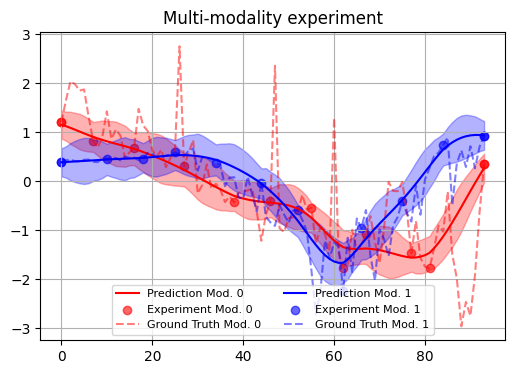

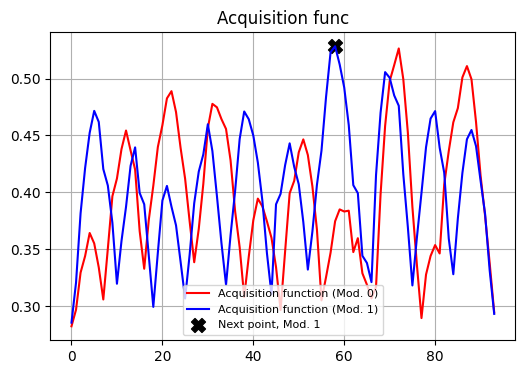


Next loc: 58; Next fidelity: 1

------ Iteration 24 --------

-- VAE Mod.1 (iter 24) --

58 0.6236559139784946
3/3 [==============================] - 0s 12ms/step


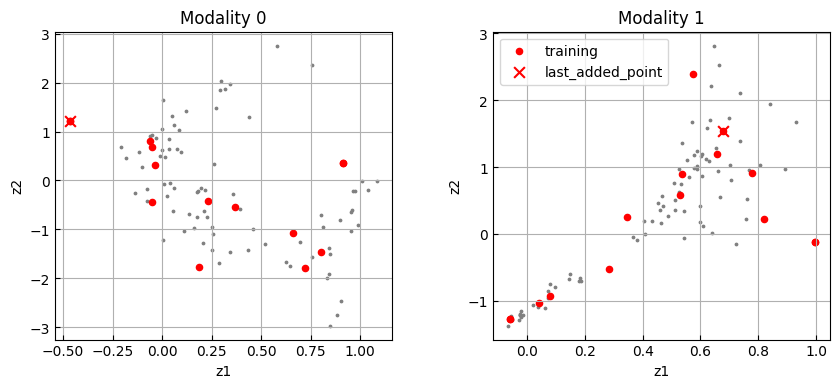


-- MF GP (iter 24) --


sample: 100%|██████████| 4000/4000 [00:19<00:00, 207.76it/s, 31 steps of size 1.38e-01. acc. prob=0.91]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.13      1.22      0.10     -1.81      2.12   1935.75      1.00
     W[0,0,1]      0.13      1.20      0.11     -1.79      2.09   1927.49      1.00
     W[0,1,0]      0.13      1.16      0.10     -1.62      1.99   2039.90      1.00
     W[0,1,1]      0.14      1.15      0.09     -1.71      1.92   1168.36      1.00
     W[1,0,0]      0.13      1.23      0.10     -1.94      2.23   1857.74      1.00
     W[1,0,1]      0.09      1.21      0.09     -1.95      1.98   1930.20      1.00
     W[1,1,0]      0.11      1.14      0.08     -1.63      1.91   1618.02      1.00
     W[1,1,1]      0.12      1.13      0.07     -1.75      1.84   1409.92      1.00
k_length[0,0]     15.74      4.56     17.39      8.28     20.00    110.71      1.00
k_length[1,0]     15.88      4.18     17.16      9.66     20.00    135.83      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

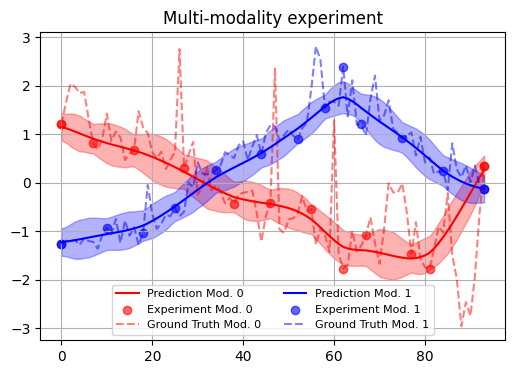

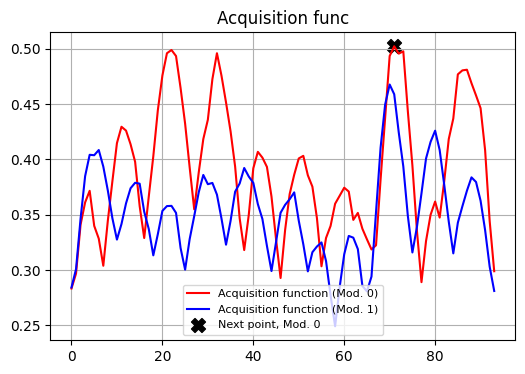


Next loc: 71; Next fidelity: 0

------ Iteration 25 --------

-- VAE Mod.0 (iter 25) --

71 0.7634408602150538
3/3 [==============================] - 0s 13ms/step


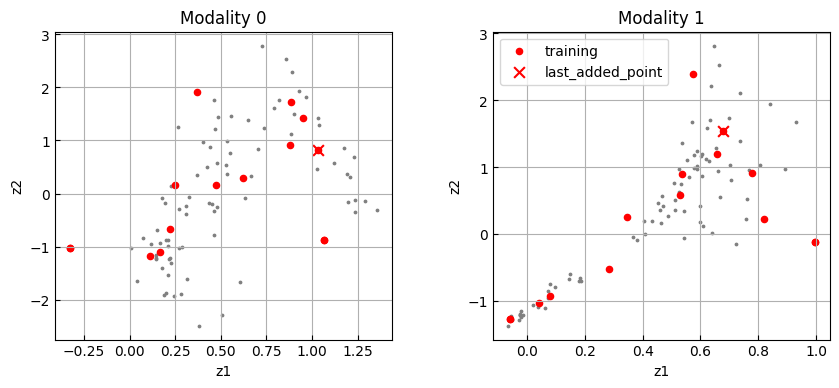


-- MF GP (iter 25) --


sample: 100%|██████████| 4000/4000 [00:32<00:00, 122.77it/s, 63 steps of size 6.56e-02. acc. prob=0.98]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.15      1.21      0.14     -1.84      1.95   1423.88      1.00
     W[0,0,1]      0.15      1.23      0.14     -1.90      2.05   1691.69      1.00
     W[0,1,0]      0.14      1.05      0.10     -1.47      1.93   1676.50      1.00
     W[0,1,1]      0.17      1.19      0.09     -1.72      2.03   1670.89      1.00
     W[1,0,0]      0.24      1.32      0.16     -1.91      2.30   1646.17      1.00
     W[1,0,1]      0.20      1.24      0.14     -1.73      2.35   1899.81      1.00
     W[1,1,0]      0.19      1.10      0.14     -1.46      2.14   1424.47      1.00
     W[1,1,1]      0.15      1.10      0.11     -1.62      1.90   2007.77      1.00
k_length[0,0]     15.06      5.06     16.97      5.56     20.00    149.12      1.00
k_length[1,0]     14.15      5.76     16.57      3.84     19.99    111.89      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

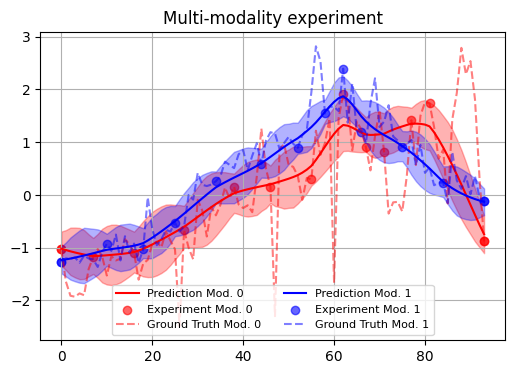

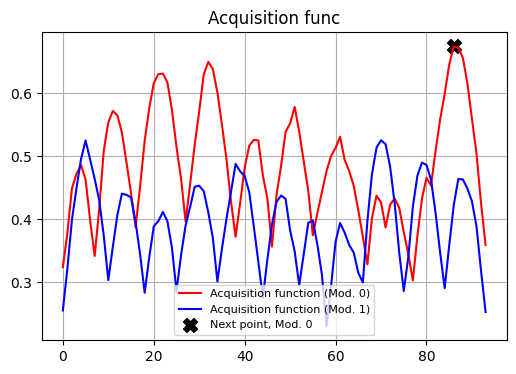


Next loc: 86; Next fidelity: 0

------ Iteration 26 --------

-- VAE Mod.0 (iter 26) --

86 0.9247311827956989
3/3 [==============================] - 0s 13ms/step


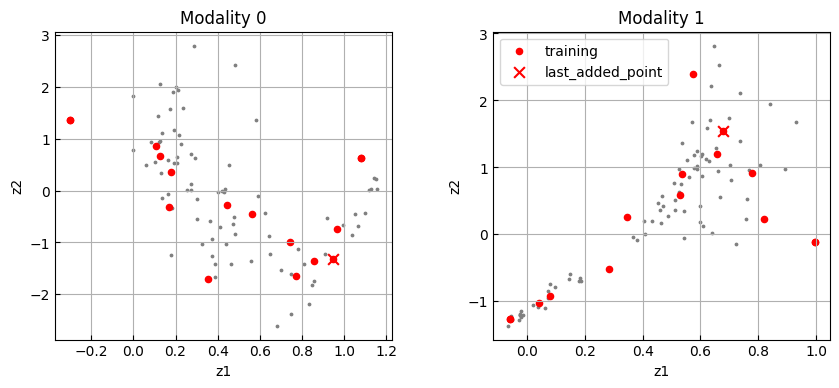


-- MF GP (iter 26) --


sample: 100%|██████████| 4000/4000 [00:30<00:00, 133.04it/s, 31 steps of size 1.17e-01. acc. prob=0.74]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.19      1.32      0.14     -1.84      2.40    937.93      1.00
     W[0,0,1]      0.10      1.25      0.08     -1.83      2.12    897.27      1.00
     W[0,1,0]      0.08      1.04      0.07     -1.61      1.81   1341.60      1.00
     W[0,1,1]      0.08      1.02      0.05     -1.74      1.61   1017.87      1.00
     W[1,0,0]      0.08      1.32      0.06     -1.93      2.32    888.10      1.00
     W[1,0,1]      0.11      1.31      0.10     -1.94      2.23    921.11      1.00
     W[1,1,0]      0.11      1.02      0.09     -1.64      1.73    846.06      1.00
     W[1,1,1]      0.04      1.00      0.04     -1.50      1.66    948.11      1.00
k_length[0,0]     13.78      5.23     15.53      6.27     20.00    220.28      1.02
k_length[1,0]     13.64      5.20     15.14      6.12     20.00    214.61      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

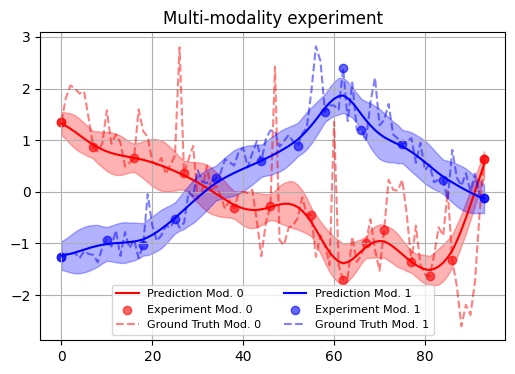

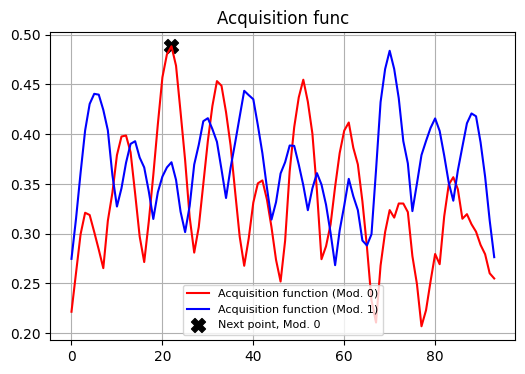


Next loc: 22; Next fidelity: 0

------ Iteration 27 --------

-- VAE Mod.0 (iter 27) --

22 0.23655913978494625
3/3 [==============================] - 0s 13ms/step


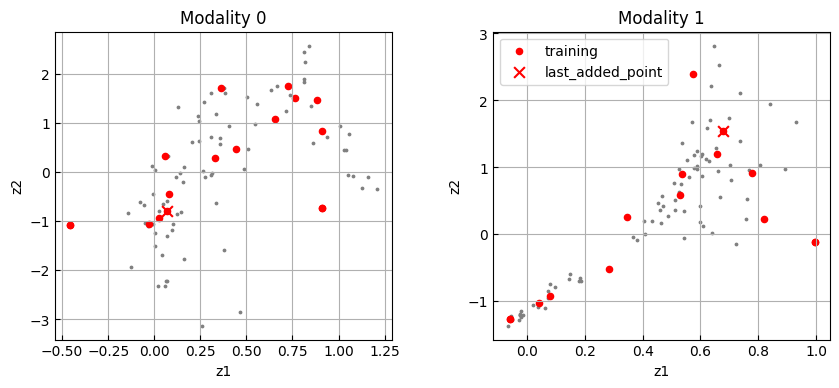


-- MF GP (iter 27) --


sample: 100%|██████████| 4000/4000 [01:18<00:00, 51.10it/s, 31 steps of size 9.72e-02. acc. prob=0.80]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.25      1.31      0.20     -1.78      2.28   1203.48      1.00
     W[0,0,1]      0.23      1.30      0.18     -1.82      2.26    931.81      1.00
     W[0,1,0]      0.13      1.01      0.15     -1.50      1.86   1122.88      1.01
     W[0,1,1]      0.17      1.06      0.13     -1.54      1.98    999.70      1.00
     W[1,0,0]      0.25      1.35      0.19     -2.02      2.22    840.24      1.00
     W[1,0,1]      0.21      1.24      0.15     -1.91      2.15   1133.21      1.00
     W[1,1,0]      0.18      1.07      0.13     -1.50      1.82    695.99      1.00
     W[1,1,1]      0.12      1.03      0.08     -1.58      1.57   1013.08      1.00
k_length[0,0]     13.84      4.72     14.99      6.98     19.98    226.73      1.00
k_length[1,0]     13.08      5.06     14.22      6.25     20.00    200.71      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

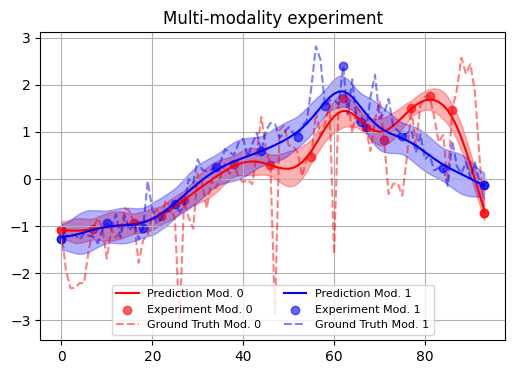

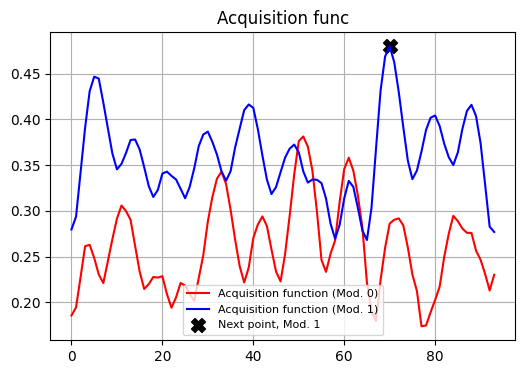


Next loc: 70; Next fidelity: 1

------ Iteration 28 --------

-- VAE Mod.1 (iter 28) --

70 0.7526881720430108
3/3 [==============================] - 0s 12ms/step


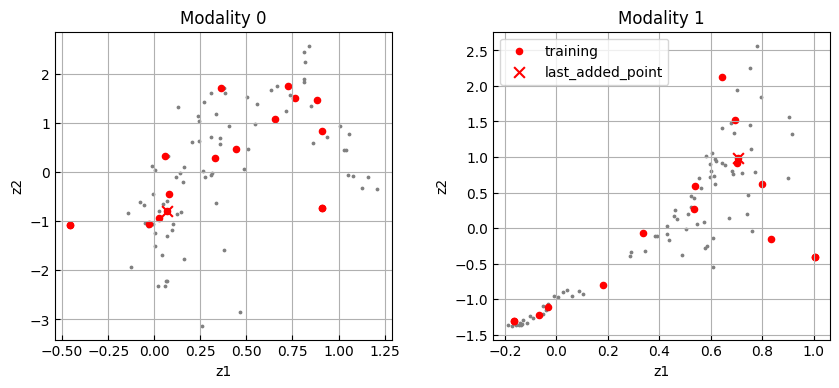


-- MF GP (iter 28) --


sample: 100%|██████████| 4000/4000 [01:15<00:00, 53.31it/s, 31 steps of size 1.16e-01. acc. prob=0.75]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.25      1.32      0.17     -1.86      2.36    930.04      1.00
     W[0,0,1]      0.23      1.24      0.17     -1.78      2.13    930.91      1.00
     W[0,1,0]      0.14      0.99      0.10     -1.56      1.53    961.82      1.00
     W[0,1,1]      0.16      0.95      0.14     -1.27      1.74    942.39      1.00
     W[1,0,0]      0.22      1.30      0.16     -1.87      2.14   1010.50      1.00
     W[1,0,1]      0.23      1.26      0.21     -1.70      2.27   1347.13      1.00
     W[1,1,0]      0.15      1.05      0.12     -1.52      1.87    854.77      1.00
     W[1,1,1]      0.18      0.98      0.15     -1.37      1.77   1026.41      1.00
k_length[0,0]     12.97      5.36     14.44      5.08     19.98     27.94      1.03
k_length[1,0]     13.76      4.85     15.02      7.06     19.98    178.72      1.02
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

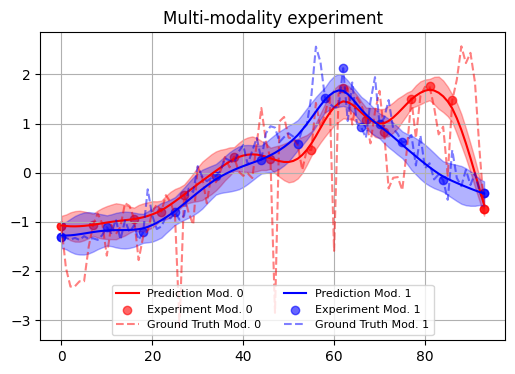

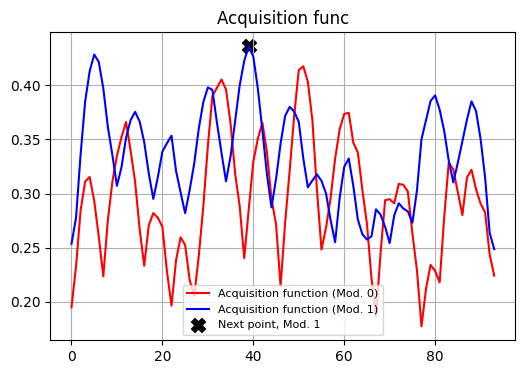


Next loc: 39; Next fidelity: 1

------ Iteration 29 --------

-- VAE Mod.1 (iter 29) --

39 0.41935483870967744
3/3 [==============================] - 0s 15ms/step


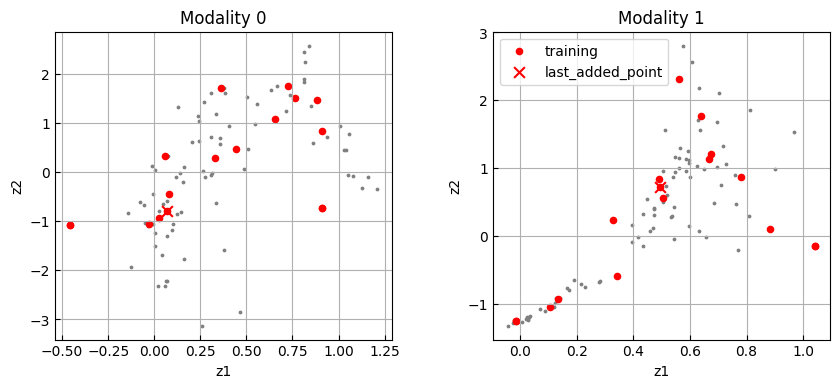


-- MF GP (iter 29) --


sample: 100%|██████████| 4000/4000 [01:29<00:00, 44.47it/s, 63 steps of size 1.01e-01. acc. prob=0.76]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.25      1.32      0.23     -1.96      2.20   1125.44      1.00
     W[0,0,1]      0.24      1.30      0.24     -1.86      2.27   1164.43      1.00
     W[0,1,0]      0.18      1.00      0.16     -1.47      1.73   1003.99      1.00
     W[0,1,1]      0.21      1.01      0.15     -1.43      1.89    966.81      1.00
     W[1,0,0]      0.21      1.34      0.18     -1.97      2.29   1058.97      1.00
     W[1,0,1]      0.21      1.29      0.21     -1.96      2.15   1132.85      1.00
     W[1,1,0]      0.19      1.05      0.14     -1.44      1.84    740.77      1.00
     W[1,1,1]      0.13      0.98      0.08     -1.34      1.75    647.21      1.00
k_length[0,0]     13.66      4.63     14.73      7.09     19.91    280.43      1.00
k_length[1,0]     13.24      4.93     14.00      6.99     20.00    149.08      1.01
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

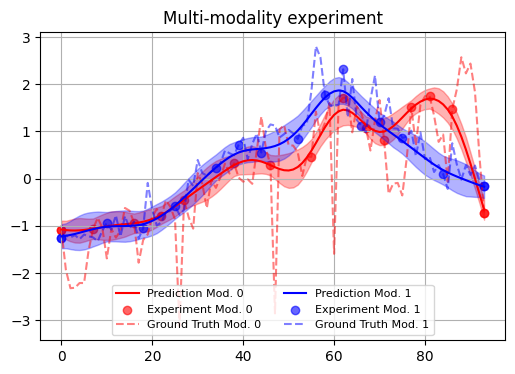

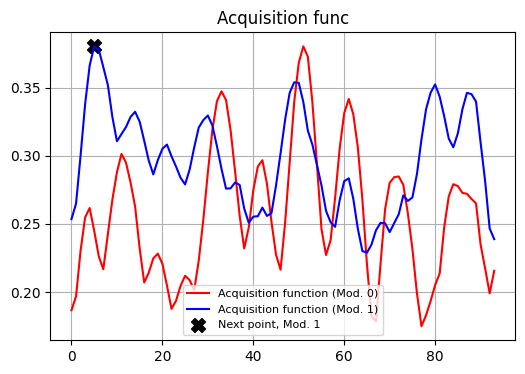


Next loc: 5; Next fidelity: 1

------ Iteration 30 --------

-- VAE Mod.1 (iter 30) --

5 0.053763440860215055
3/3 [==============================] - 0s 13ms/step


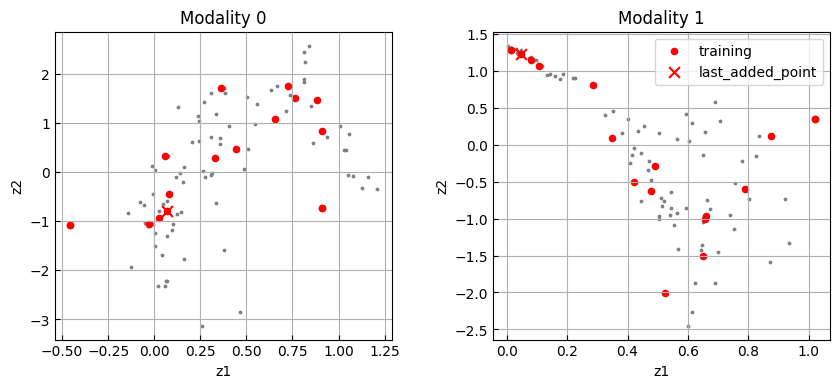


-- MF GP (iter 30) --


sample: 100%|██████████| 4000/4000 [01:32<00:00, 43.10it/s, 15 steps of size 9.17e-02. acc. prob=0.86]



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
     W[0,0,0]      0.12      1.42      0.05     -2.25      2.34   1265.11      1.00
     W[0,0,1]      0.12      1.31      0.11     -1.98      2.16   1121.31      1.00
     W[0,1,0]      0.08      0.96      0.08     -1.44      1.62   1399.45      1.00
     W[0,1,1]      0.08      0.92      0.03     -1.59      1.30   1375.52      1.00
     W[1,0,0]      0.12      1.36      0.08     -1.87      2.30   1401.42      1.00
     W[1,0,1]      0.15      1.37      0.14     -1.89      2.53   1373.06      1.00
     W[1,1,0]      0.07      0.94      0.05     -1.48      1.61   1181.55      1.00
     W[1,1,1]      0.05      0.96      0.01     -1.59      1.47   1107.85      1.00
k_length[0,0]     13.46      4.64     14.31      7.09     19.76    187.99      1.01
k_length[1,0]     13.91      4.57     14.97      7.47     19.96    247.75      1.00
   k_scale[0]      1.00      0.00      1.00      1.00      1.00       nan  

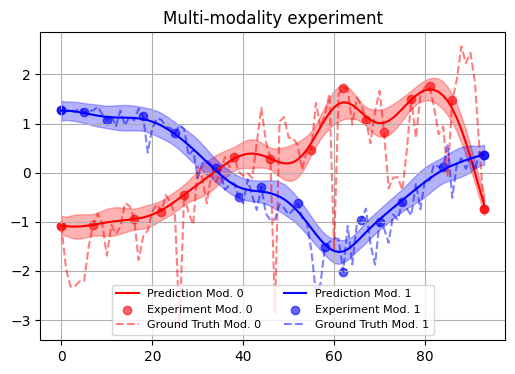

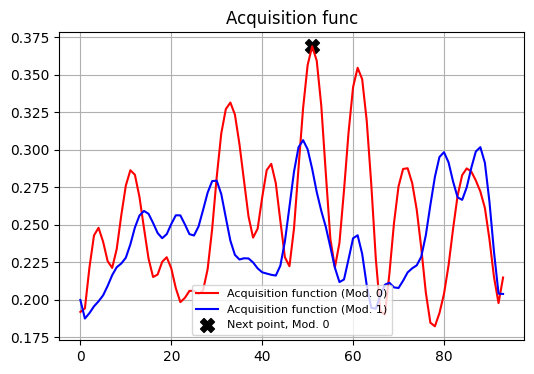


Next loc: 51; Next fidelity: 0


In [32]:
#@title processing
#seed points
N_seeds_fid1, N_seeds_fid2 = max(N_seeds_fid1, 3), max(N_seeds_fid2, 3) #minimum ends + 1 point

#-------------------------------------------------------
fig_vae = []
fig_acq = []
fig_gp = []

res_stats = {}

#--------------------------------------------------------

x = np.arange(len(fid[0]))
X_test1 = np.column_stack((x.T, np.zeros_like(x.T)))
X_test2 = np.column_stack((x.T, np.ones_like(x.T)))
X_test = np.vstack((X_test1,X_test2))

#Seed measurements
x_train_f1 = np.random.choice(np.arange(1,len(fid[0])-1), size=N_seeds_fid1-2, replace=False)
x_train_f2 = np.random.choice(np.arange(1,len(fid[1])-1), size=N_seeds_fid2-2, replace=False)
x_train_f1 = np.append(x_train_f1, [0, fid[0].shape[0]-1])
x_train_f2 = np.append(x_train_f2, [0, fid[1].shape[0]-1])

#X_train
X1_train = torch.tensor(np.vstack([x_train_f1, np.zeros(len(x_train_f1))]).T)
X2_train = torch.tensor(np.vstack([x_train_f2, np.ones(len(x_train_f2))]).T)
X_train = np.vstack([X1_train, X2_train])

VAE_y= (X_train[X_train[:,1]==0][:,0].astype(int), X_train[X_train[:,1]==1][:,0].astype(int))

#VAE train
VAE_train = [[fid[0][VAE_y[0]], VAE_y[0]/(len(fid[0])-1)],
             [fid[1][VAE_y[1]], VAE_y[1]/(len(fid[1])-1)]]

#seed VAE
print(f'\n-- VAE Mod.0 (seed) --')
_, _, (z_mean_f0, z_std_f0) = VAE(VAE_train[0], latent_dim=latent_dim, n_epoch=500,
                               test=fid[0], batch_size=min(4, len(VAE_train[0])), lvae_range = (0,1))

print(f'\n-- VAE Mod.1 (seed) --')
_, _, (z_mean_f1, z_std_f1) = VAE(VAE_train[1], latent_dim=latent_dim, n_epoch=500,
                               test=fid[1], batch_size=min(4, len(VAE_train[1])), lvae_range = (0,1))

full_z = [z_mean_f0, z_mean_f1] #to plot latent distr

z_mean = [z_mean_f0[X_train[X_train[:,1].astype(int)==0,0].astype(int)], z_mean_f1[X_train[X_train[:,1].astype(int)==1,0].astype(int)]]

fig = plot_ld(train = z_mean, test = full_z, return_fig=True, highlight_latest=False)
fig.suptitle('Iteration 0')
fig_vae.append(fig)

#y train for GP
GP_train = np.hstack([z_mean[0][:,lv_gp[0]], z_mean[1][:,lv_gp[1]]])

#iterations
for iter in range(N_iteration):

  print(f'\n------ Iteration {iter+1} --------')


#VAE
  if iter > 0:
    print(f'\n-- VAE Mod.{next_fid} (iter {iter+1}) --\n')
    X_train = np.append(X_train, [X_test[maxacq_idx]], axis=0)

    #VAE_train[next_fid].append([fid[next_fid][next_idx],next_idx/(len(fid[next_fid])-1)]) #VAE_train[next_fid] =
    VAE_train[next_fid][0] = np.append(VAE_train[next_fid][0], [fid[next_fid][next_idx]], axis=0)
    VAE_train[next_fid][1] = np.append(VAE_train[next_fid][1], next_idx/(len(fid[next_fid])-1))
    print(next_idx, next_idx/(len(fid[next_fid])-1))

    _, _, (z_mean_r, z_std_r) = VAE(VAE_train[next_fid], latent_dim=2, n_epoch=500,
                                 test=fid[next_fid], batch_size=min(4, len(VAE_train[next_fid])), lvae_range = (0,1))

    full_z[next_fid] = z_mean_r
    z_mean[next_fid] = z_mean_r[X_train[X_train[:,1].astype(int)==next_fid,0].astype(int)]

    fig = plot_ld(train = z_mean, test = full_z, return_fig=True)
    fig.suptitle('Iteration {}'.format(iter))
    fig_vae.append(fig)

    GP_train = np.append(GP_train, 0)
    GP_train[X_train[:,1]==next_fid] = z_mean[next_fid][:,lv_gp[next_fid]].squeeze()

  res_stats[f'iter {iter}'] = {'VAE_0':      np.array(z_mean[0]).astype(float),
                               'VAE_1':      np.array(z_mean[1]).astype(float),
                               'VAE_full_0': np.array(full_z[0]).astype(float),
                               'VAE_full_1': np.array(full_z[1]).astype(float)}

#MF GP
  print(f'\n-- MF GP (iter {iter+1}) --')

  gp_model = MF_BO(data_kernel='RBF', num_latents=num_latents, lengthscale_prior_dist = lengthscale_prior_dist,
                   noise_prior_dist = noise_dist_prior, W_prior_dist = W_prior_dist)

  gp_model.iteration(X_train, GP_train, X_test)

  fig = gp_model.visualize_res(vae_latents=full_z, latent_ind=lv_gp)
  fig_gp.append(fig)

  maxacq_idx, maxacq_val, fig = gp_model.UE_mf_simple(visualize=True)
  fig_acq.append(fig)
  res_stats[f'iter {iter}'].update(gp_model.get_statistics())
  next_idx, next_fid = X_test[maxacq_idx]

  print(f'\nNext loc: {next_idx}; Next fidelity: {next_fid}')

In [33]:
#save results
save_dict_to_hdf5('res.h5', res_stats)

### Make video files

In [34]:
make_video('vae.mp4', fig_vae, fps=1);

/usr/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


In [35]:
Video('vae.mp4', embed=True)

In [36]:
frame_list = []
for i in range(len(fig_gp)):
  fig_gp[i].set_dpi(100)
  fig_gp[i].suptitle('Iteration {}'.format(i))
  fig_gp[i].canvas.draw()
  rgb_gp = np.frombuffer(fig_gp[i].canvas.tostring_rgb(), dtype=np.uint8)
  rgb_gp = rgb_gp.reshape(fig_gp[i].canvas.get_width_height()[::-1] + (3,))

  fig_acq[i].set_dpi(100)
  fig_acq[i].canvas.draw()
  rgb_acq = np.frombuffer(fig_acq[i].canvas.tostring_rgb(), dtype=np.uint8)
  rgb_acq = rgb_acq.reshape(fig_acq[i].canvas.get_width_height()[::-1] + (3,))

  frame_list.append(np.concatenate([rgb_gp, rgb_acq], axis=1))

imageio.mimwrite('gp.mp4', frame_list , fps = 1)

In [37]:
Video('gp.mp4', embed=True)

In [38]:
#save figures

!mkdir figs

for i in range(len(fig_acq)):
  fig_acq[i].savefig('figs/acq_iter_{}.jpeg'.format(i), dpi=300, bbox_inches='tight')
  fig_vae[i].savefig('figs/vae_iter_{}.jpeg'.format(i), dpi=300, bbox_inches='tight')
  fig_gp[i].savefig('figs/gp_iter_{}.jpeg'.format(i), dpi=300, bbox_inches='tight')

# Forensic analysis

In [39]:
#@title import functions
def import_trajectory(file_name):
  traj_data = load_hdf5_to_dict(file_name)

  k_length = np.array([traj_data[key1]['k_length'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))])
  noise = np.array([traj_data[key1]['noise'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))])
  next_point = np.array([traj_data[key1]['next_point'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))])
  W = np.array([traj_data[key1]['W'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))])

  mean_uncertainties = np.array([traj_data[key1]['y_res_uncertainty'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))])

  VAE0 = [traj_data[key1]['VAE_0'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))]
  VAE1 = [traj_data[key1]['VAE_1'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))]

  VAE_FULL_0 = [traj_data[key1]['VAE_full_0'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))]
  VAE_FULL_1 = [traj_data[key1]['VAE_full_1'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))]

  y_mean = np.array([traj_data[key1]['y_res_mean'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))])
  x_train = [traj_data[key1]['X_train'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))]
  y_train = [traj_data[key1]['y_train'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))]
  x_test = np.array([traj_data[key1]['X_test'] for key1 in sorted(traj_data, key=lambda x: int(x.split()[1]))])[0]

  return {'k_length':       k_length,
          'noise':          noise,
          'next_point':     next_point,
          'W':              W,
          'uncertainty':     mean_uncertainties,
          'VAE0':           VAE0,
          'VAE1':           VAE1,
          'VAE_FULL_0':     VAE_FULL_0,
          'VAE_FULL_1':     VAE_FULL_1,
          'y_mean':         y_mean,
          'x_train':        x_train,
          'y_train':        y_train,
          'x_test':         x_test}

## Download pre-acquired data

In [40]:
!gdown https://drive.google.com/file/d/1XlpUyS5nyItimmw07w_pNS21zMtkIAHJ/view?usp=share_link --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1XlpUyS5nyItimmw07w_pNS21zMtkIAHJ
To: /content/1_results_Raman&BEPS_polarization_v1.h5
100% 471k/471k [00:00<00:00, 119MB/s]


In [41]:
!gdown https://drive.google.com/file/d/1YTpog7SNTsSG0kIVnh3yZxuur-MFdoCB/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1YTpog7SNTsSG0kIVnh3yZxuur-MFdoCB
To: /content/2_results_BEPS_freq&BEPS_polarization.h5
100% 471k/471k [00:00<00:00, 118MB/s]


In [42]:
traj_0 = import_trajectory('1_results_Raman&BEPS_polarization_v1.h5')
traj_1 = import_trajectory('2_results_BEPS_freq&BEPS_polarization.h5')

## Single experiment analysis

#### trajectories single

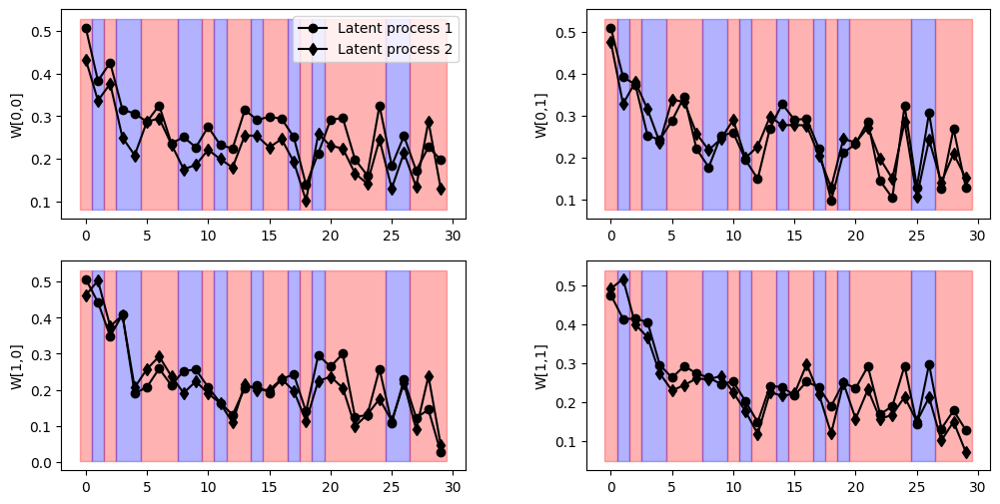

In [43]:
fig, ax = plt.subplots(2,2, figsize=(12,6))
fig.subplots_adjust(wspace=0.3)

colors = ['red', 'blue']
lab = ['o-', 'd-']
labels = ['Latent process 1', 'Latent process 2']

for i in range(2):
  for j in range(2):
    for m in range(2):
      ax[i,j].plot(traj_1['W'][:,m,i,j], lab[m],
              color='black',
              label=labels[m])

    ax[i,j].set_ylabel('W[{},{}]'.format(i,j))
ax[0,0].legend()

for i,_ in enumerate(ax.flat):
  indices = np.where(np.diff(traj_1['next_point'][:,1]) != 0)[0] +1
  indices = np.concatenate([[-0.5], indices-0.5, [len(traj_1['next_point'])-0.5]])
  ylim = _.get_ylim()
  for k in range(len(indices)-1):
    _.fill_betweenx(ylim, indices[k], indices[k+1],
                    color=colors[traj_1['next_point'][int(indices[k+1]),1]],
                    alpha=0.3)

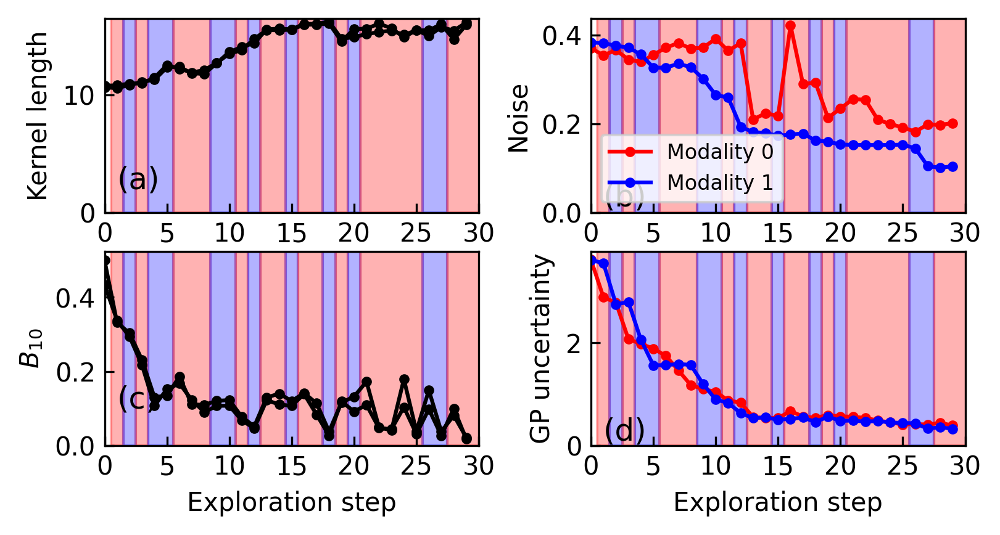

In [44]:
colors = ['red', 'blue']
ylabel = ['Kernel length', 'Noise', '$B_{10}$', 'GP uncertainty']

fig, ax = plt.subplots(2,2, figsize=(6,3), dpi=300)
fig.subplots_adjust(wspace=0.3)

for m in range(2):

  w10 = np.array([w @ w.T for w in traj_1['W'][:,m,:,:]])


  ax[0,0].plot(traj_1['k_length'][:,m].T, 'o-',
            color='black',
            markersize=3,
            label='Modality {}'.format(i))

  ax[1,0].plot(w10[:,0,1], 'o-',
            color='black',
            markersize=3,
            label='Modality {}'.format(i))

for i in range(len(traj_1['noise'].T)):
  ax[0,1].plot(traj_1['noise'].T[i], 'o-',
               markersize=3,
               color=colors[i],
               label='Modality {}'.format(i))

  ax[1,1].plot(traj_1['uncertainty'].mean(-1).T[i], 'o-',
               markersize=3,
               color=colors[i],
               label='Modality {}'.format(i))

for i,_ in enumerate(ax.flat):
  ylim = _.get_ylim()
  _.set_ylim(0,ylim[1])

  indices = np.where(np.diff(traj_1['next_point'][:,1]) != 0)[0] +1
  indices = np.concatenate([[-0.5], indices-0.5, [len(traj_1['next_point'])-0.5]])
  ylim = _.get_ylim()
  for k in range(len(indices)-1):
    _.fill_betweenx(ylim, indices[k]+1, indices[k+1]+1,
                   color=colors[traj_1['next_point'][int(indices[k+1]),1]],
                    alpha=0.3)

  _.set_xlim(0, len(traj_1['k_length']))
  _.set_xticks(np.linspace(0,30,7))
  _.set_ylabel(ylabel[i])
  _.tick_params('both', direction='in')

ax[0,1].legend(fontsize=8)
ax[1,0].set_xlabel('Exploration step', fontsize=10)
ax[1,1].set_xlabel('Exploration step', fontsize=10)

ax[0,0].text(1, 2,'(a)', fontsize=12);
ax[0,1].text(1, 0.015,'(b)', fontsize=12);
ax[1,0].text(1, 0.1,'(c)', fontsize=12);
ax[1,1].text(1, 0.1,'(d)', fontsize=12);

In [45]:
def vis_res(ymean, uncertainty, x_train, y_train, vae_gt, x_test, ax, colors=['red', 'blue']):

    lines   = []
    for i,y_mean in enumerate(ymean):
      line = ax.plot(y_mean, c=colors[i], label='Pred. Mod. {}'.format(i))

      ax.fill_between(np.arange(len(y_mean)),
                       y_mean - uncertainty[i],
                       y_mean + uncertainty[i],
                       alpha=0.3, color=colors[i])
      lines += line

    scatters = []
    for i,y_mean in enumerate(ymean):
      scatt = ax.scatter(x_train[x_train[:,1]==i, 0],
                  y_train[x_train[:,1]==i],
                  c=colors[i],
                  label='Exp. Mod. {}'.format(i),
                  alpha=0.6,
                  s=20)
      scatters += [scatt]

    gts = []
    for i,y_mean in enumerate(ymean):
      gt = ax.plot(x_test[i][:,0],
              vae_gt[i][:,-1], '--',
              color=colors[i],
              label='GT Mod. {}'.format(i),
              alpha=0.5)
      gts += gt

    res = lines + scatters + gts

    return ax, res

Text(0.5, 0, 'Location')

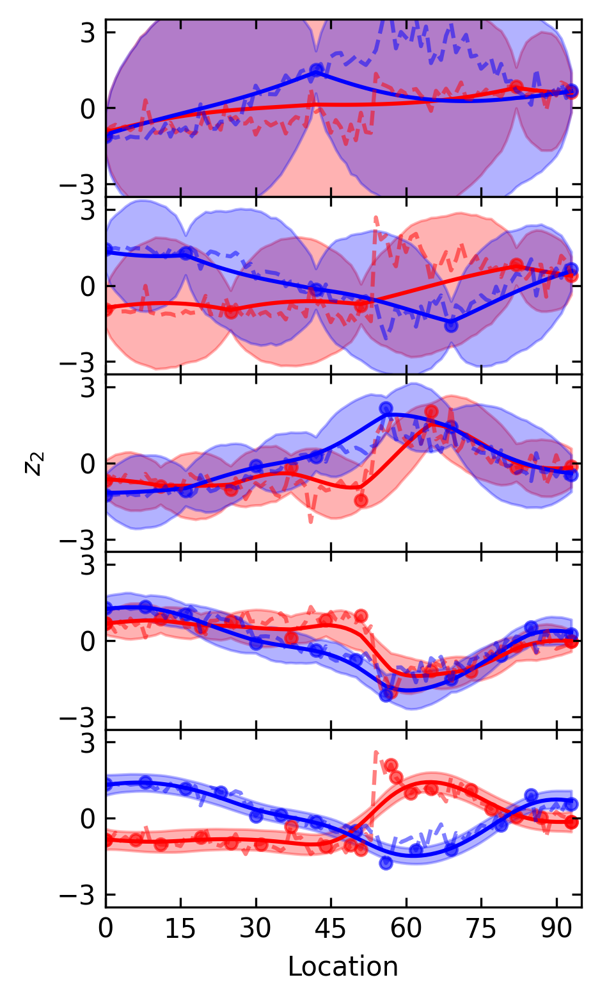

In [46]:
kk = [0,4,9,19,29]
axes_legend = []

fig, ax = plt.subplots(5,1, figsize=(3.2, 6), dpi=300)
fig.subplots_adjust(hspace=0)
for k, axes in enumerate(ax.flat):
  axes, _ = vis_res(traj_1['y_mean'][kk[k]],
                 traj_1['uncertainty'][kk[k]],
                 traj_1['x_train'][kk[k]],
                 traj_1['y_train'][kk[k]],
                 [traj_1['VAE_FULL_0'][kk[k]], traj_1['VAE_FULL_1'][kk[k]]],
                 traj_1['x_test'],
                 axes)

  axes.set_xlim(0,95)
  axes.set_ylim(-3.5,3.5)
  axes.set_yticks([-3,0,3]);
  axes.set_xticks(np.linspace(0,90,7));
  axes.set_xticklabels([])
  axes.tick_params('both', direction='in', right=True, top=True)

  if k==2:
    axes.set_ylabel('$z_2$')

  axes_legend.append(axes)

axes.set_xticklabels(np.linspace(0,90,7).astype(int));
axes.set_xlabel('Location', fontsize=10)

#### stationarity single

In [47]:
def KS(vae):
  ks = []
  p = []
  cdf_st = []

  for i in range(len(vae)-1):
    vaei = vae[i] - vae[i].mean(0)
    vaei1 = vae[i+1] - vae[i+1].mean(0)
    ks_x, p_x = ks_2samp(vaei[:,0], vaei1[:,0])
    ks_y, p_y = ks_2samp(vaei[:,1], vaei1[:,1])
    cdfx = diff_CDF(vaei[:,0], vaei1[:,0])
    cdfy = diff_CDF(vaei[:,1], vaei1[:,1])

    ks.append([ks_x, ks_y])
    p.append([p_x,p_y])
    cdf_st.append([cdfx, cdfy])

  ks = np.array(ks)
  p = np.array(p)
  cdf_st = np.array(cdf_st)
  return cdf_st, ks, p

def diff_CDF(data1, data2):
  data1 = np.sort(data1)
  data2 = np.sort(data2)
  n1 = data1.shape[0]
  n2 = data2.shape[0]
  data_all = np.linspace(-10,10,500)#np.concatenate([data1, data2])
  # using searchsorted solves equal data problem
  cdf1 = np.searchsorted(data1, data_all, side='right') / n1
  cdf2 = np.searchsorted(data2, data_all, side='right') / n2
  cddiffs = abs(cdf1 - cdf2)
  return cdf1, cdf2, cddiffs

def KS_ground_truth(vae, vae_gt):
  ks = []
  p = []
  cdf_st = []

  vaei1 = vae_gt - vae_gt.mean(0)
  for i in range(len(vae)):
    vaei = vae[i] - vae[i].mean(0)
    ks_x, p_x = ks_2samp(vaei[:,0], vaei1[:,0])
    ks_y, p_y = ks_2samp(vaei[:,1], vaei1[:,1])
    cdfx = diff_CDF(vaei[:,0], vaei1[:,0])
    cdfy = diff_CDF(vaei[:,1], vaei1[:,1])

    ks.append([ks_x, ks_y])
    p.append([p_x,p_y])
    cdf_st.append([cdfx, cdfy])

  ks = np.array(ks)
  p = np.array(p)
  cdf_st = np.array(cdf_st)
  return cdf_st, ks, p

In [48]:
ind0 = np.where(traj_1['next_point'][:,1]==0)[0]+1
ind1 = np.where(traj_1['next_point'][:,1]==1)[0]+1

if 0 not in ind0:
  ind0 = np.insert(ind0, 0, 0)
if 0 not in ind1:
  ind1 = np.insert(ind1, 0, 0)

if len(traj_1['VAE0']) in ind0:
  ind0 = ind0[:-1]
else:
  ind1 = ind1[:-1]

vae0 = [traj_1['VAE0'][i] for i in ind0]
vae1 = [traj_1['VAE1'][i] for i in ind1]

vae_full_0 = [traj_1['VAE_FULL_0'][i] for i in ind0]
vae_full_1 = [traj_1['VAE_FULL_1'][i] for i in ind1]

In [49]:
cdfst0, ks0, p0 = KS(vae0)
cdfst1, ks1, p1 = KS(vae1)

cdfst_full_0, ks_full_0, p_full_0 = KS(vae_full_0)
cdfst_full_1, ks_full_1, p_full_1 = KS(vae_full_1)

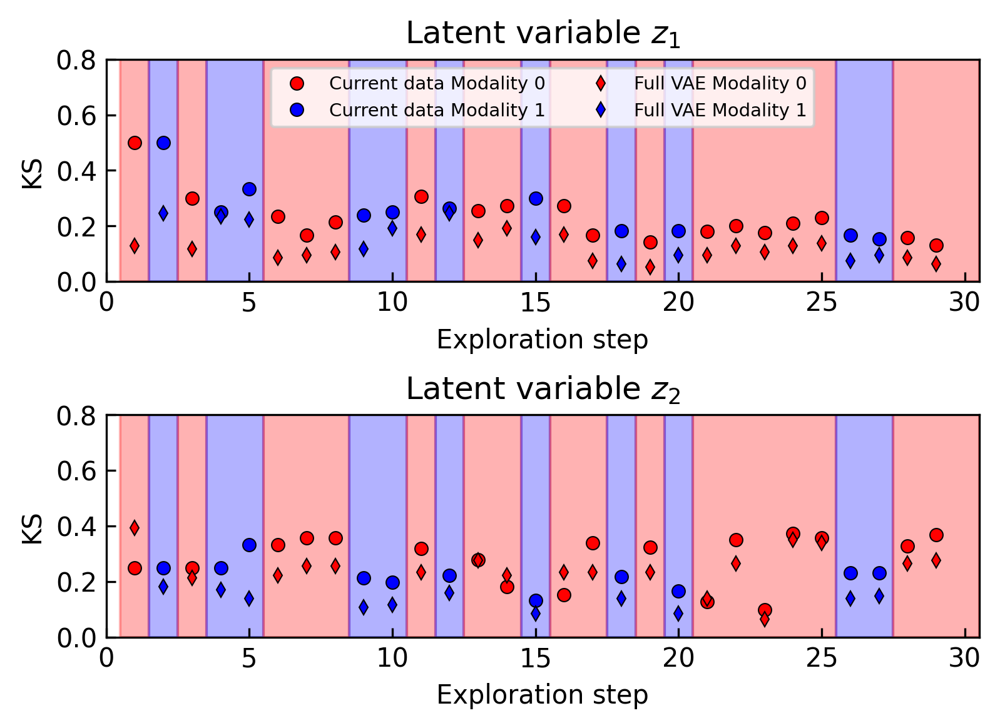

In [50]:
colors = ['red', 'blue']
mod = ['Modality 0', 'Modality 1']
titles = ['$z_1$', '$z_2$']
fig, ax = plt.subplots(2,1, figsize=(6,4), dpi=300)
fig.subplots_adjust(hspace=0.6)

for i in range(2):
  ax[i].plot(ind0[1:], ks0[:,i], 'o', ms=5, color = colors[0], label='Current data {}'.format(mod[0]),
             markeredgecolor='black', markeredgewidth=0.5)
  ax[i].plot(ind1[1:], ks1[:,i], 'o', ms=5, color = colors[1], label='Current data {}'.format(mod[1]),
             markeredgecolor='black', markeredgewidth=0.5)

  ax[i].plot(ind0[1:], ks_full_0[:,i], 'd', ms=4, color = colors[0], label='Full VAE {}'.format(mod[0]),
             markeredgecolor='black', markeredgewidth=0.5)
  ax[i].plot(ind1[1:], ks_full_1[:,i], 'd', ms=4, color = colors[1], label='Full VAE {}'.format(mod[1]),
             markeredgecolor='black', markeredgewidth=0.5)

  ax[i].set_title('Latent variable {}'.format(titles[i]))

ax[0].legend(loc='upper center', fontsize=7, ncol=2)

for i,_ in enumerate(ax):
  _.set_xlim(0, 30.5)
  _.set_ylim(0,.8)
  _.set_ylabel('KS')
  _.set_xlabel('Exploration step')
  _.tick_params('both', direction='in')


  indices = np.where(np.diff(traj_1['next_point'][:,1]) != 0)[0] +1
  indices = np.concatenate([[-0.5], indices-0.5, [len(traj_1['next_point'])-0.5]])
  ylim = _.get_ylim()
  for k in range(len(indices)-1):
    _.fill_betweenx(ylim, indices[k]+1, indices[k+1]+1,
                   color=colors[traj_1['next_point'][int(indices[k+1]),1]],
                    alpha=0.3)

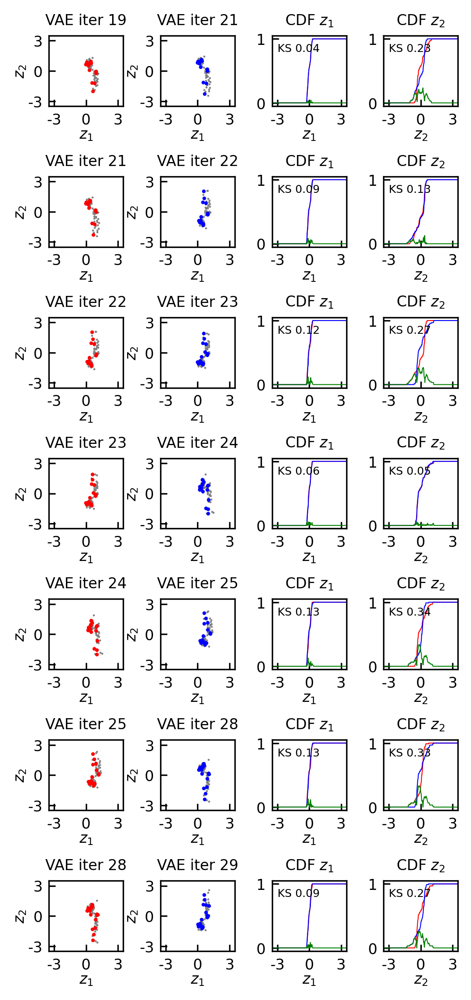

In [51]:
xx = np.linspace(-5,5,500)
colors = ['red', 'blue']

cdfst_full = cdfst_full_0
vae_full = vae_full_0
vae = vae0
ind = ind0
ks = ks0

fig, ax = plt.subplots(7,4, figsize=(4,9), dpi=300)
fig.subplots_adjust(hspace=1, wspace=0.5)

for i,ii in enumerate(range(-8,-1)):
  for k in range(2):
    ax[i,k].scatter(*vae_full[ii+k].T, s=1, color='gray', lw=0.1)
    ax[i,k].scatter(*vae[ii+k].T, s=1, color=colors[k])
    ax[i,k].set_ylim(-3.5,3.5)
    ax[i,k].set_yticks([-3,0,3])
    ax[i,k].set_yticklabels([-3,0,3],fontsize=8)
    ax[i,k].set_xlabel('$z_1$', fontsize=8, labelpad=0.1)
    ax[i,k].set_ylabel('$z_2$', fontsize=8, labelpad=0.1)
    ax[i,k].set_title('VAE iter {}'.format(ind[ii+k]),fontsize=8)

  for k in range(2):
    ax[i,2+k].plot(xx, cdfst_full[ii,k,0], color='red', lw=0.5)
    ax[i,2+k].plot(xx, cdfst_full[ii,k,1], color='blue', lw=0.5)
    ax[i,2+k].plot(xx, cdfst_full[ii,k,2], color='green', lw=0.5)
    ax[i,2+k].text(-3,0.8,'KS {}'.format(round(cdfst_full[ii,k,2].max(),2)), fontsize=6)

    ax[i,2+k].set_ylim(-.05,1.05)
    ax[i,2+k].set_yticks([0,1])
    ax[i,2+k].set_yticklabels([0,1],fontsize=8)
    ax[i,2+k].set_title('CDF $z_{}$'.format(k+1),fontsize=8)
    ax[i,2+k].set_xlabel('$z_{}$'.format(k+1), fontsize=8, labelpad=0.1)

for _ in ax.flat:
  _.set_xlim(-3.5,3.5)
  _.tick_params('both', direction='in')
  _.set_xticks([-3,0,3])
  _.set_xticklabels([-3,0,3],fontsize=8)


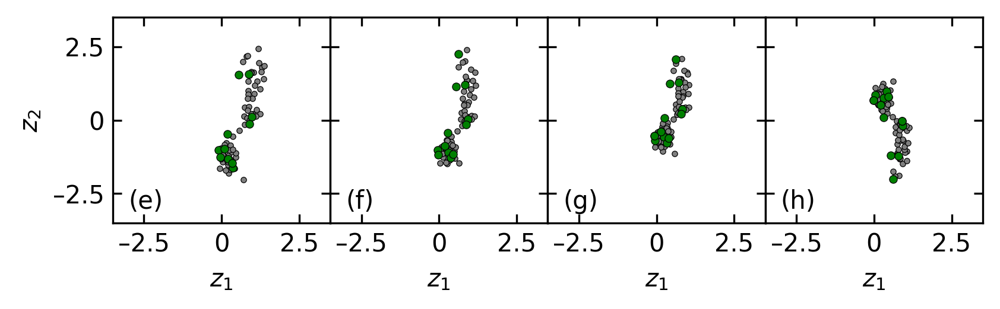

In [52]:
lbls = ['(e)', '(f)', '(g)', '(h)']

fig, ax = plt.subplots(1,4, figsize=(6.3,1.5), dpi=300)
fig.subplots_adjust(wspace=0)

for i in range(len(ax)):
  ax[i].scatter(*vae_full[i+8].T, s=5, color='gray', lw=0.3, ec='black')
  ax[i].scatter(*vae[i+8].T, s=10, color='green', lw=0.3, ec='black')
  ax[i].text(-3, -3, lbls[i])

for _ in ax.flat:
  _.set_xlim(-3.5,3.5)
  _.set_ylim(-3.5,3.5)
  _.set_yticks([-2.5, 0, 2.5]);
  _.set_xticks([-2.5, 0, 2.5]);
  _.set_xticklabels(['–2.5', '0', '2.5']);
  _.set_yticklabels([])
  _.tick_params('both', direction='in', top=True, right=True)
  _.set_xlabel('$z_1$', fontsize=10)

ax[0].set_yticklabels(['–2.5', '0', '2.5']);
ax[0].set_ylabel('$z_2$', fontsize=10);

Text(0.5, 0, 'Location')

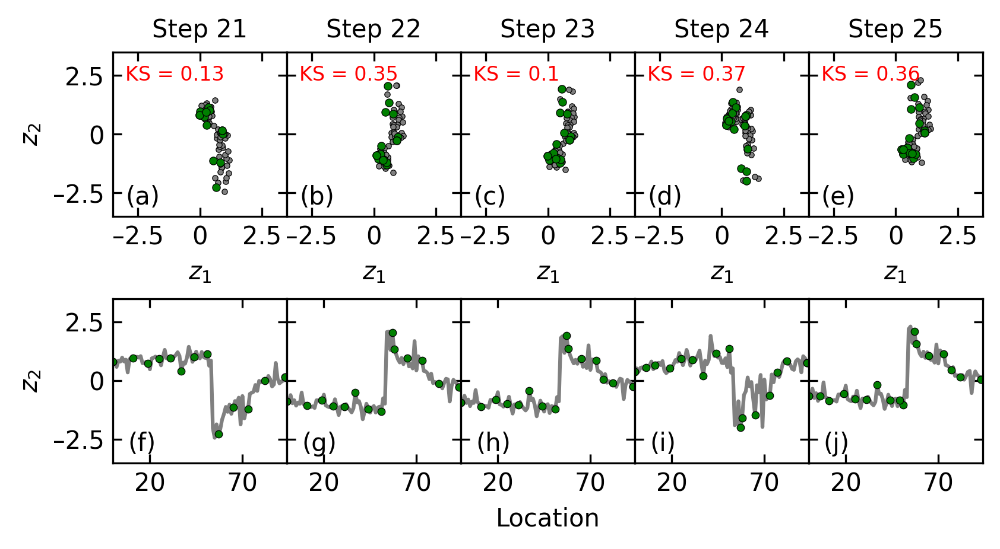

In [53]:
x_train = traj_1['x_train']
lbls = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)', '(i)', '(j)']
fig, ax = plt.subplots(2,5, figsize=(6.3,3), dpi=300, sharey=True)
fig.subplots_adjust(wspace=0, hspace=0.5)

for i in range(len(ax[0])):
  ax[0,i].scatter(*vae_full[i+12].T, s=5, color='gray', lw=0.3, ec='black')
  ax[0,i].scatter(*vae[i+12].T, s=10, color='green', lw=0.3, ec='black')
  ax[0,i].set_title('Step '+str(ind[i+12]), fontsize=10)

  ax[1,i].plot(vae_full[i+12][:,-1], '-', color='gray')
  ax[1,i].plot(x_train[ind[i+12]][x_train[ind[i+12]][:,1]==0][:,0],
               vae[i+12][:,-1], 'o', markersize=3, color='green', lw=0.3, mec='black', mew=0.3)

  ax[0,i].text(-3, 2.3, 'KS = {}'.format(round(ks[i+11,-1],2)), fontsize=8, color='red')
  ax[0,i].text(-3, -3, lbls[i])
  ax[1,i].text(8, -3, lbls[i+5])

for _ in ax[0].flat:
  _.set_xlim(-3.5,3.5)
  _.set_ylim(-3.5,3.5)
  _.set_yticks([-2.5, 0, 2.5]);
  _.set_xticks([-2.5, 0, 2.5]);
  _.set_xticklabels(['–2.5', '0', '2.5']);
  _.set_yticklabels([])
  _.tick_params('both', direction='in', top=True, right=True)
  _.set_xlabel('$z_1$', fontsize=10)

for _ in ax[1].flat:
  _.set_xlim(0, 94)
  _.set_ylim(-3.5,3.5)
  _.set_yticks([-2.5, 0, 2.5]);
  _.set_xticks([20, 70]);
  _.set_xticklabels(['20', '70']);
  _.set_yticklabels([])
  _.tick_params('both', direction='in', top=True, right=True)

ax[0,0].set_yticklabels(['–2.5', '0', '2.5']);
ax[0,0].set_ylabel('$z_2$', fontsize=10);
ax[1,0].set_ylabel('$z_2$', fontsize=10);
ax[1,2].set_xlabel('Location', fontsize=10)

## Two experiment comparison

#### trajectories two exp

In [54]:
traj_0 = import_trajectory('1_results_Raman&BEPS_polarization_v1.h5')
traj_1 = import_trajectory('2_results_BEPS_freq&BEPS_polarization.h5')

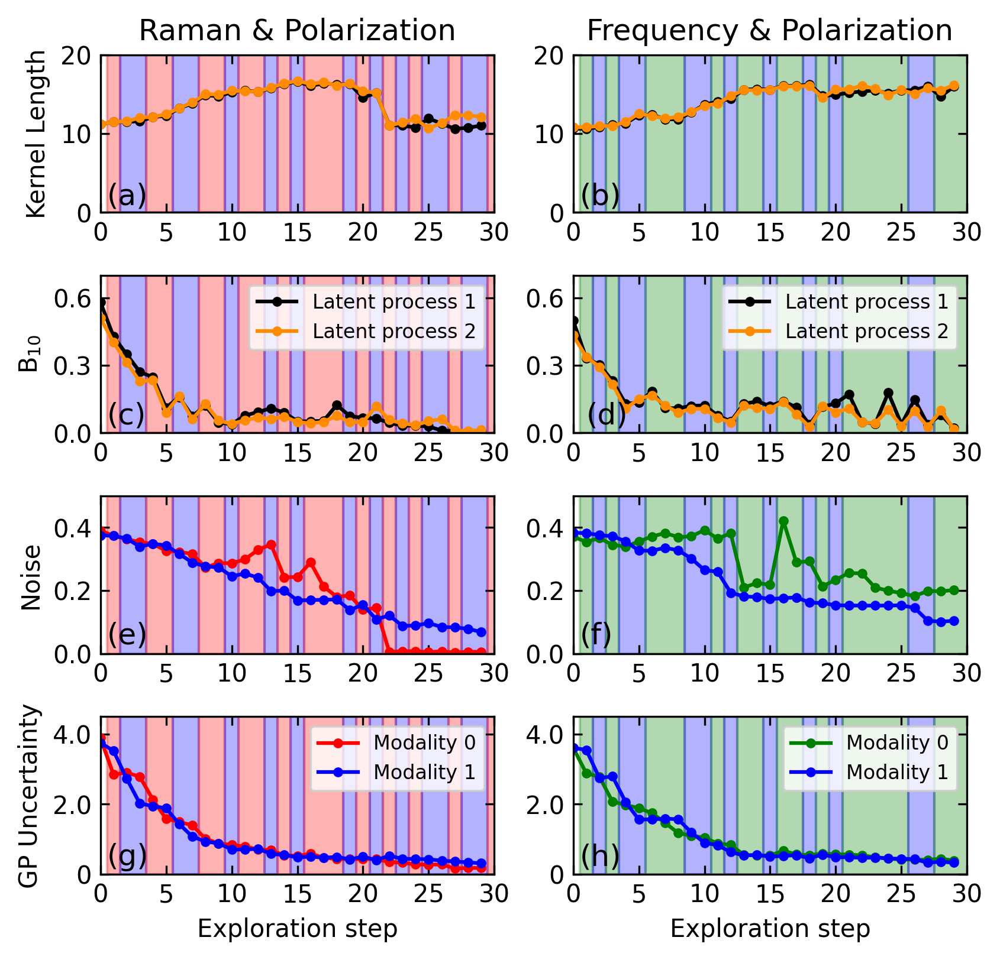

In [55]:
#@title params fig
colors = [['red', 'blue',],['green', 'blue']]
ylabel = ['Kernel Length', 'B$_{10}$', 'Noise', 'GP Uncertainty']
letters = ['(a)', '(b)', '(c)', '(d)',
           '(e)', '(f)', '(g)', '(h)']

ttype = ['-o', '-o']
c1 = ['black', 'darkorange', ]
l1 = ['Latent process 1', 'Latent process 2']


traj = [traj_0, traj_1]

fig, ax = plt.subplots(4,2, figsize=(6.3,6), dpi=300)
fig.subplots_adjust(wspace=0.2, hspace=0.4)

#plot graphs
for k in range(len(traj)):
  for m in range(2):
    w10 = np.array([w @ w.T for w in traj[k]['W'][:,m]])


    ax[0,k].plot(traj[k]['k_length'][:,m], ttype[m], color=c1[m], markersize=3, label=l1[m])

    ax[1,k].plot(w10[:,0,1], ttype[m], color=c1[m], markersize=3, label=l1[m])

  for i in range(len(traj[k]['noise'].T)):
    ax[2,k].plot(traj[k]['noise'].T[i], 'o-', markersize=3, color=colors[k][i],
                label='Modality {}'.format(i))

    ax[3,k].plot(traj[k]['uncertainty'].mean(-1).T[i], 'o-', markersize=3,
                color=colors[k][i], label='Modality {}'.format(i))

#labels and limits
for i in range(4):
  ax[i,0].set_ylabel(ylabel[i])

for i in range(2):
  ax[0,i].set_ylim(0,20)
  ax[1,i].set_ylim(0,0.7)
  ax[1,i].set_yticks([0,0.3,0.6])
  ax[2,i].set_ylim(0,0.5)
  ax[3,i].set_ylim(0,4.5)
  ax[3,i].set_yticks([0,2,4])
  ax[3,i].set_yticklabels(['0','2.0','4.0'])


#background colors
for k in range(len(traj)):
  for _ in ax[:,k]:

    indices = np.where(np.diff(traj[k]['next_point'][:,1]) != 0)[0] +1
    indices = np.concatenate([[-0.5], indices-0.5, [len(traj[k]['next_point'])-0.5]])
    ylim = _.get_ylim()
    _.set_ylim(0,ylim[1])

    for kk in range(len(indices)-1):
      _.fill_betweenx([0,ylim[1]], indices[kk]+1, indices[kk+1]+1,
                    color=colors[k][traj[k]['next_point'][int(indices[kk+1]),1]],
                      alpha=0.3)
      _.set_xlim(0, len(traj[k]['k_length']))
      _.set_xticks(np.linspace(0,30,7))
      _.tick_params('both', direction='in', top=True, right=True)


ax[3,0].legend(fontsize=8)
ax[3,1].legend(fontsize=8)
ax[1,0].legend(fontsize=8)
ax[1,1].legend(fontsize=8)

ax[3,0].set_xlabel('Exploration step', fontsize=10)
ax[3,1].set_xlabel('Exploration step', fontsize=10)
ax[0,0].set_title('Raman & Polarization')
ax[0,1].set_title('Frequency & Polarization')

ax[0,0].text(0.5, 1,'(a)', fontsize=12);
ax[0,1].text(0.5, 1,'(b)', fontsize=12);
ax[1,0].text(0.5, 0.04,'(с)', fontsize=12);
ax[1,1].text(1, 0.04,'(d)', fontsize=12);
ax[2,0].text(0.5, 0.03,'(e)', fontsize=12);
ax[2,1].text(0.5, 0.03,'(f)', fontsize=12);
ax[3,0].text(0.5, 0.25,'(g)', fontsize=12);
ax[3,1].text(0.5, 0.25,'(h)', fontsize=12);

In [56]:
def vis_res(ymean, uncertainty, x_train, y_train, vae_gt, x_test, ax, colors=['red', 'blue']):

    lines   = []
    for i,y_mean in enumerate(ymean):
      line = ax.plot(y_mean, c=colors[i], label='Pred. Mod. {}'.format(i))

      ax.fill_between(np.arange(len(y_mean)),
                       y_mean - uncertainty[i],
                       y_mean + uncertainty[i],
                       alpha=0.3, color=colors[i])
      lines += line

    scatters = []
    for i,y_mean in enumerate(ymean):
      scatt = ax.scatter(x_train[x_train[:,1]==i, 0],
                  y_train[x_train[:,1]==i],
                  c=colors[i],
                  label='Exp. Mod. {}'.format(i),
                  alpha=0.6,
                  s=20)
      scatters += [scatt]

    gts = []
    for i,y_mean in enumerate(ymean):
      gt = ax.plot(x_test[i][:,0],
              vae_gt[i][:,-1], '--',
              color=colors[i],
              label='GT Mod. {}'.format(i),
              alpha=0.5)
      gts += gt

    res = lines + scatters + gts
    return ax, res

Text(0.5, 1.0, 'Frequency & Polarization')

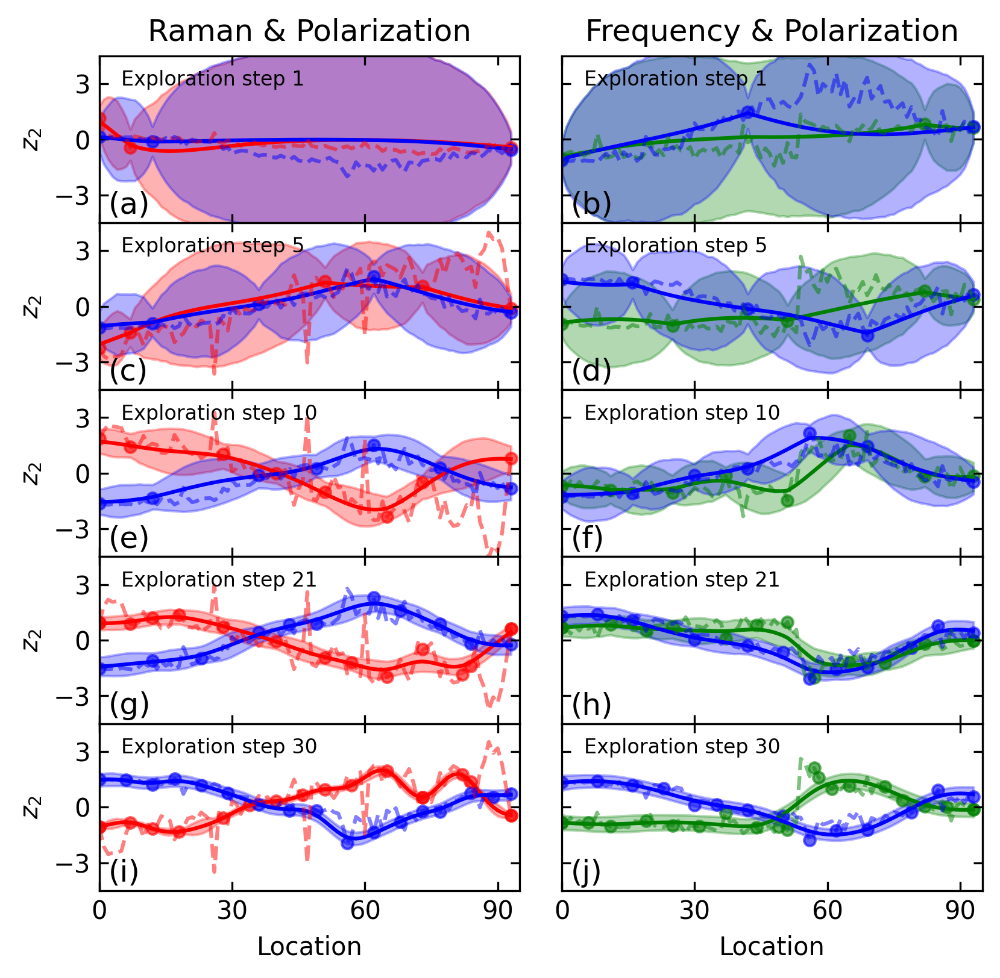

In [57]:
kk = [0,4,9,20,29]
colors = [['red', 'blue'], ['green', 'blue']]
axes_legend = []
letters = ['(a)', '(b)', '(c)', '(d)',
           '(e)', '(f)', '(g)', '(h)',
           '(i)', '(j)']
liness = []

fig, ax = plt.subplots(5,2, figsize=(6.3, 6), dpi=300, sharey=True, sharex=True)
fig.subplots_adjust(hspace=0, wspace=0.1)

for i in range(len(traj)):
  for n, k in enumerate(kk):
    ax[n, i], lines =  vis_res(traj[i]['y_mean'][k],
                        traj[i]['uncertainty'][k],
                        traj[i]['x_train'][k],
                        traj[i]['y_train'][k],
                        [traj[i]['VAE_FULL_0'][k], traj[i]['VAE_FULL_1'][k]],
                        traj[i]['x_test'],
                        ax[n, i],
                        colors = colors[i])

    ax[n, i].text(5, 2.9,'Exploration step {}'.format(k+1), fontsize=8)
  liness += lines

for i in range(len(kk)):
  ax[i,0].set_ylabel('$z_2$', fontsize=10)

for l, _ in enumerate(ax.flat):
  _.set_ylim(-4.5, 4.5)
  _.set_yticks([-3,0,3])
  _.tick_params('both', direction='in', top=True, right=True, left=True)
  _.text(2, -4, letters[l], fontsize=12)
  _.set_xlim(0,95)
  _.set_xticks([0,30,60,90])
  _.set_xticklabels([])

ax[4,0].set_xticklabels([0,30,60,90], fontsize=10)
ax[4,0].set_xlabel('Location', fontsize=10)
ax[4,1].set_xticklabels([0,30,60,90], fontsize=10)
ax[4,1].set_xlabel('Location', fontsize=10)

ax[0,0].set_title('Raman & Polarization')
ax[0,1].set_title('Frequency & Polarization')

#### stationary two experiment

In [58]:
def KS(vae):
  ks = []
  p = []
  cdf_st = []

  for i in range(len(vae)-1):
    vaei = vae[i] - vae[i].mean(0)
    vaei1 = vae[i+1] - vae[i+1].mean(0)
    ks_x, p_x = ks_2samp(vaei[:,0], vaei1[:,0])
    ks_y, p_y = ks_2samp(vaei[:,1], vaei1[:,1])
    cdfx = diff_CDF(vaei[:,0], vaei1[:,0])
    cdfy = diff_CDF(vaei[:,1], vaei1[:,1])

    ks.append([ks_x, ks_y])
    p.append([p_x,p_y])
    cdf_st.append([cdfx, cdfy])

  ks = np.array(ks)
  p = np.array(p)
  cdf_st = np.array(cdf_st)
  return cdf_st, ks, p

def diff_CDF(data1, data2):
  data1 = np.sort(data1)
  data2 = np.sort(data2)
  n1 = data1.shape[0]
  n2 = data2.shape[0]
  data_all = np.linspace(-10,10,500)#np.concatenate([data1, data2])
  # using searchsorted solves equal data problem
  cdf1 = np.searchsorted(data1, data_all, side='right') / n1
  cdf2 = np.searchsorted(data2, data_all, side='right') / n2
  cddiffs = abs(cdf1 - cdf2)
  return cdf1, cdf2, cddiffs

def KS_ground_truth(vae, vae_gt):
  ks = []
  p = []
  cdf_st = []

  vaei1 = vae_gt - vae_gt.mean(0)
  for i in range(len(vae)):
    vaei = vae[i] - vae[i].mean(0)
    ks_x, p_x = ks_2samp(vaei[:,0], vaei1[:,0])
    ks_y, p_y = ks_2samp(vaei[:,1], vaei1[:,1])
    cdfx = diff_CDF(vaei[:,0], vaei1[:,0])
    cdfy = diff_CDF(vaei[:,1], vaei1[:,1])

    ks.append([ks_x, ks_y])
    p.append([p_x,p_y])
    cdf_st.append([cdfx, cdfy])

  ks = np.array(ks)
  p = np.array(p)
  cdf_st = np.array(cdf_st)
  return cdf_st, ks, p

Text(0, -0.22, '(b)')

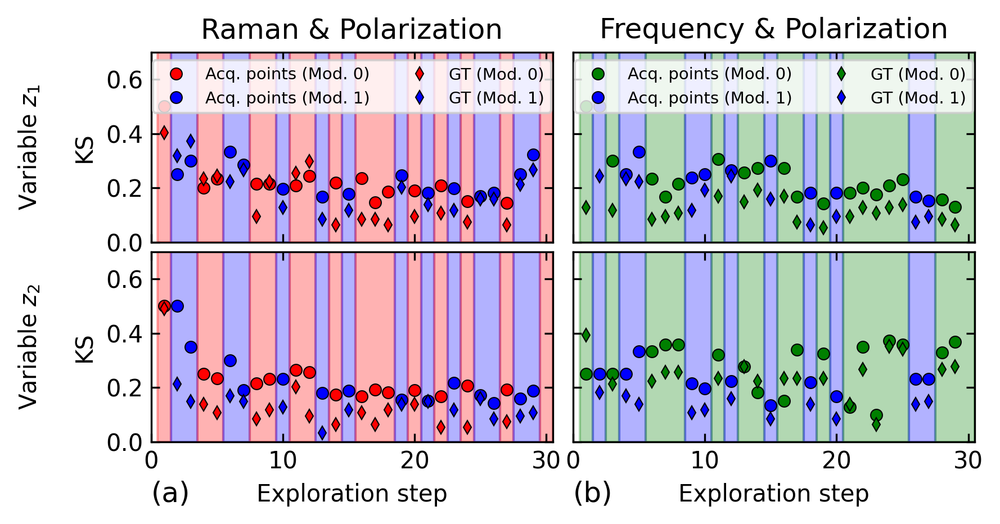

In [59]:
#@title fig KS criteria
colors = [['red', 'blue'], ['green', 'blue']]
mod = ['Mod. 0', 'Mod. 1']
titles = ['$z_1$', '$z_2$']

fig, ax = plt.subplots(2,2, figsize=(6.3,3), dpi=300, sharex=True, sharey=True)
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for k in range(len(traj)):
  ind0 = np.where(traj[k]['next_point'][:,1]==0)[0]+1
  ind1 = np.where(traj[k]['next_point'][:,1]==1)[0]+1

  if 0 not in ind0:
    ind0 = np.insert(ind0, 0, 0)
  if 0 not in ind1:
    ind1 = np.insert(ind1, 0, 0)

  if len(traj[k]['VAE0']) in ind0:
    ind0 = ind0[:-1]
  else:
    ind1 = ind1[:-1]

  vae0 = [traj[k]['VAE0'][i] for i in ind0]
  vae1 = [traj[k]['VAE1'][i] for i in ind1]

  vae_full_0 = [traj[k]['VAE_FULL_0'][i] for i in ind0]
  vae_full_1 = [traj[k]['VAE_FULL_1'][i] for i in ind1]

  cdfst0, ks0, p0 = KS(vae0)
  cdfst1, ks1, p1 = KS(vae1)

  cdfst_full_0, ks_full_0, p_full_0 = KS(vae_full_0)
  cdfst_full_1, ks_full_1, p_full_1 = KS(vae_full_1)

  for i in range(2):
    ax[i,k].plot(ind0[1:], ks0[:,i], 'o', ms=5, color = colors[k][0], label='Acq. points ({})'.format(mod[0]),
              markeredgecolor='black', markeredgewidth=0.5)
    ax[i,k].plot(ind1[1:], ks1[:,i], 'o', ms=5, color = colors[k][1], label='Acq. points ({})'.format(mod[1]),
              markeredgecolor='black', markeredgewidth=0.5)
    ax[i,k].plot(ind0[1:], ks_full_0[:,i], 'd', ms=4, color = colors[k][0], label='GT ({})'.format(mod[0]),
              markeredgecolor='black', markeredgewidth=0.5)
    ax[i,k].plot(ind1[1:], ks_full_1[:,i], 'd', ms=4, color = colors[k][1], label='GT ({})'.format(mod[1]),
              markeredgecolor='black', markeredgewidth=0.5)

  ax[0,k].legend(loc='upper center', fontsize=7, ncol=2)

for i,_ in enumerate(ax.flat):
  _.set_xlim(0, 30.5)
  _.set_ylim(0,.7)
  _.tick_params('both', direction='in', right=True, top=True)

for i,_ in enumerate(ax[:,0]):
  _.set_ylabel('Variable $z_{}$\n\nKS'.format(i+1))

for _ in ax[1]:
  _.set_xlabel('Exploration step')

ax[0,0].set_title('Raman & Polarization')
ax[0,1].set_title('Frequency & Polarization')

#background colors
for k in range(len(traj)):
  for i in range(2):
    indices = np.where(np.diff(traj[k]['next_point'][:,1]) != 0)[0] +1
    indices = np.concatenate([[-0.5], indices-0.5, [len(traj[k]['next_point'])-0.5]])
    ylim = _.get_ylim()
    for r in range(len(indices)-1):
      ax[i,k].fill_betweenx(ylim, indices[r]+1, indices[r+1]+1,
                    color=colors[k][traj[k]['next_point'][int(indices[r+1]),1]],
                      alpha=0.3)

ax[1,0].text(0,-0.22, '(a)', fontsize=12)
ax[1,1].text(0,-0.22, '(b)', fontsize=12)